<a href="https://colab.research.google.com/github/Ayesha-Feroz/PhD-posters/blob/main/Testing_for_delta_mass_script.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Manually entered list of true masses
true_masses = np.array([500.0, 1000.5, 1500.75, 2000.1])  # Modify this list as needed

# Load the experimental data
exp_masses = pd.read_csv("/content/res35noise0centroid_ms1.csv")  # Adjust path accordingly
exp_masses = exp_masses['MonoisotopicMass'].values

# Define mass shifts
mass_shifts = np.array([0, 1.00784, 15.99491, -0.984016])  # Example shifts

# Function to match masses
def match_masses(exp_mass, true_masses, mass_shifts, tolerance=0.01):
    possible_masses = true_masses.reshape(-1, 1) + mass_shifts
    differences = np.abs(possible_masses - exp_mass)
    min_diff = np.min(differences)
    return min_diff <= tolerance, min_diff

# Evaluate each experimental mass
results = []
for mass in exp_masses:
    is_true, delta = match_masses(mass, true_masses, mass_shifts)
    results.append((mass, is_true, delta))

# Visualization
results_df = pd.DataFrame(results, columns=['Experimental Mass', 'Is True Positive', 'Delta'])
true_positives = results_df[results_df['Is True Positive']]
false_positives = results_df[~results_df['Is True Positive']]

plt.figure(figsize=(10, 6))
plt.scatter(true_positives['Delta'], true_positives['Experimental Mass'], color='green', label='True Positives')
plt.scatter(false_positives['Delta'], false_positives['Experimental Mass'], color='red', label='False Positives')
plt.xlabel('Delta Mass')
plt.ylabel('Experimental Mass')
plt.legend()
plt.title('Mass Spectrometry Analysis')
plt.grid(True)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/res35noise0centroid_ms1.csv'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Ask user to input true masses
input_masses = input("Enter true masses separated by commas: ")
true_masses = np.array([float(mass.strip()) for mass in input_masses.split(',')])

# Load the experimental data
exp_masses = pd.read_csv("/content/res35noise0centroid_ms1.csv")  # Adjust path accordingly
exp_masses = exp_masses['MonoisotopicMass'].values

# Define mass shifts
mass_shifts = np.array([0, 1.00784, 15.99491, -0.984016])  # Example shifts

# Function to match masses
def match_masses(exp_mass, true_masses, mass_shifts, tolerance=0.01):
    possible_masses = true_masses.reshape(-1, 1) + mass_shifts
    differences = np.abs(possible_masses - exp_mass)
    min_diff = np.min(differences)
    return min_diff <= tolerance, min_diff

# Evaluate each experimental mass
results = []
for mass in exp_masses:
    is_true, delta = match_masses(mass, true_masses, mass_shifts)
    results.append((mass, is_true, delta))

# Visualization
results_df = pd.DataFrame(results, columns=['Experimental Mass', 'Is True Positive', 'Delta'])
true_positives = results_df[results_df['Is True Positive']]
false_positives = results_df[~results_df['Is True Positive']]

plt.figure(figsize=(10, 6))
plt.scatter(true_positives['Delta'], true_positives['Experimental Mass'], color='green', label='True Positives')
plt.scatter(false_positives['Delta'], false_positives['Experimental Mass'], color='red', label='False Positives')
plt.xlabel('Delta Mass')
plt.ylabel('Experimental Mass')
plt.legend()
plt.title('Mass Spectrometry Analysis')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv("/content/res35noise0centroid_ms1.csv")
true_masses = np.array([500.0, 1000.5, 1500.75, 2000.1])  # Replace with your true masses

# Define mass shifts and tolerance
mass_shifts = np.array([0, 1.00784, 15.99491, -0.984016])  # Example shifts
tolerance = 0.1  # Adjust as needed

# Matching function
def match_masses(exp_mass, true_masses, mass_shifts, tolerance):
    possible_masses = true_masses.reshape(-1, 1) + mass_shifts
    differences = np.abs(possible_masses - exp_mass)
    min_diff = np.min(differences)
    closest_mass = possible_masses.flatten()[np.argmin(differences)]
    return (min_diff <= tolerance), min_diff, closest_mass - exp_mass

# Analyze data
data['Is True Positive'], data['Delta'], data['Delta Mass'] = zip(*data['MonoisotopicMass'].apply(
    lambda x: match_masses(x, true_masses, mass_shifts, tolerance)
))

# Plotting Monoisotopic Mass vs. Summed Intensity
plt.figure(figsize=(12, 6))
plt.scatter(data[data['Is True Positive']]['MonoisotopicMass'], data[data['Is True Positive']]['SumIntensity'], color='red', label='True Positive')
plt.scatter(data[~data['Is True Positive']]['MonoisotopicMass'], data[~data['Is True Positive']]['SumIntensity'], color='blue', label='False Positive')
plt.xlabel('Monoisotopic Mass')
plt.ylabel('Summed Intensity')
plt.title('Monoisotopic Mass vs. Summed Intensity')
plt.legend()
plt.grid(True)
plt.show()

# Plotting Delta Mass vs. Intensity
plt.figure(figsize=(12, 6))
plt.scatter(data['Delta Mass'], data['SumIntensity'], color='gray', alpha=0.5)
plt.xlabel('Delta Mass')
plt.ylabel('Intensity')
plt.title('Delta Mass Modifications vs. Intensity')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv("/content/res35noise0centroid_ms1.csv")
true_masses = np.array([500.0, 1000.5, 1500.75, 2000.1])  # Replace with your true masses

# Define mass shifts and tolerance
mass_shifts = np.array([0, 1.00784, 15.99491, -0.984016])  # Example shifts
tolerance = 0.1  # Adjust as needed

# Matching function
def match_masses(exp_mass, true_masses, mass_shifts, tolerance):
    possible_masses = true_masses.reshape(-1, 1) + mass_shifts
    differences = np.abs(possible_masses - exp_mass)
    min_diff = np.min(differences)
    closest_mass = possible_masses.flatten()[np.argmin(differences)]
    return (min_diff <= tolerance), min_diff, closest_mass - exp_mass

# Analyze data
data['Is True Positive'], data['Delta'], data['Delta Mass'] = zip(*data['MonoisotopicMass'].apply(
    lambda x: match_masses(x, true_masses, mass_shifts, tolerance)
))

# Plotting Monoisotopic Mass vs. Summed Intensity as Peaks
plt.figure(figsize=(12, 6))
for _, row in data.iterrows():
    color = 'red' if row['Is True Positive'] else 'blue'
    plt.vlines(row['MonoisotopicMass'], 0, row['SumIntensity'], colors=color, label='True Positive' if row['Is True Positive'] else 'False Positive', alpha=0.5)

plt.xlabel('Monoisotopic Mass')
plt.ylabel('Summed Intensity')
plt.title('Peak Plot: Monoisotopic Mass vs. Summed Intensity')
plt.legend()
plt.grid(True)
plt.show()

# Plotting Delta Mass vs. Intensity as Peaks
plt.figure(figsize=(12, 6))
for _, row in data.iterrows():
    plt.vlines(row['Delta Mass'], 0, row['SumIntensity'], colors='gray', alpha=0.5)

plt.xlabel('Delta Mass')
plt.ylabel('Intensity')
plt.title('Peak Plot: Delta Mass Modifications vs. Intensity')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv("/content/res35noise0centroid_ms1.csv")
true_masses = np.array(['9105.3, 11858.0, 21429.8, 28963.7, 50429.8, and 67959.4'])  # Replace with your true masses

# Define mass shifts and tolerance
mass_shifts = np.array([0, 1.00784, 15.99491, -0.984016])  # Example shifts
tolerance = 0.1  # Adjust as needed

# Matching function
def match_masses(exp_mass, true_masses, mass_shifts, tolerance):
    possible_masses = true_masses.reshape(-1, 1) + mass_shifts
    differences = np.abs(possible_masses - exp_mass)
    min_diff = np.min(differences)
    closest_mass = possible_masses.flatten()[np.argmin(differences)]
    return (min_diff <= tolerance), min_diff, closest_mass - exp_mass

# Analyze data
data['Is True Positive'], data['Delta'], data['Delta Mass'] = zip(*data['MonoisotopicMass'].apply(
    lambda x: match_masses(x, true_masses, mass_shifts, tolerance)
))

# Normalize intensities for visualization purposes
data['Normalized Intensity'] = data['SumIntensity'] / data['SumIntensity'].max() * 100

# Plotting Monoisotopic Mass vs. Summed Intensity as Peaks with controlled height
plt.figure(figsize=(12, 6))
for _, row in data.iterrows():
    color = 'red' if row['Is True Positive'] else 'blue'
    plt.vlines(row['MonoisotopicMass'], 0, row['Normalized Intensity'], colors=color, label='True Positive' if row['Is True Positive'] else 'False Positive', alpha=0.5)

plt.xlabel('Monoisotopic Mass')
plt.ylabel('Normalized Intensity')
plt.title('Normalized Peak Plot: Monoisotopic Mass vs. Summed Intensity')
plt.ylim(0, 120)  # Setting y-axis limit to a reasonable maximum
plt.legend()
plt.grid(True)
plt.show()

# Plotting Delta Mass vs. Normalized Intensity as Peaks
plt.figure(figsize=(12, 6))
for _, row in data.iterrows():
    plt.vlines(row['Delta Mass'], 0, row['Normalized Intensity'], colors='gray', alpha=0.5)

plt.xlabel('Delta Mass')
plt.ylabel('Normalized Intensity')
plt.title('Normalized Peak Plot: Delta Mass Modifications vs. Intensity')
plt.ylim(0, 120)  # Setting y-axis limit to a reasonable maximum
plt.grid(True)
plt.show()


In [ ]:
# The expected exact monoisotopic masses are 9,105.3, 11,858.0, 21,429.8, 28,963.7, 50,429.8, and 67,959.4 Da. The
# expected average masses are 9,111.5, 11,865.5, 21,442.6, 28,981.3, 50,459.7, and 68,001.2 Da
#79.966331
#modifications are  42.010565, -0.984016, 15.994915, 14.015650, 383.228103, -18.010565, -17.026549, 43.989829, 238.229666, 210.198366
541.061110, 204.187801, 28.990164, 272.250401, 27.994915, 0.984016, 94.967714, -131.040485, -89.029920

import pandas as pd
import numpy as np

def read_true_masses():
    """Prompts user to input six true protein masses."""
    true_masses = []
    for i in range(6):
        mass = float(input(f"Enter true mass {i+1}: "))
        true_masses.append(mass)
    return np.array(true_masses)

def read_modifications():
    """Prompts user to define modifications."""
    modifications = {}
    while True:
        mod = input("Enter modification name (or type 'done' to finish): ")
        if mod.lower() == 'done':
            break
        delta_mass = float(input(f"Enter delta mass for {mod}: "))
        modifications[mod] = delta_mass
    return modifications

def load_data(file_path):
    """Load the TSV file into a DataFrame."""
    return pd.read_csv(file_path, sep='\t')

def match_masses(data, true_masses, modifications, ppm_tolerance):
    """Matches experimental masses against true masses considering modifications."""
    results = []
    all_possible_masses = set(true_masses)
    mod_counts = {mod: 0 for mod in modifications}

    # Calculate possible true masses with modifications
    for mass in true_masses:
        for mod, delta_mass in modifications.items():
            mod_mass = mass + delta_mass
            all_possible_masses.add(mod_mass)

    # Matching process
    for index, row in data.iterrows():
        experimental_mass = row['MonoisotopicMass']
        target_type = row['TargetDecoyType']
        if target_type > 0:
            continue  # skip decoys

        min_diff = float('inf')
        closest_mass = None
        for true_mass in all_possible_masses:
            diff = abs(experimental_mass - true_mass)
            ppm = (diff / true_mass) * 1e6
            if ppm < ppm_tolerance and ppm < min_diff:
                min_diff = ppm
                closest_mass = true_mass

        is_true = min_diff < ppm_tolerance
        results.append((experimental_mass, is_true, closest_mass))

        if closest_mass in true_masses:
            for mod, delta_mass in modifications.items():
                if abs(closest_mass - (experimental_mass - delta_mass)) < (ppm_tolerance / 1e6) * experimental_mass:
                    mod_counts[mod] += 1

    # Validate modification occurrence
    valid_modifications = {mod: count for mod, count in mod_counts.items() if count > 2}

    # Update true positive status based on valid modifications
    for i, (exp_mass, is_true, closest_mass) in enumerate(results):
        if not is_true and closest_mass is not None:
            for mod in valid_modifications:
                if abs(closest_mass + modifications[mod] - exp_mass) < (ppm_tolerance / 1e6) * exp_mass:
                    results[i] = (exp_mass, True, closest_mass)

    return results, valid_modifications

def calculate_fdr(results):
    """Calculates the False Discovery Rate."""
    true_positives = sum(1 for _, is_true, _ in results if is_true)
    false_positives = len(results) - true_positives
    total_targets = len(results)
    fdr = (false_positives / total_targets) * 100 if total_targets else 0
    return fdr, true_positives, false_positives

# Main script execution
if __name__ == "__main__":
    true_masses = read_true_masses()
    modifications = read_modifications()
    file_path = input("Enter the path to your TSV file: ")
    ppm_tolerance = float(input("Enter the ppm tolerance for matching: "))

    data = load_data(file_path)
    results, valid_modifications = match_masses(data, true_masses, modifications, ppm_tolerance)
    fdr, tp, fp = calculate_fdr(results)

    print(f"True Positives: {tp}, False Positives: {fp}, FDR: {fdr}%")
    print("Valid modifications detected more than twice:", valid_modifications)


In [ ]:
import pandas as pd
import numpy as np

def load_data(file_path):
    """Load the TSV file into a DataFrame."""
    return pd.read_csv(file_path, sep='\t')

def match_masses(data, true_masses, modifications, ppm_tolerance):
    """Matches experimental masses against true masses considering modifications."""
    results = []
    all_possible_masses = set(true_masses)
    mod_counts = {mod: 0 for mod in modifications}

    # Calculate possible true masses with modifications
    for mass in true_masses:
        for mod, delta_mass in modifications.items():
            mod_mass = mass + delta_mass
            all_possible_masses.add(mod_mass)

    # Matching process
    for index, row in data.iterrows():
        experimental_mass = row['MonoisotopicMass']
        target_type = row['TargetDecoyType']
        if target_type > 0:
            continue  # skip decoys

        min_diff = float('inf')
        closest_mass = None
        for true_mass in all_possible_masses:
            diff = abs(experimental_mass - true_mass)
            ppm = (diff / true_mass) * 1e6
            if ppm < ppm_tolerance and ppm < min_diff:
                min_diff = ppm
                closest_mass = true_mass

        is_true = min_diff < ppm_tolerance
        results.append((experimental_mass, is_true, closest_mass))

        if closest_mass in true_masses:
            for mod, delta_mass in modifications.items():
                if abs(closest_mass - (experimental_mass - delta_mass)) < (ppm_tolerance / 1e6) * experimental_mass:
                    mod_counts[mod] += 1

    # Validate modification occurrence
    valid_modifications = {mod: count for mod, count in mod_counts.items() if count > 2}

    # Update true positive status based on valid modifications
    for i, (exp_mass, is_true, closest_mass) in enumerate(results):
        if not is_true and closest_mass is not None:
            for mod in valid_modifications:
                if abs(closest_mass + modifications[mod] - exp_mass) < (ppm_tolerance / 1e6) * exp_mass:
                    results[i] = (exp_mass, True, closest_mass)

    return results, valid_modifications

def calculate_fdr(results):
    """Calculates the False Discovery Rate."""
    true_positives = sum(1 for _, is_true, _ in results if is_true)
    false_positives = len(results) - true_positives
    total_targets = len(results)
    fdr = (false_positives / total_targets) * 100 if total_targets else 0
    return fdr, true_positives, false_positives

# Main script execution
if __name__ == "__main__":
    # Predefined true masses and modifications
    true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])
    modifications = np.array(['42.010565, -0.984016, 15.994915, 14.015650, 383.228103, -18.010565, -17.026549, 43.989829, 238.229666, 210.198366, 541.061110, 204.187801, 28.990164, 272.250401, 27.994915, 0.984016, 94.967714, -131.040485, -89.029920'])
    file_path = input("Enter the path to your TSV file: ")
    ppm_tolerance = float(input("Enter the ppm tolerance for matching: "))

    data = load_data(file_path)
    results, valid_modifications = match_masses(data, true_masses, modifications, ppm_tolerance)
    fdr, tp, fp = calculate_fdr(results)

    print(f"True Positives: {tp}, False Positives: {fp}, FDR: {fdr}%")
    print("Valid modifications detected more than twice:", valid_modifications)


In [ ]:
import pandas as pd
import numpy as np

# Function to load data from TSV file
def load_data(file_path):
    """Load the TSV file into a DataFrame."""
    return pd.read_csv(file_path, sep='\t')

# Function to match experimental masses with true masses and consider modifications
def match_masses(data, true_masses, modifications, ppm_tolerance):
    """Match experimental masses with true masses and consider modifications."""
    results = []
    all_possible_masses = set(true_masses)
    mod_counts = {mod: 0 for mod in modifications}

    # Calculate all possible true masses with given modifications
    for mass in true_masses:
        for mod, delta_mass in modifications.items():
            mod_mass = mass + delta_mass
            all_possible_masses.add(mod_mass)

    # Matching process
    for _, row in data.iterrows():
        experimental_mass = row['MonoisotopicMass']
        target_type = row['TargetDecoyType']

        if target_type > 0:
            continue  # Skip decoys

        min_diff = float('inf')
        closest_mass = None

        for true_mass in all_possible_masses:
            diff = abs(experimental_mass - true_mass)
            ppm = (diff / true_mass) * 1e6

            if ppm < ppm_tolerance and ppm < min_diff:
                min_diff = ppm
                closest_mass = true_mass

        is_true = min_diff < ppm_tolerance
        results.append((experimental_mass, is_true, closest_mass))

        if closest_mass in true_masses:
            for mod, delta_mass in modifications.items():
                if abs(closest_mass - (experimental_mass - delta_mass)) < (ppm_tolerance / 1e6) * experimental_mass:
                    mod_counts[mod] += 1

    # Validate modification occurrence
    valid_modifications = {mod: count for mod, count in mod_counts.items() if count > 1}

    # Update true positive status based on valid modifications
    for i, (exp_mass, is_true, closest_mass) in enumerate(results):
        if not is_true and closest_mass is not None:
            for mod in valid_modifications:
                if abs(closest_mass + modifications[mod] - exp_mass) < (ppm_tolerance / 1e6) * exp_mass:
                    results[i] = (exp_mass, True, closest_mass)

    return results, valid_modifications

# Function to calculate the False Discovery Rate (FDR)
def calculate_fdr(results):
    """Calculate the False Discovery Rate."""
    true_positives = sum(1 for _, is_true, _ in results if is_true)
    false_positives = len(results) - true_positives
    total_targets = len(results)

    fdr = (false_positives / total_targets) * 100 if total_targets else 0
    return fdr, true_positives, false_positives

# Main script execution
if __name__ == "__main__":
    # Predefined true masses and common modifications
    true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

    # Converting modifications into a dictionary with keys as descriptions and values as delta masses
    modifications = {
        'Phospho': 79.966331,
        'Acetyl': 42.010565,
         'Amidated' : -0.984016,
         'Oxidation': 15.994915,
        'Methyl': 14.015650,
        #'LRGG': 383.228103,
        #'Glu->pyro-Glu': -18.010565,
        #'Gln->pyro-Glu': -17.026549,
        #'Carboxy': 43.989829,
        #'Palmitoyl': 238.229666,
        #'Myristoyl':  210.198366,
        #'ADP-Ribosyl' : 541.061110,
       # 'Farnesyl': 204.187801,
       # 'Nitrosyl': 28.990164,
        #'GeranylGeranyl': 272.250401,
        #'Formyl' : 27.994915,
        #'Deamidated': 0.984016,
         #'Sulfo+amino (Interim name)': 94.967714,
         #'Met-loss': -131.040485,
        #'Met-loss+Acetyl': -89.029920,
    }

    file_path = input("Enter the path to your TSV file: ")
    ppm_tolerance = float(input("Enter the ppm tolerance for matching: "))

    # Load the data
    data = load_data(file_path)

    # Get results and valid modifications
    results, valid_modifications = match_masses(data, true_masses, modifications, ppm_tolerance)

    # Calculate FDR
    fdr, tp, fp = calculate_fdr(results)

    # Display outcomes
    print(f"True Positives: {tp}, False Positives: {fp}, FDR: {fdr}%")
    print("Valid modifications detected more than twice:", valid_modifications)


In [ ]:
!pip install bokeh

In [ ]:
import pandas as pd
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool

# Load data from TSV
file_path = "/content/20231207_NRTDP_Std_M5_C4_5cmCol_MRM_02_ms1.tsv"  # replace with your actual file path
data = pd.read_csv(file_path, sep='\t')

# Filter the data to include only rows with TargetDecoyType = 0
filtered_data = data[data['TargetDecoyType'] == 0]

# Sort by MonoisotopicMass to ensure proper plotting order
filtered_data = filtered_data.sort_values(by='MonoisotopicMass')

# Set up Bokeh
output_notebook()

# Create a figure with appropriate labels and hover tools
p = figure(
    title="Mass Spectrum Peaks",
    x_axis_label="MonoisotopicMass",
    y_axis_label="SumIntensity",
    width=800,
    height=600,
    tools="pan,wheel_zoom,box_zoom,reset,save"
)

# Add a scatter plot to represent peaks
p.circle(
    x=filtered_data['MonoisotopicMass'],
    y=filtered_data['SumIntensity'],
    size=6,
    color="blue",
    alpha=0.6,
    legend_label="Peaks"
)

# Add hover functionality to show detailed information on hover
hover = HoverTool(
    tooltips=[
        ("MonoisotopicMass", "@x"),
        ("SumIntensity", "@y"),
    ]
)

p.add_tools(hover)

# Show the plot
show(p)


In [ ]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool

# Load data from TSV
file_path = "/content/20231207_NRTDP_Std_M5_C4_5cmCol_MRM_02_ms1.tsv"  # replace with your actual file path
data = pd.read_csv(file_path, sep='\t')

# Filter the data to include only rows with TargetDecoyType = 0
filtered_data = data[data['TargetDecoyType'] == 0]

# Set up Bokeh
output_notebook()  # to display the plot in a Jupyter Notebook

# Create a figure with appropriate labels
p = figure(
    title="Interactive Mass Spectrum",
    x_axis_label="MonoisotopicMass",
    y_axis_label="SumIntensity",
    width=800,
    height=600,
    tools="pan,wheel_zoom,box_zoom,reset,save"
)

# Add a scatter plot for MonoisotopicMass vs. SumIntensity
p.scatter(
    x=filtered_data['MonoisotopicMass'],
    y=filtered_data['SumIntensity'],
    size=5,
    color="blue",
    alpha=0.5,
    legend_label="Spectrum"
)

# Add hover functionality to display data on hover
hover = HoverTool(
    tooltips=[
        ("MonoisotopicMass", "@x"),
        ("SumIntensity", "@y"),
    ]
)

p.add_tools(hover)

# Show the plot
show(p)

In [ ]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool
import pandas as pd

# Load data from TSV
file_path = "/content/Experimental deconvolved file.tsv"  # Replace with your actual file path
data = pd.read_csv(file_path, sep='\t')

# Filter the data to include only rows with TargetDecoyType = 0
filtered_data = data[data['TargetDecoyType'] == 0]

# Sort the data by MonoisotopicMass
filtered_data = filtered_data.sort_values('MonoisotopicMass')

# Set up Bokeh
output_notebook()  # to display the plot in a Jupyter Notebook

# Create a figure with appropriate labels and a logarithmic y-axis if needed
p = figure(
    title="Peptide Fragmentation Mass Spectrum",
    x_axis_label="MonoisotopicMass)",
    y_axis_label="Intensity",
    width=1024,
    height=768,
    tools="pan,wheel_zoom,box_zoom,reset,save",
    #y_axis_type="log"  # Uncomment this line if a log scale is needed
)

# Add a line plot for Mass vs. Intensity
p.line(
    x=filtered_data['MonoisotopicMass'],
    y=filtered_data['SumIntensity'],
    line_width=2,
    color="blue",
    alpha=0.7,
    legend_label="Spectrum"
)

# Add hover functionality to display data on hover
hover = HoverTool(
    tooltips=[
        ("m/z", "@x"),
        ("Intensity", "@y"),
    ]
)

p.add_tools(hover)

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool

# Function to load data from TSV file
def load_data(file_path):
    """Load the TSV file into a DataFrame."""
    return pd.read_csv(file_path, sep='\t')

# Function to match experimental masses with true masses and consider modifications
def match_masses(data, true_masses, modifications, ppm_tolerance):
    """Match experimental masses with true masses and consider modifications."""
    results = []
    all_possible_masses = set(true_masses)
    mod_counts = {mod: 0 for mod in modifications}

    # Calculate all possible true masses with given modifications
    for mass in true_masses:
        for mod, delta_mass in modifications.items():
            mod_mass = mass + delta_mass
            all_possible_masses.add(mod_mass)

    # Matching process
    for _, row in data.iterrows():
        experimental_mass = row['MonoisotopicMass']
        target_type = row['TargetDecoyType']

        if target_type > 0:
            continue  # Skip decoys

        min_diff = float('inf')
        closest_mass = None

        for true_mass in all_possible_masses:
            diff = abs(experimental_mass - true_mass)
            ppm = (diff / true_mass) * 1e6

            if ppm < ppm_tolerance and ppm < min_diff:
                min_diff = ppm
                closest_mass = true_mass

        is_true = min_diff < ppm_tolerance
        results.append((experimental_mass, is_true, closest_mass))

        if closest_mass in true_masses:
            for mod, delta_mass in modifications.items():
                if abs(closest_mass - (experimental_mass - delta_mass)) < (ppm_tolerance / 1e6) * experimental_mass:
                    mod_counts[mod] += 1

    # Validate modification occurrence
    valid_modifications = {mod: count for mod, count in mod_counts.items() if count > 1}

    # Update true positive status based on valid modifications
    for i, (exp_mass, is_true, closest_mass) in enumerate(results):
        if not is_true and closest_mass is not None:
            for mod in valid_modifications:
                if abs(closest_mass + modifications[mod] - exp_mass) < (ppm_tolerance / 1e6) * exp_mass:
                    results[i] = (exp_mass, True, closest_mass)

    return results, valid_modifications

# Function to calculate the False Discovery Rate (FDR)
def calculate_fdr(results):
    """Calculate the False Discovery Rate."""
    true_positives = sum(1 for _, is_true, _ in results if is_true)
    false_positives = len(results) - true_positives
    total_targets = len(results)

    fdr = (false_positives / total_targets) * 100 if total_targets else 0
    return fdr, true_positives, false_positives

# Predefined true masses and common modifications
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

modifications = {
    'Phospho': 79.966331,
        'Acetyl': 42.010565,
         'Amidated' : -0.984016,
         'Oxidation': 15.994915,
        'Methyl': 14.015650,
        'LRGG': 383.228103,
        'Glu->pyro-Glu': -18.010565,
        'Gln->pyro-Glu': -17.026549,
        'Carboxy': 43.989829,
        'Palmitoyl': 238.229666,
        'Myristoyl':  210.198366,
        'ADP-Ribosyl' : 541.061110,
       'Farnesyl': 204.187801,
       'Nitrosyl': 28.990164,
        'GeranylGeranyl': 272.250401,
        'Formyl' : 27.994915,
        'Deamidated': 0.984016,
         'Sulfo+amino (Interim name)': 94.967714,
         'Met-loss': -131.040485,
        'Met-loss+Acetyl': -89.029920,
}

# User input for the file path and tolerances
file_path = "/content/Experimental deconvolved file.tsv" # Replace with your actual file path or use input() in interactive environments
ppm_tolerance = 20.0  # Replace with your actual ppm tolerance or use input()
Qvalue_threshold = 0.05  # Replace with your actual Q-value threshold or use input()

# Load the data
data = load_data(file_path)

# Get results and valid modifications
results, valid_modifications = match_masses(data, true_masses, modifications, ppm_tolerance)

# Filter the results based on Q-value threshold
matched_peaks = [r for r in results if r[1]]
unmatched_peaks = [r for r in results if not r[1]]

# Extract m/z and intensity for matched and unmatched peaks
matched_mz = [r[0] for r in matched_peaks]
matched_intensity = [data[data['MonoisotopicMass'] == mz]['SumIntensity'].iloc[0] for mz in matched_mz]

unmatched_mz = [r[0] for r in unmatched_peaks]
unmatched_intensity = [data[data['MonoisotopicMass'] == mz]['SumIntensity'].iloc[0] for mz in unmatched_mz]

# Calculate FDR
fdr, tp, fp = calculate_fdr(results)
print(f"True Positives: {tp}, False Positives: {fp}, FDR: {fdr}%")
print("Valid modifications detected more than twice:", valid_modifications)

# Set up Bokeh
output_notebook()

# Create a figure with appropriate labels
p = figure(
    title="Peptide Fragmentation Mass Spectrum",
    x_axis_label="m/z (mass-to-charge ratio)",
    y_axis_label="Intensity",
    width=1024,
    height=768,
    tools="pan,wheel_zoom,box_zoom,reset,save"
)

# Add the matched and unmatched peaks to the plot
p.circle(matched_mz, matched_intensity, size=5, color="green", alpha=0.5, legend_label="Matched Peaks")
p.circle(unmatched_mz, unmatched_intensity, size=5, color="red", alpha=0.5, legend_label="Unmatched Peaks")

# Add hover functionality to display data on hover
hover = HoverTool(
    tooltips=[
        ("m/z", "@x"),
        ("Intensity", "@y"),
    ]
)

p.add_tools(hover)
show(p)


True Positives: 431, False Positives: 3420, FDR: 88.8081017917424%
Valid modifications detected more than twice: {'Amidated': 9, 'Deamidated': 10}


In [ ]:
import pandas as pd
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool

# Assuming the .tsv file is in the correct path, load the data
file_path = '/content/190507_Thermo_Std_FD2_ms1.tsv'  # Replace with your actual file path

# Read the TSV file into a pandas DataFrame
data = pd.read_csv(file_path, sep='\t')

# Sort the data by MonoisotopicMass to ensure correct plotting
data_sorted = data.sort_values(by='MonoisotopicMass')

# Specific masses to be highlighted in the spectrum
specific_masses = [9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4]

# Set up the output to display the plot within the Jupyter Notebook
output_notebook()

# Create a Bokeh figure with appropriate title and labels
p = figure(title="Peptide Fragmentation Mass Spectrum",
           x_axis_label='MonosiotopicMass',
           y_axis_label='Intensity')

# Add a hover tool that will show the m/z and intensity on hover
hover = HoverTool(tooltips=[("m/z", "@x"), ("Intensity", "@y")])
p.add_tools(hover)

# Plot the entire spectrum as individual points
p.scatter(data_sorted['MonoisotopicMass'], data_sorted['SumIntensity'], marker="circle", size=3, color="blue")

# Highlight specific masses with circles
for mass in specific_masses:
    peak_data = data_sorted[(data_sorted['MonoisotopicMass'] >= mass - 1) & (data_sorted['MonoisotopicMass'] <= mass + 1)]
    p.circle(peak_data['MonoisotopicMass'], peak_data['SumIntensity'], size=6, color="red", legend_label="Selected Peaks")

# Show the plot
show(p)


In [ ]:
import pandas as pd
from bokeh.io import output_notebook
from bokeh.plotting import figure, show, output_file
from bokeh.models import ColumnDataSource, HoverTool, NumeralTickFormatter, Label
from bokeh.palettes import Category10

df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')
output_notebook()
cds = ColumnDataSource(data=df)

def create_p(width=800, height=300,
            main_title='Peptide Fragmentation Mass Spectrum'):
    tooltips = [
        ('m/z','@MonoisotopicMass{0.0000}'),
        ('Int','@SumIntensity')
        ]
    p = figure(
        width=width, height=height,
        title = main_title,
        tools = 'xwheel_zoom,xpan,box_zoom,undo,reset',
        tooltips=tooltips
        )
    return p
p = create_p()

p.vbar(
    x = 'MonoisotopicMass', top = 'SumIntensity',
    source = cds,
    color = '#324ea8',# alpha = 0.8,
    width = 0.001
    )
show(p)

In [ ]:
#Triplicate the points on the m/z axis
mzTransformed = [ (x, x, x) for x in df['MonoisotopicMass'] ]
#Flatten the list of tuples for the m/z axis
mzTransformed = [ x for y in mzTransformed for x in y ]
#Create the vertical bars for each intensity value
intensTransformed = [ (0, x, 0) for x in df['SumIntensity'] ]
#Flatten the list of tuples for the intensity axis
intensTransformed = [ x for y in intensTransformed for x in y ]
df2 = pd.DataFrame(
    { 'mz': mzTransformed, 'Intensity': intensTransformed }
)
df2.head(7)

,mz,Intensity
0,502.099235,0.0
1,502.099235,21499.1
2,502.099235,0.0
3,504.090296,0.0
4,504.090296,11484.8
5,504.090296,0.0
6,510.464152,0.0


In [ ]:
# Install required packages
!pip install pandas pyopenms


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.9/52.9 MB 4.9 MB/s eta 0:00:00


In [ ]:
pip install --upgrade bokeh


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "/content/20231208_ECR_NTDP_Pierce_Intact_1ul_3xDil_60min_TOFMS_07_ms1.tsv"  # Adjust with the correct path
data = pd.read_csv(file_path, sep='\t')

# Define true masses and common modifications
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])
modifications = {
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
        "Acetyl": 42.010565,
         "Amidated" : -0.984016,
        "Methyl": 14.015650,
        "LRGG": 383.228103,
        "Glu->pyro-Glu": -18.010565,
        "Gln->pyro-Glu": -17.026549,
        "Carboxy": 43.989829,
        "Palmitoyl": 238.229666,
        "Myristoyl":  210.198366,
        "ADP-Ribosyl" : 541.061110,
       "Farnesyl": 204.187801,
       "Nitrosyl": 28.990164,
        "GeranylGeranyl": 272.250401,
        "Formyl": 27.994915,
        "Deamidated": 0.984016,
         "Sulfo+amino (Interim name)": 94.967714,
         "Met-loss": -131.040485,
        "Met-loss+Acetyl": -89.029920,
    # Add other modifications if needed
}

ppm_tolerance = 10  # Parts per million tolerance

# Calculate PPM difference
def ppm_difference(detected_mass, true_mass):
    return np.abs(detected_mass - true_mass) / true_mass * 1e6

# Identify true positives
def is_true_positive(experimental_mass, true_masses, modifications, ppm_tolerance):
    # Check direct match within ppm tolerance
    for true_mass in true_masses:
        if ppm_difference(experimental_mass, true_mass) <= ppm_tolerance:
            return True
    # Check matches with allowed modifications
    for mod_name, delta_mass in modifications.items():
        for true_mass in true_masses:
            modified_mass = true_mass + delta_mass
            if ppm_difference(experimental_mass, modified_mass) <= ppm_tolerance:
                return True
    return False

# Add a column for True Positives
data['is_true_positive'] = data.apply(
    lambda row: is_true_positive(row['MonoisotopicMass'], true_masses, modifications, ppm_tolerance), axis=1
)

# Filter for TargetDecoyType = 0 and Qvalue <= 0.05
filtered_targets = data[(data['TargetDecoyType'] == 0) & (data['Qvalue'] <= 0.05)]

# Identify true positives and false positives
true_positives = filtered_targets[filtered_targets['is_true_positive']]
false_positives = filtered_targets[~filtered_targets['is_true_positive']]
decoys = data[data['TargetDecoyType'] > 0]

# Display results
print(f"Total Targets: {len(filtered_targets)}")
print(f"True Positives: {len(true_positives)}")
print(f"False Positives: {len(false_positives)}")

# Optional: Show first few rows of true positives and false positives
print("True Positives:")
print(true_positives.head())
print("False Positives:")
print(false_positives.head())
# Total positives is the sum of true and false positives
total_positives = true_positives + false_positives

# Calculate FDR
fdr = false_positives / total_positives  # Convert to proportion
fdr_percent = fdr * 100  # Convert to percentage

print("False Discovery Rate (FDR): {:.2f}%".format(fdr_percent))

# Plot distributions
#plt.figure(figsize=(10, 6))

# Plot target distribution
#sns.histplot(true_positives['MonoisotopicMass'], kde=True, color='blue', label='Targets')

# Plot decoy distribution
#sns.histplot(decoys['MonoisotopicMass'], kde=True, color='red', label='Decoys')

# Configure plot
#plt.title('Distribution of MonoisotopicMass for Targets and Decoys')
#plt.xlabel('MonoisotopicMass')
#plt.ylabel('Density')
#plt.legend()
#plt.grid(True)
#plt.show()


Total Targets: 125649
True Positives: 21622
False Positives: 104027
True Positives:
       Index                                           FileName    ScanNum  \
86490  86491  /Users/kyowonjeong/Data/mzml/rick/20231208_ECR...  6269001.0   
86582  86583  /Users/kyowonjeong/Data/mzml/rick/20231208_ECR...  6271001.0   
86654  86655  /Users/kyowonjeong/Data/mzml/rick/20231208_ECR...  6273001.0   
86693  86694  /Users/kyowonjeong/Data/mzml/rick/20231208_ECR...  6274001.0   
86829  86830  /Users/kyowonjeong/Data/mzml/rick/20231208_ECR...  6277001.0   

       FeatureIndex  TargetDecoyType  RetentionTime  MassCountInSpec  \
86490          52.0              0.0        793.836             48.0   
86582          52.0              0.0        794.089             43.0   
86654          52.0              0.0        794.343             36.0   
86693          52.0              0.0        794.469             39.0   
86829          52.0              0.0        794.849             45.0   

        Averag

TypeError: unsupported format string passed to DataFrame.__format__

In [ ]:
import numpy as np
import pandas as pd

# Load the data
file_path = "/content/190507_Thermo_Std_FD2_ms1.tsv"
ms1_data = pd.read_csv(file_path, sep='\t')

# Check if 'MonoisotopicMass' column exists
if 'MonoisotopicMass' not in ms1_data.columns:
    raise ValueError("The required column 'MonoisotopicMass' is missing from the data")

# Define true masses and mass tolerance
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])
mass_tolerance_ppm = 10

# Calculate allowable delta mass for each true mass
allowable_delta_mass = true_masses * (mass_tolerance_ppm / 1_000_000)

# Extract the observed masses from the dataset
observed_masses = ms1_data['MonoisotopicMass'].values

# Initialize lists to classify observed masses as true or false positives
true_positives = []
false_positives = []

# Check each observed mass against each true mass within the allowable delta
for observed_mass in observed_masses:
    is_true_positive = False
    for i, true_mass in enumerate(true_masses):
        delta_mass = abs(observed_mass - true_mass)
        if delta_mass <= allowable_delta_mass[i]:
            is_true_positive = True
            true_positives.append(observed_mass)
            break
    if not is_true_positive:
        false_positives.append(observed_mass)

# Calculate the number of true and false positives
num_true_positives = len(true_positives)
num_false_positives = len(false_positives)

# Calculate FDR
total_positives = num_true_positives + num_false_positives
fdr = (num_false_positives / total_positives) * 100 if total_positives > 0 else 0

print(f"Number of True Positives: {num_true_positives}")
print(f"Number of False Positives: {num_false_positives}")
print(f"False Discovery Rate (FDR): {fdr}%")


In [ ]:
import pandas as pd
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.palettes import Category10

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.05)]

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create a ColumnDataSource from the filtered DataFrame
cds = ColumnDataSource(data=filtered_df)

def create_p(width=800, height=300, main_title='MS1 deconvolved dataset from FD'):
    tooltips = [
        ('m/z', '@MonoisotopicMass{0.0000}'),  # Display the mass with 4 decimal places
        ('Int', '@SumIntensity')               # Display the intensity
    ]
    p = figure(
        width=width, height=height,
        title=main_title,
        tools='xwheel_zoom,xpan,box_zoom,undo,reset',
        tooltips=tooltips
    )
    return p

# Create the plot
p = create_p()

# Add a vertical bar plot to the figure
p.vbar(
    x='MonoisotopicMass', top='SumIntensity',
    source=cds,
    color='#324ea8',
    width=0.001  # Set the width of the bars
)

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import gridplot

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.1)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    # Find the subset of dataframe where mass is within a certain window
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        # Return the highest intensity in this window
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return None

# Add markers for true masses
true_mass_markers = {'mass': [], 'intensity': []}
for mass in true_masses:
    intensity = find_nearest_intensity(mass, filtered_df)
    if intensity:
        true_mass_markers['mass'].append(mass)
        true_mass_markers['intensity'].append(intensity)

# Convert markers to ColumnDataSource
true_mass_cds = ColumnDataSource(data=true_mass_markers)

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create a ColumnDataSource from the filtered DataFrame
cds = ColumnDataSource(data=filtered_df)

def create_p(width=800, height=300, main_title='PIP Dataset'):
    tooltips = [
        ('m/z', '@MonoisotopicMass{0.0000}'),
        ('Int', '@SumIntensity')
    ]
    p = figure(
        width=width, height=height,
        title=main_title,
        tools='xwheel_zoom,xpan,box_zoom,undo,reset',
        tooltips=tooltips
    )
    return p

# Create the plot
p = create_p()

# Add a vertical bar plot to the figure
p.vbar(
    x='MonoisotopicMass', top='SumIntensity',
    source=cds,
    color='#324ea8',
    width=0.001  # Set the width of the bars
)

# Add red dots for true masses
p.circle(
    x='mass', y='intensity',
    source=true_mass_cds,
    size=10,
    color='red',
    legend_label='True Masses'
)

# Show the plot
show(p)


In [ ]:
pip install jupyter_bokeh

In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool, LabelSet
from bokeh.layouts import gridplot

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.5)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    # Find the subset of dataframe where mass is within a certain window
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        # Return the highest intensity in this window
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return None

# Add markers for true masses
true_mass_markers = {'mass': [], 'intensity': [], 'label': []}
for mass in true_masses:
    intensity = find_nearest_intensity(mass, filtered_df)
    if intensity:
        true_mass_markers['mass'].append(mass)
        true_mass_markers['intensity'].append(intensity)
        true_mass_markers['label'].append(f'{mass:.4f}')

# Convert markers to ColumnDataSource
true_mass_cds = ColumnDataSource(data=true_mass_markers)

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create a ColumnDataSource from the filtered DataFrame
cds = ColumnDataSource(data=filtered_df)

def create_p(width=800, height=300, main_title='Deconvolved PIP data set from FD'):
    tooltips = [
        ('m/z', '@MonoisotopicMass{0.0000}'),
        ('Int', '@SumIntensity')
    ]
    p = figure(
        width=width, height=height,
        title=main_title,
        tools='xwheel_zoom,xpan,box_zoom,undo,reset',
        tooltips=tooltips
    )
    return p

# Create the plot
p = create_p()

# Add a vertical bar plot to the figure
p.vbar(
    x='MonoisotopicMass', top='SumIntensity',
    source=cds,
    color='#324ea8',
    width=0.001  # Set the width of the bars
)

# Add red dots for true masses
p.circle(
    x='mass', y='intensity',
    source=true_mass_cds,
    size=10,
    color='red',
    #legend_label='True Masses'
)

# Add labels above red dots
labels = LabelSet(x='mass', y='intensity', text='label', level='glyph',
                  x_offset=0, y_offset=3, source=true_mass_cds,
                  text_font_size="8pt", text_color="black")
p.add_layout(labels)

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import gridplot

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.05)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    # Find the subset of dataframe where mass is within a certain window
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        # Return the highest intensity in this window
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return None

# Add markers for true masses
true_mass_markers = {'mass': [], 'intensity': []}
for mass in true_masses:
    intensity = find_nearest_intensity(mass, filtered_df)
    if intensity:
        true_mass_markers['mass'].append(mass)
        true_mass_markers['intensity'].append(intensity)

# Convert markers to ColumnDataSource
true_mass_cds = ColumnDataSource(data=true_mass_markers)

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create a ColumnDataSource from the filtered DataFrame
cds = ColumnDataSource(data=filtered_df)

def create_p(width=800, height=300, main_title='Deconvolved PIP dataset from FD'):
    tooltips = [
        ('m/z', '@MonoisotopicMass{0.0000}'),
        ('Int', '@SumIntensity')
    ]
    p = figure(
        width=width, height=height,
        title=main_title,
        tools='xwheel_zoom,xpan,box_zoom,undo,reset',
        tooltips=tooltips
    )
    return p

# Create the plot
p = create_p()

# Add a vertical bar plot to the figure
p.vbar(
    x='MonoisotopicMass', top='SumIntensity',
    source=cds,
    color='#324ea8',
    width=0.001  # Set the width of the bars
)

# Add red dots for true masses
p.circle(
    x='mass', y='intensity',
    source=true_mass_cds,
    size=10,
    color='red',
    legend_label='True Masses'
)

# Show the plot
show(p)


IndexError: index 599 is out of bounds for axis 0 with size 599

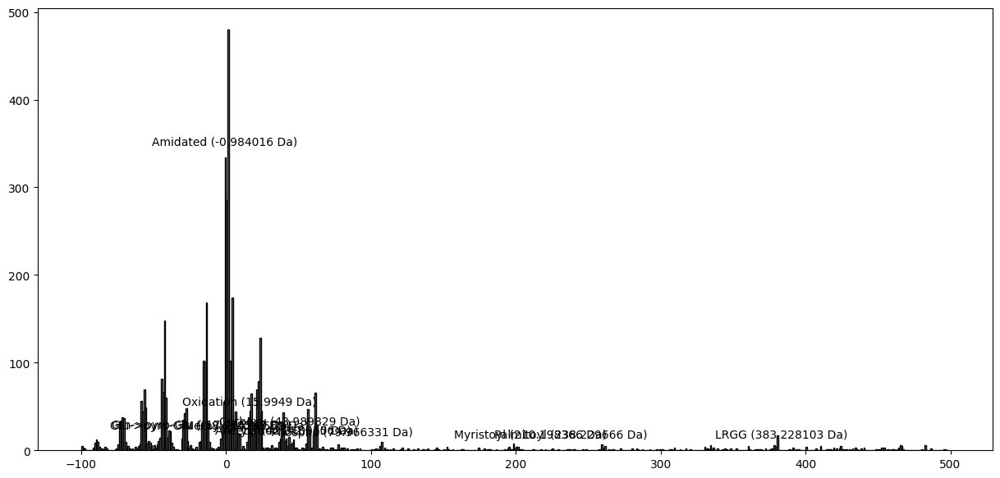

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/190507_Thermo_Std_FD2_ms1.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# This placeholder assumes your dataset has a column 'Observed Mass' or similar
# If not, replace 'Observed Mass' with the appropriate column name
observed_masses = df['MonoisotopicMass'].values

# Calculate the closest delta mass for each observed mass
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Define bins for the histogram, focusing around common PTM delta masses
bins = np.arange(-100, 500, 1)  # Adjust this range and bin width as necessary

# Plotting the histogram
plt.figure(figsize=(15, 7))
counts, _, patches = plt.hist(delta_masses, bins=bins, color='gray', edgecolor='black')

# Annotate specific PTMs, these should be known delta masses of interest
ptms = {
  "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}

# Adding annotations for the PTMs
for ptm, mass in ptms.items():
    plt.annotate(f'{ptm} ({mass} Da)', xy=(mass, counts[np.digitize(mass, bins) - 1] + 5),
                 xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')

# Labeling the plot
plt.title('Histogram of Mass Shifts Relative to True Masses with PTM Annotations')
plt.xlabel('Delta Mass (Da)')
plt.ylabel('Frequency')
plt.grid(True)

# Show the plot
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.palettes import Category20_20
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.1)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Define the PTMs and their masses
ptms = {
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return 0

# Calculate modified masses for each true mass with each PTM
modified_masses = []
colors = []
labels = []
for mass in true_masses:
    for ptm, delta_mass in ptms.items():
        mod_mass = mass + delta_mass
        intensity = find_nearest_intensity(mod_mass, filtered_df, width=10)
        if intensity > 0:
            modified_masses.append((mod_mass, intensity))
            colors.append(ptm)
            labels.append(f"{ptm} (+{delta_mass})")

# Create a ColumnDataSource for the modified masses
source = ColumnDataSource(data=dict(x=[m[0] for m in modified_masses], y=[m[1] for m in modified_masses], color=colors, label=labels))

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title='PTM ',
           tools='xwheel_zoom,xpan,box_zoom,undo,reset', tooltips="@label: @x{0.0000} Da")

# Add a vertical bar plot to the figure for each PTM
p.circle('x', 'y', size=8, source=source,
         color=factor_cmap('color', palette=Category20_20, factors=colors), legend_field='color')

# Configure plot aesthetics
p.legend.title = 'PTM Type'
p.legend.location = 'top_right'
p.xaxis.axis_label = "Mass/Da"
p.yaxis.axis_label = "Intensity"

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.palettes import Category20_20
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.05)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Define the PTMs and their masses
ptms = {
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return 0

# Calculate modified masses for each true mass with each PTM and collect true mass intensities
modified_masses = []
true_mass_intensities = []
colors = []
labels = []
for mass in true_masses:
    # Add true mass peaks
    true_intensity = find_nearest_intensity(mass, filtered_df, width=10)
    true_mass_intensities.append((mass, true_intensity))

    # Add modified masses
    for ptm, delta_mass in ptms.items():
        mod_mass = mass + delta_mass
        intensity = find_nearest_intensity(mod_mass, filtered_df, width=10)
        if intensity > 0:
            modified_masses.append((mod_mass, intensity))
            colors.append(ptm)
            labels.append(f"{ptm} (+{delta_mass})")

# Create ColumnDataSource for the modified and true masses
modified_source = ColumnDataSource(data=dict(x=[m[0] for m in modified_masses], y=[m[1] for m in modified_masses], color=colors, label=labels))
true_mass_source = ColumnDataSource(data=dict(x=[m[0] for m in true_mass_intensities], y=[m[1] for m in true_mass_intensities]))

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title='Peptide Fragmentation Mass Spectrum',
           tools='xwheel_zoom,xpan,box_zoom,undo,reset', tooltips="@label: @x{0.0000} Da")

# Add circles for PTM-modified masses
p.circle('x', 'y', size=8, source=modified_source,
         color=factor_cmap('color', palette=Category20_20, factors=colors), legend_field='color')

# Add large red circles for true masses
p.circle('x', 'y', size=15, color="red", source=true_mass_source, legend_label='True Masses')

# Configure plot aesthetics
p.legend.title = 'PTM Type and True Masses'
p.legend.location = 'top_right'
p.xaxis.axis_label = "Mass/Da"
p.yaxis.axis_label = "Intensity"

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.palettes import Category20_20
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.1)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Define the PTMs and their masses
ptms = {
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920

}

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return 0

# Calculate modified masses and collect true mass intensities
modified_masses = []
true_mass_intensities = []
colors = []
labels = []
for mass in true_masses:
    true_intensity = find_nearest_intensity(mass, filtered_df, width=10)
    true_mass_intensities.append((mass, true_intensity))  # Collect true mass data
    for ptm, delta_mass in ptms.items():
        mod_mass = mass + delta_mass
        intensity = find_nearest_intensity(mod_mass, filtered_df, width=10)
        if intensity > 0:
            modified_masses.append((mod_mass, intensity))
            colors.append(ptm)
            labels.append(f"{ptm} (+{delta_mass})")

# Create ColumnDataSource for the modified and true masses
modified_source = ColumnDataSource(data=dict(x=[m[0] for m in modified_masses], y=[m[1] for m in modified_masses], color=colors, label=labels))
true_mass_source = ColumnDataSource(data=dict(x=[m[0] for m in true_mass_intensities], y=[m[1] for m in true_mass_intensities]))

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title='Peptide Fragmentation Mass Spectrum',
           tools='xwheel_zoom,xpan,box_zoom,undo,reset', tooltips="@label: @x{0.0000} Da")

# Add circles for PTM-modified masses
p.circle('x', 'y', size=8, source=modified_source,
         color=factor_cmap('color', palette=Category20_20, factors=colors), legend_field='color')

# Add squares for true masses
p.square('x', 'y', size=10, color="black", source=true_mass_source, legend_label='True Masses')

# Configure plot aesthetics
#p.legend.title = 'PTM Type and True Masses'
#p.legend.location = 'top_right'
p.xaxis.axis_label = "Mass/Da"
p.yaxis.axis_label = "Intensity"

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
from bokeh.transform import factor_cmap
from bokeh.palettes import Category20_20

# Step 1: Load the dataset
df = pd.read_csv('/content/190507_Thermo_Std_FD2_ms1.tsv', sep='\t')

# Step 2: Define true masses, PTMs, and set tolerances
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])
ptms = {
   "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}
ppm_tolerance = 10  # PPM tolerance
isotope_tolerance = 1.0  # ±1 Da isotope error tolerance

# Step 3: Filter the data for Targets (TargetDecoyType = 0)
filtered_targets = df[df['TargetDecoyType'] == 0]

# Step 4: Find true positives and false positives based on tolerance
true_positives = []
false_positives = []

# Function to check if a mass matches within PPM or isotope tolerance
def matches_true_mass(observed_mass):
    for true_mass in true_masses:
        ppm_difference = abs((observed_mass - true_mass) / true_mass * 1e6)
        within_ppm = ppm_difference <= ppm_tolerance
        within_isotope_error = abs(observed_mass - true_mass) <= isotope_tolerance

        if within_ppm or within_isotope_error:
            return True
    return False

# Classify each target as a true positive or false positive
for _, row in filtered_targets.iterrows():
    observed_mass = row['MonoisotopicMass']
    if matches_true_mass(observed_mass):
        true_positives.append(row)
    else:
        false_positives.append(row)

# Step 5: Find decoys (TargetDecoyType > 0)
decoys = df[df['TargetDecoyType'] > 0]

# Step 6: Calculate FDR
total_targets = len(true_positives) + len(false_positives)
false_positives_count = len(false_positives)
fdr = (false_positives_count / total_targets) * 100  # FDR as a percentage

# Step 7: Visualize results with Bokeh
output_notebook()

# Create ColumnDataSource for Bokeh plot
true_positive_source = ColumnDataSource(data={
    'x': [row['MonoisotopicMass'] for row in true_positives],
    'y': [row['SumIntensity'] for row in true_positives],
})

false_positive_source = ColumnDataSource(data={
    'x': [row['MonoisotopicMass'] for row in false_positives],
    'y': [row['SumIntensity'] for row in false_positives],
})

decoy_source = ColumnDataSource(data={
    'x': [row['MonoisotopicMass'] for row in decoys],
    'y': [row['SumIntensity'] for row in decoys],
})

# Create the Bokeh plot
p = figure(
    width=800,
    height=400,
    title=f"Mass Spectrometry Data (FDR: {fdr:.2f}%)",
    tools="xwheel_zoom,xpan,box_zoom,undo,reset,hover",
    tooltips="@x{0.0000} Da: @y"
)

# Plot true positives, false positives, and decoys
p.circle('x', 'y', source=true_positive_source, color="blue", size=8, legend_label="True Positives")
p.square('x', 'y', source=false_positive_source, color="red", size=8, legend_label="False Positives")
p.triangle('x', 'y', source=decoy_source, color="green", size=8, legend_label="Decoys")

# Configure plot labels and legend
p.xaxis.axis_label = "Monoisotopic Mass (Da)"
p.yaxis.axis_label = "Intensity"
p.legend.title = "Mass Type"
p.legend.location = "top_right"

# Show the plot
show(p)


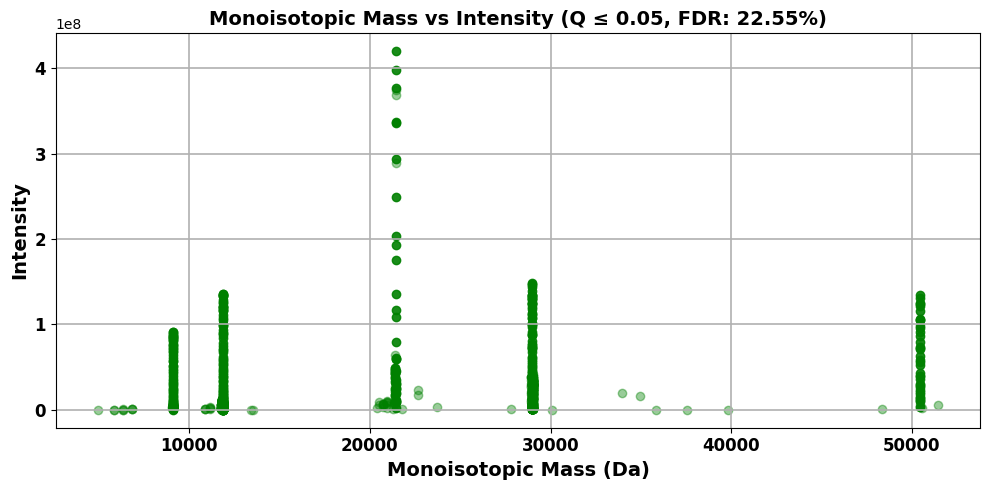

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define constants
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])
ptm_deltas = [-89.03, -74, -73, -59, -58, -45, -30, -18, -16, -1, 1, 15, 16, 21, 22, 23, 38, 56, 57]

ppm_tolerance = 50
isotope_tolerance = 1.0
delta_mass_tolerance = 0.5
q_value_threshold = 0.05

# Filter by Q-value
filtered_df = df[df['Qvalue'] <= q_value_threshold]

# Matching function
def is_true_positive(mass):
    for true_mass in true_masses:
        if abs((mass - true_mass) / true_mass * 1e6) <= ppm_tolerance:
            return True
        if abs(mass - true_mass) <= isotope_tolerance:
            return True
        for delta in ptm_deltas:
            if abs(mass - (true_mass + delta)) <= delta_mass_tolerance:
                return True
    return False

# Classify
true_pos = filtered_df[filtered_df['MonoisotopicMass'].apply(is_true_positive)]
false_pos = filtered_df[~filtered_df['MonoisotopicMass'].apply(is_true_positive)]

# Plot
plt.figure(figsize=(10, 5))
plt.scatter(true_pos['MonoisotopicMass'], true_pos['SumIntensity'], color='green', alpha=0.9)
plt.scatter(false_pos['MonoisotopicMass'], false_pos['SumIntensity'], color='green', alpha=0.4)

# Styling
plt.xlabel("Monoisotopic Mass (Da)", fontsize=14, fontweight='bold')
plt.ylabel("Intensity", fontsize=14, fontweight='bold')
plt.title(f"Monoisotopic Mass vs Intensity (Q ≤ {q_value_threshold}, FDR: {len(false_pos)/(len(true_pos)+len(false_pos))*100:.2f}%)",
          fontsize=14, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.grid(True, linewidth=1.2)
plt.tight_layout()
plt.show()


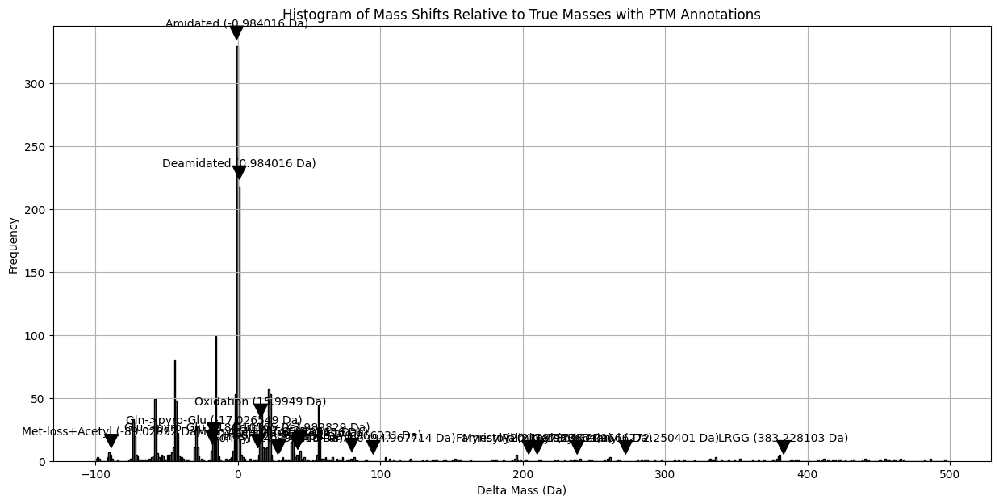

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# This assumes your dataset has a column 'Observed Mass'
observed_masses = df['MonoisotopicMass'].values  # Ensure this column exists or adjust accordingly

# Calculate the closest delta mass for each observed mass
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Define bins for the histogram, focusing around common PTM delta masses
bins = np.arange(-100, 500, 1)  # Adjust this range and bin width as necessary

# Plotting the histogram
plt.figure(figsize=(15, 7))
counts, bins_array, patches = plt.hist(delta_masses, bins=bins, color='gray', edgecolor='black')

# Annotate specific PTMs, these should be known delta masses of interest
ptms ={
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
       }


# Adding annotations for the PTMs
for ptm, mass in ptms.items():
    index = np.digitize(mass, bins_array) - 1
    index = min(index, len(counts) - 1)  # Ensure index does not go out of bounds
    height = counts[index]
    plt.annotate(f'{ptm} ({mass} Da)', xy=(mass, height + 5),
                 xytext=(0, 10), textcoords='offset points',
                 ha='center', va='bottom', arrowprops=dict(facecolor='black', shrink=0.05))

# Labeling the plot
plt.title('Histogram of Mass Shifts Relative to True Masses with PTM Annotations')
plt.xlabel('Delta Mass (Da)')
plt.ylabel('Frequency')
plt.grid(True)

# Show the plot
plt.show()


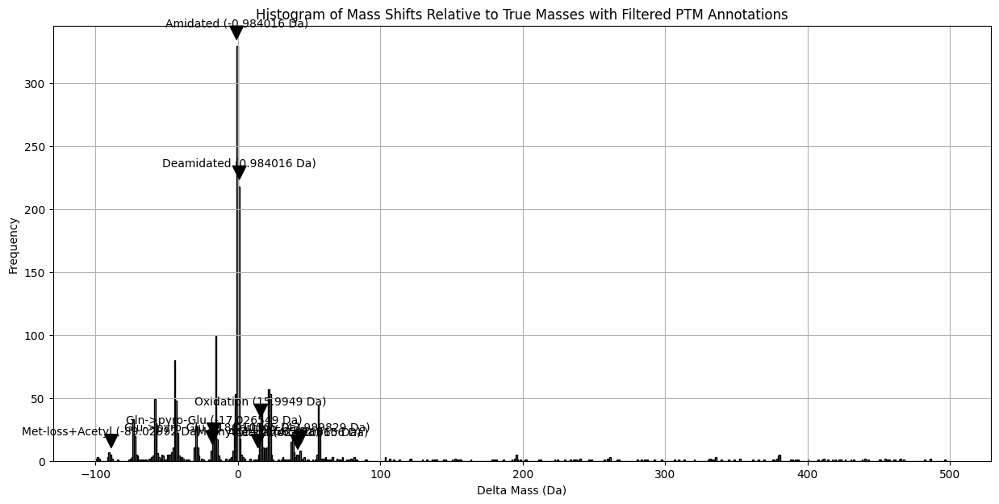

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# This assumes your dataset has a column 'Observed Mass'
observed_masses = df['MonoisotopicMass'].values  # Ensure this column exists or adjust accordingly

# PTMs and their associated mass shifts
ptms = {
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}

# Calculate all delta masses
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Count occurrences of each PTM-related delta mass
ptm_counts = {ptm: np.sum((delta_masses >= shift - 0.5) & (delta_masses <= shift + 0.5)) for ptm, shift in ptms.items()}

# Filter PTMs to include only those with more than two occurrences
filtered_ptms = {ptm: shift for ptm, shift in ptms.items() if ptm_counts[ptm] >= 2}

# Define bins for the histogram
bins = np.arange(-100, 500, 1)  # Adjust this range and bin width as necessary

# Plotting the histogram
plt.figure(figsize=(15, 7))
counts, bins_array, patches = plt.hist(delta_masses, bins=bins, color='gray', edgecolor='black')

# Annotating the PTMs that meet the criteria
for ptm, mass in filtered_ptms.items():
    index = np.digitize(mass, bins_array) - 1
    index = min(index, len(counts) - 1)  # Ensure index does not go out of bounds
    height = counts[index]
    plt.annotate(f'{ptm} ({mass} Da)', xy=(mass, height + 5),
                 xytext=(0, 10), textcoords='offset points',
                 ha='center', va='bottom', arrowprops=dict(facecolor='black', shrink=0.05))

# Labeling the plot
plt.title('Histogram of Mass Shifts Relative to True Masses with Filtered PTM Annotations')
plt.xlabel('Delta Mass (Da)')
plt.ylabel('Frequency')
plt.grid(True)

# Show the plot
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Assume you have calculated the observed mass somewhere
observed_masses = df['MonoisotopicMass'].values  # Adjust according to your column name

# Calculate all delta masses
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Bins for the histogram
bins = np.arange(-100, 500, 1)  # Adjust as necessary
hist, edges = np.histogram(delta_masses, bins=bins)

# Prepare labels for PTMs, initially empty, filled only where applicable
labels = [''] * len(hist)
ptms = {
     "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}
# Assign labels at relevant positions
for ptm, shift in ptms.items():
    bin_index = np.digitize([shift], bins)[0] - 1  # Get the bin index for each PTM
    if bin_index < len(labels):
        labels[bin_index] = f'{ptm} ({shift} Da)'

# Create ColumnDataSource
source = ColumnDataSource(data={
    'top': hist,
    'left': edges[:-1],
    'right': edges[1:],
    'label': labels
})

# Output to notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title="PTM Delta Mass Histogram",
           tools="pan,wheel_zoom,box_zoom,reset", x_axis_label='Delta Mass (Da)', y_axis_label='Frequency')

# Add quads for the histogram
p.quad(bottom=0, top='top', left='left', right='right', source=source, fill_color='gray', line_color='black')

# Add hover tool
hover = HoverTool(tooltips=[("PTM", "@label"), ("Count", "@top")])
p.add_tools(hover)

# Show the plot
show(p)


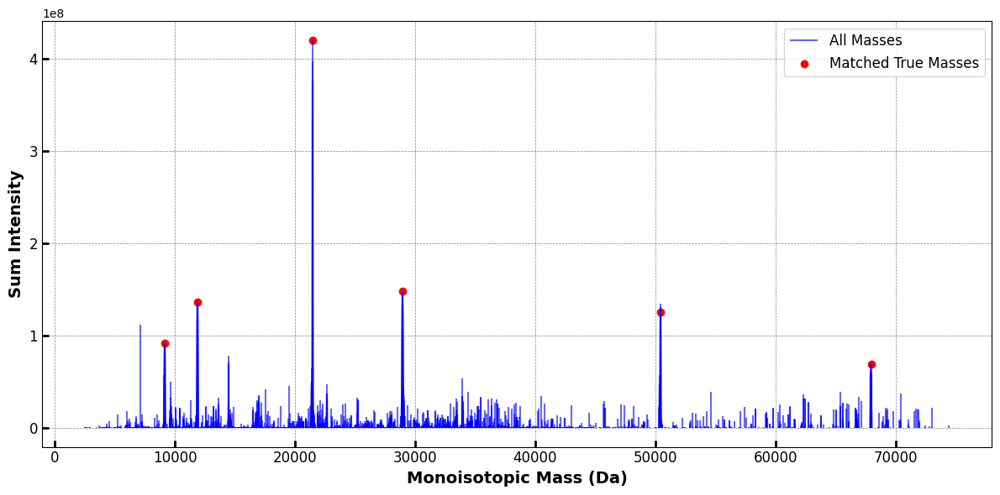

      MonoisotopicMass  SumIntensity
582        9105.285067    91541700.0
1163      11857.723558   136085000.0
183       21429.360681   419752000.0
2126      28963.621165   148072000.0
279       50428.740350   124799000.0
4635      67958.993181    69136800.0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("/content/Experimental deconvolved file.tsv", sep="\t")

# List of known true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# ppm tolerance
ppm_tolerance = 30

# Function to compute ppm difference
def ppm_diff(m1, m2):
    return abs(m1 - m2) / m2 * 1e6

# Match each true mass once using the highest intensity match
matched_rows = []
for true_mass in true_masses:
    candidates = df[df['MonoisotopicMass'].apply(lambda x: ppm_diff(x, true_mass) <= ppm_tolerance)]
    if not candidates.empty:
        best_match = candidates.loc[candidates['SumIntensity'].idxmax()]
        matched_rows.append(best_match)

# Create DataFrame of matched rows
matched_df = pd.DataFrame(matched_rows)

# Plot all masses as blue peaks
plt.figure(figsize=(12, 6))
plt.vlines(df['MonoisotopicMass'], 0, df['SumIntensity'], color='blue', alpha=0.6, label='All Masses')

# Overlay red dots for matched true masses
plt.scatter(matched_df['MonoisotopicMass'], matched_df['SumIntensity'], color='red', label='Matched True Masses')

# Annotate only true masses above the red dots
for true_mass in true_masses:
    matched_row = matched_df[matched_df['MonoisotopicMass'] == true_mass]
    if not matched_row.empty:
        plt.text(true_mass, matched_row['SumIntensity'].values[0], f"{true_mass:.1f}",
                 color='black', fontsize=10, ha='center', va='bottom', fontweight='bold')

# Labels and formatting with enhanced clarity for publication quality
plt.xlabel("Monoisotopic Mass (Da)", fontsize=14, fontweight='bold', color='black')
plt.ylabel("Sum Intensity", fontsize=14, fontweight='bold', color='black')
#plt.title("Mass Spectrum with Unique True Mass Matches Highlighted", fontsize=16, fontweight='bold', color='black')
plt.legend(fontsize=12)

# Make the grid lighter and adjust its appearance
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')

# Apply a darker background for better contrast
plt.gca().set_facecolor('white')

# Adjust tick parameters for clarity
plt.tick_params(axis='both', which='major', labelsize=12, length=6, width=2, direction='in', colors='black')

# Make the plot tight for a clean layout
plt.tight_layout()
plt.show()

# Optionally print the matches
print(matched_df[['MonoisotopicMass', 'SumIntensity']])


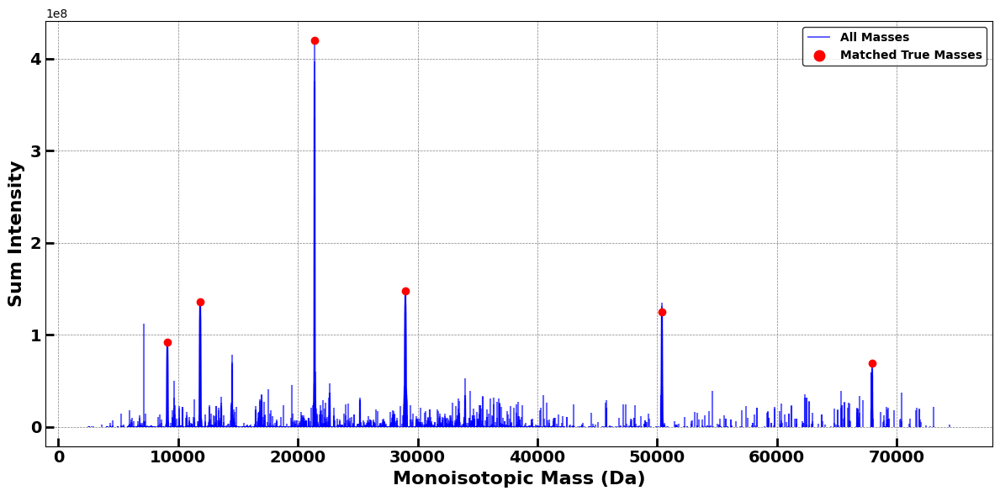

      MonoisotopicMass  SumIntensity
582        9105.285067    91541700.0
1163      11857.723558   136085000.0
183       21429.360681   419752000.0
2126      28963.621165   148072000.0
279       50428.740350   124799000.0
4635      67958.993181    69136800.0


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("/content/Experimental deconvolved file.tsv", sep="\t")

# List of known true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# ppm tolerance
ppm_tolerance = 30

# Function to compute ppm difference
def ppm_diff(m1, m2):
    return abs(m1 - m2) / m2 * 1e6

# Match each true mass once using the highest intensity match
matched_rows = []
for true_mass in true_masses:
    candidates = df[df['MonoisotopicMass'].apply(lambda x: ppm_diff(x, true_mass) <= ppm_tolerance)]
    if not candidates.empty:
        best_match = candidates.loc[candidates['SumIntensity'].idxmax()]
        matched_rows.append(best_match)

# Create DataFrame of matched rows
matched_df = pd.DataFrame(matched_rows)

# Plot all masses as blue peaks
plt.figure(figsize=(12, 6))
plt.vlines(df['MonoisotopicMass'], 0, df['SumIntensity'], color='blue', alpha=0.6, label='All Masses')

# Overlay red dots for matched true masses
plt.scatter(matched_df['MonoisotopicMass'], matched_df['SumIntensity'], color='red', label='Matched True Masses', zorder=5)



# Labels and formatting with enhanced clarity for publication quality
plt.xlabel("Monoisotopic Mass (Da)", fontsize=16, fontweight='bold', color='black')
plt.ylabel("Sum Intensity", fontsize=16, fontweight='bold', color='black')

plt.legend(
    fontsize=20,            # Increase text size
    frameon=True,
    edgecolor='black',
    facecolor='white',
    prop={'weight': 'bold'},
    loc='upper right',      # Explicit legend location
    markerscale=1.5         # Scale up marker size in legend
)


# Make the grid lighter and adjust its appearance
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')

# Apply a white background for better contrast
plt.gca().set_facecolor('white')

# Adjust tick parameters for clarity and bold black ticks
plt.tick_params(axis='both', which='major', labelsize=14, length=7, width=2, direction='in', colors='black')

# Make the tick labels bold and black
plt.gca().xaxis.set_tick_params(labelsize=14)
plt.gca().yaxis.set_tick_params(labelsize=14)
for label in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
    label.set_fontweight('bold')
    label.set_color('black')

# Tight layout for clean plot
plt.tight_layout()
plt.show()

# Optionally print the matches
print(matched_df[['MonoisotopicMass', 'SumIntensity']])


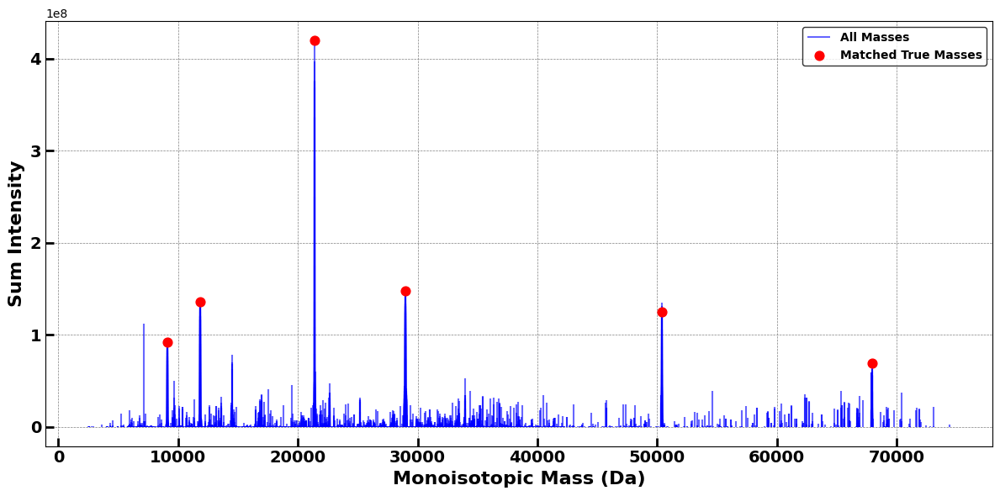

      MonoisotopicMass  SumIntensity
582        9105.285067    91541700.0
1163      11857.723558   136085000.0
183       21429.360681   419752000.0
2126      28963.621165   148072000.0
279       50428.740350   124799000.0
4635      67958.993181    69136800.0


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("/content/Experimental deconvolved file.tsv", sep="\t")

# Known true proteoform monoisotopic masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Set PPM tolerance for matching
ppm_tolerance = 30

# Function to compute PPM difference
def ppm_diff(observed, reference):
    return abs(observed - reference) / reference * 1e6

# Find the best (highest intensity) match for each true mass
matched_rows = []
for tm in true_masses:
    candidates = df[df['MonoisotopicMass'].apply(lambda m: ppm_diff(m, tm) <= ppm_tolerance)]
    if not candidates.empty:
        best_match = candidates.loc[candidates['SumIntensity'].idxmax()]
        matched_rows.append(best_match)

# Create a DataFrame of matched true masses
matched_df = pd.DataFrame(matched_rows)

# Begin plotting
plt.figure(figsize=(12, 6))

# Plot all peaks in blue
plt.vlines(df['MonoisotopicMass'], 0, df['SumIntensity'], color='blue', alpha=0.6, label='All Masses')

# Highlight matched true masses in red
plt.scatter(matched_df['MonoisotopicMass'], matched_df['SumIntensity'],
            color='red', s=60, label='Matched True Masses', zorder=5)

# Labels
plt.xlabel("Monoisotopic Mass (Da)", fontsize=16, fontweight='bold', color='black')
plt.ylabel("Sum Intensity", fontsize=16, fontweight='bold', color='black')

# Legend (optional: remove if you don't want it)
plt.legend(fontsize=14, frameon=True, edgecolor='black', facecolor='white',
           prop={'weight': 'bold'})

# Grid style
plt.grid(True, linestyle='--', linewidth=0.5, color='gray')

# Axis and tick styling
ax = plt.gca()
ax.set_facecolor('white')
ax.tick_params(axis='both', which='major', labelsize=14, length=7,
               width=2, direction='in', colors='black')

# Bold tick labels
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontweight('bold')
    label.set_color('black')

# Layout adjustment
plt.tight_layout()
plt.show()

# Print matched results
print(matched_df[['MonoisotopicMass', 'SumIntensity']])


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Assume you have calculated the observed mass somewhere
observed_masses = df['MonoisotopicMass'].values  # Adjust according to your column name

# Calculate all delta masses
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Bins for the histogram
bins = np.arange(-100, 500, 1)  # Adjust as necessary
hist, edges = np.histogram(delta_masses, bins=bins)

# Prepare labels for PTMs, initially empty, filled only where applicable
labels = [''] * len(hist)
ptms = {
      "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    "Acetyl": 42.010565,
    "Amidated": -0.984016,
    "Methyl": 14.015650,
    "LRGG": 383.228103,
    "Glu->pyro-Glu": -18.010565,
    "Gln->pyro-Glu": -17.026549,
    "Carboxy": 43.989829,
    "Palmitoyl": 238.229666,
    "Myristoyl": 210.198366,
    "ADP-Ribosyl": 541.061110,
    "Farnesyl": 204.187801,
    "Nitrosyl": 28.990164,
    "GeranylGeranyl": 272.250401,
    "Formyl": 27.994915,
    "Deamidated": 0.984016,
    "Sulfo+amino": 94.967714,
    "Met-loss": -131.040485,
    "Met-loss+Acetyl": -89.029920
}
# Assign labels at relevant positions
for ptm, shift in ptms.items():
    bin_index = np.digitize([shift], bins)[0] - 1  # Get the bin index for each PTM
    if bin_index < len(labels):
        labels[bin_index] = f'{ptm} ({shift} Da)'

# Create ColumnDataSource
source = ColumnDataSource(data={
    'top': hist,
    'left': edges[:-1],
    'right': edges[1:],
    'label': labels
})

# Output to notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title="PTM Delta Mass Histogram",
           tools="pan,wheel_zoom,box_zoom,reset", x_axis_label='Delta Mass (Da)', y_axis_label='Frequency')

# Add quads for the histogram
p.quad(bottom=0, top='top', left='left', right='right', source=source, fill_color='gray', line_color='black')

# Add hover tool
hover = HoverTool(tooltips=[("PTM", "@label"), ("Count", "@top")])
p.add_tools(hover)

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Calculate observed mass and delta masses
observed_masses = df['MonoisotopicMass'].values
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Bins for the histogram
bins = np.arange(-100, 500, 1)
hist, edges = np.histogram(delta_masses, bins=bins)

# Prepare labels for PTMs, initially empty, filled only where applicable
labels = [''] * len(hist)
ptms = {
    "Oxidation": 15.9949,
    "Acetylation": 42.0106,
    "Phospho": 79.966331,
    # Additional PTMs...
}

# Assign labels at relevant positions
for ptm, shift in ptms.items():
    bin_index = np.digitize([shift], bins)[0] - 1
    if bin_index < len(labels):
        labels[bin_index] = f'{ptm} ({shift} Da)'

# Create ColumnDataSource
source = ColumnDataSource(data={
    'top': hist,
    'left': edges[:-1],
    'right': edges[1:],
    'label': labels
})

# Output to notebook
output_notebook()

# Create the plot without grid lines
p = figure(width=800, height=300, title="PTM Delta Mass Histogram",
           tools="pan,wheel_zoom,box_zoom,reset",
           x_axis_label='Delta Mass (Da)', y_axis_label='Frequency')

# Remove grid lines
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add quads for the histogram
p.quad(bottom=0, top='top', left='left', right='right', source=source, fill_color='gray', line_color='black')

# Add hover tool
hover = HoverTool(tooltips=[("PTM", "@label"), ("Count", "@top")])
p.add_tools(hover)

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool, LabelSet
from bokeh.layouts import column

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Assuming 'Observed Mass' column exists in your dataset, calculate delta masses
observed_masses = df['MonoisotopicMass'].values  # Replace 'Observed Mass' with the actual column name if different

# Calculate all delta masses
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Bins for the histogram
bins = np.arange(-100, 500, 1)  # Adjust as necessary
hist, edges = np.histogram(delta_masses, bins=bins)

# Create ColumnDataSource for the histogram
hist_source = ColumnDataSource(data={
    'top': hist,
    'left': edges[:-1],
    'right': edges[1:]
})

# Define PTMs and their associated mass shifts
ptms = {
     "Oxidation": 16,
    "Acetylation": 42,
    "Phospho": 80,
    "Acetyl": 42,
    "Amidated": -1,
    "Methyl": 14,
    "LRGG": 383,
    "Glu->pyro-Glu": -18,
    "Gln->pyro-Glu": -17,
    "Carboxy": 44,
    "Palmitoyl": 238,
    "Myristoyl": 210,
    "ADP-Ribosyl": 541,
    "Farnesyl": 204,
    "Nitrosyl": 29,
    "GeranylGeranyl": 272,
    "Formyl": 28,
    "Deamidated": 1,
    "Sulfo+amino": 95,
    "Met-loss": -131,
    "Met-loss+Acetyl": -89
}

# Prepare data for PTM labels
ptm_data = {
    'x': [],
    'y': [],
    'text': []
}
for ptm, shift in ptms.items():
    bin_index = np.digitize([shift], bins)[0] - 1
    if bin_index < len(hist) and hist[bin_index] > 0:
        ptm_data['x'].append(shift)
        ptm_data['y'].append(hist[bin_index] + 5)  # slightly above the histogram bar
        ptm_data['text'].append(f'{ptm} ({shift} Da)')

# Create ColumnDataSource for PTM labels
label_source = ColumnDataSource(data=ptm_data)

# Output to notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title="PTM Delta Mass Histogram",
           tools="pan,wheel_zoom,box_zoom,reset", x_axis_label='Delta Mass (Da)', y_axis_label='Frequency')

# Add quads for the histogram
p.quad(bottom=0, top='top', left='left', right='right', source=hist_source, fill_color='gray', line_color='black')

# Add labels for PTMs
labels = LabelSet(x='x', y='y', text='text', level='glyph',
                  x_offset=5, y_offset=5, source=label_source, text_font_size="8pt", text_color="black")
p.add_layout(labels)

# Add hover tool that will display the count
hover = HoverTool(tooltips=[("Count", "@top"), ("Delta Mass", "@left{0.0}")])
p.add_tools(hover)

# Show the plot
show(p)


In [ ]:
import pandas as pd
import numpy as np

# Load the deconvolved data
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Set your Q-value thresholds
q_thresholds = [0.005, 0.01, 0.05, 0.1]

# Define true proteoform masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Define annotated PTM delta masses (from histogram)
annotated_deltas = np.array([-89.03, -74, -73, -59, -58, -45, -30, -18, -16, -1, 1, 15, 16, 21, 22, 23, 38, 56, 57])

# Mass tolerance
mass_tol = 50

for q_thresh in q_thresholds:
    subset = df[df['Qvalue'] <= q_thresh]
    obs_masses = subset['MonoisotopicMass'].values

    tp = 0
    fp = 0

    for obs in obs_masses:
        match_found = False

        # Check direct match with true masses
        if np.any(np.abs(obs - true_masses) <= mass_tol):
            match_found = True
        else:
            # Check if difference between observed and true matches a delta mass
            for tm in true_masses:
                delta = obs - tm
                if np.any(np.abs(delta - annotated_deltas) <= 1):  # 1 Da tolerance for PTMs
                    match_found = True
                    break

        if match_found:
            tp += 1
        else:
            fp += 1

    print(f"Q ≤ {q_thresh*100:.1f}%: TP = {tp}, FP = {fp}, FDR = {100*fp/(tp+fp):.2f}%")


Q ≤ 0.5%: TP = 269, FP = 7, FDR = 2.54%
Q ≤ 1.0%: TP = 422, FP = 13, FDR = 2.99%
Q ≤ 5.0%: TP = 839, FP = 48, FDR = 5.41%
Q ≤ 10.0%: TP = 1004, FP = 104, FDR = 9.39%


In [ ]:
import pandas as pd
import numpy as np

# Load the deconvolved data
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Set your Q-value thresholds
q_thresholds = [0.005, 0.01, 0.05, 0.1]

# Define true proteoform masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Define annotated PTM delta masses (from histogram)
annotated_deltas = np.array([
    -89.03, -74, -73, -59, -58, -45, -30, -18, -16, -1,
    1, 15, 16, 21, 22, 23, 38, 56, 57
])

# Tolerances
mass_tol = 5         # Tolerance for matching true proteoform masses
delta_mass_tol = 5    # Tolerance for matching PTM delta masses

# Evaluation loop
for q_thresh in q_thresholds:
    subset = df[df['Qvalue'] <= q_thresh]
    obs_masses = subset['MonoisotopicMass'].values

    tp = 0
    fp = 0

    for obs in obs_masses:
        match_found = False

        # Direct match to true masses
        if np.any(np.abs(obs - true_masses) <= mass_tol):
            match_found = True
        else:
            # Try matching delta mass
            for tm in true_masses:
                delta = obs - tm
                if np.any(np.abs(delta - annotated_deltas) <= delta_mass_tol):
                    match_found = True
                    break

        if match_found:
            tp += 1
        else:
            fp += 1

    total = tp + fp
    fdr = (100 * fp / total) if total > 0 else 0

    print(f"Q ≤ {q_thresh*100:.1f}%: TP = {tp}, FP = {fp}, Total = {total}, FDR = {fdr:.2f}%")


Q ≤ 0.5%: TP = 269, FP = 7, Total = 276, FDR = 2.54%
Q ≤ 1.0%: TP = 421, FP = 14, Total = 435, FDR = 3.22%
Q ≤ 5.0%: TP = 838, FP = 49, Total = 887, FDR = 5.52%
Q ≤ 10.0%: TP = 1002, FP = 106, Total = 1108, FDR = 9.57%


In [ ]:
import pandas as pd
import numpy as np
from bokeh.plotting import figure, show, output_notebook
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, HoverTool

output_notebook()

# Load data
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Settings
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])
annotated_deltas = np.array([-89.03, -74, -73, -59, -58, -45, -30, -18, -16, -1, 1, 15, 16, 21, 22, 23, 38, 56, 57])
mass_tol = 5
delta_tol = 1
q_thresholds = [0.005, 0.01, 0.05]

plots = []

for q_thresh in q_thresholds:
    subset = df[df['Qvalue'] <= q_thresh]
    obs_masses = subset['MonoisotopicMass'].values

    labels = []
    colors = []
    intensities = []

    for obs in obs_masses:
        is_tp = False

        # Direct match with true masses
        if np.any(np.abs(obs - true_masses) <= mass_tol):
            is_tp = True
        else:
            # Check if delta matches PTM
            for tm in true_masses:
                delta = obs - tm
                if np.any(np.abs(delta - annotated_deltas) <= delta_tol):
                    is_tp = True
                    break

        if is_tp:
            labels.append("TP")
            colors.append("green")
            intensities.append(1.0)
        else:
            labels.append("FP")
            colors.append("red")
            intensities.append(0.5)

    source = ColumnDataSource(data=dict(
        x=obs_masses,
        y=intensities,
        label=labels,
        color=colors
    ))

    p = figure(title=f"Q ≤ {q_thresh*100:.1f}%", width=800, height=300,
               x_axis_label='Monoisotopic Mass (Da)', y_axis_label='Intensity (arbitrary)',
               tools="pan,wheel_zoom,box_zoom,reset")

    p.vbar(x='x', top='y', width=30, fill_color='color', line_color='black', source=source)

    hover = HoverTool(tooltips=[("Mass", "@x"), ("Type", "@label")])
    p.add_tools(hover)

    plots.append(p)

# Show all plots
show(column(*plots))


Q ≤ 5.0%: TP = 837, FP = 50, Total = 887, FDR = 5.64%


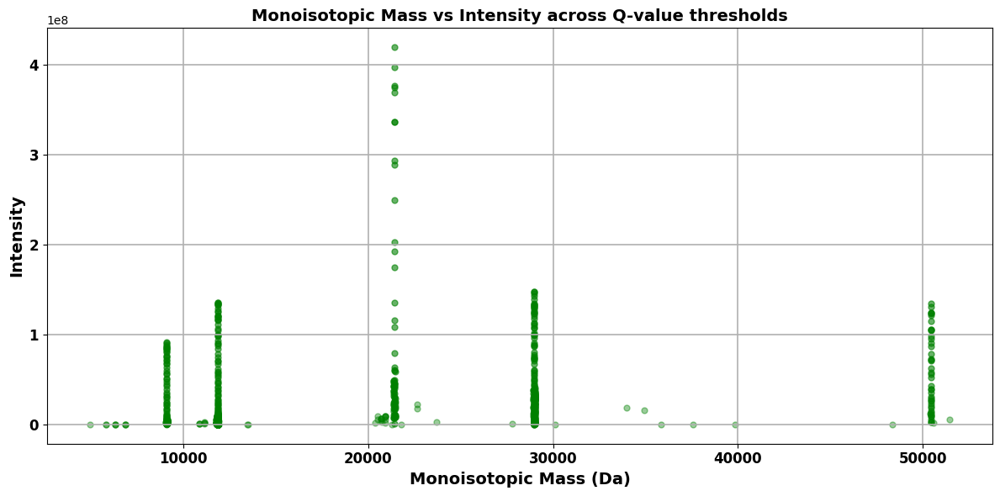

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the deconvolved data
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Set Q-value thresholds to evaluate
q_thresholds = [0.05]

# Define true proteoform masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Annotated PTM delta masses
annotated_deltas = np.array([-74, -73, -59, -58, -46, -45, -44, -31, -30, -18, -17, -16, -15, -3, -2, -1, 1, 15, 16, 17, 20, 21, 37, 56, 57])

# Tolerances
mass_tol = 3
delta_mass_tol = 3

# Plot setup
plt.figure(figsize=(12, 6))

# Colors for each threshold
colors = ['green']

for idx, q_thresh in enumerate(q_thresholds):
    subset = df[df['Qvalue'] <= q_thresh]
    obs_masses = subset['MonoisotopicMass'].values
    intensities = subset['SumIntensity'].values

    tp_x, tp_y = [], []
    fp_x, fp_y = [], []

    for mass, intensity in zip(obs_masses, intensities):
        match_found = False

        # Direct match
        if np.any(np.abs(mass - true_masses) <= mass_tol):
            match_found = True
        else:
            # Match with annotated delta mass
            for tm in true_masses:
                delta = mass - tm
                if np.any(np.abs(delta - annotated_deltas) <= delta_mass_tol):
                    match_found = True
                    break

        if match_found:
            tp_x.append(mass)
            tp_y.append(intensity)
        else:
            fp_x.append(mass)
            fp_y.append(intensity)

    # Plot TPs and FPs
    plt.scatter(tp_x, tp_y, color=colors[idx], alpha=0.6, s=25, label=f"Q ≤ {q_thresh} (TP)")
    plt.scatter(fp_x, fp_y, color=colors[idx], alpha=0.4, s=25)  # FPs with same color but faded

    # Print stats
    tp, fp = len(tp_x), len(fp_x)
    total = tp + fp
    fdr = (100 * fp / total) if total > 0 else 0
    print(f"Q ≤ {q_thresh*100:.1f}%: TP = {tp}, FP = {fp}, Total = {total}, FDR = {fdr:.2f}%")

# Formatting the plot
plt.xlabel("Monoisotopic Mass (Da)", fontsize=14, fontweight='bold')
plt.ylabel("Intensity", fontsize=14, fontweight='bold')
plt.title("Monoisotopic Mass vs Intensity across Q-value thresholds", fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True, linewidth=1.2)
#plt.legend(title='Thresholds (TP only)', fontsize=11, title_fontsize=12)
plt.tight_layout()
plt.show()


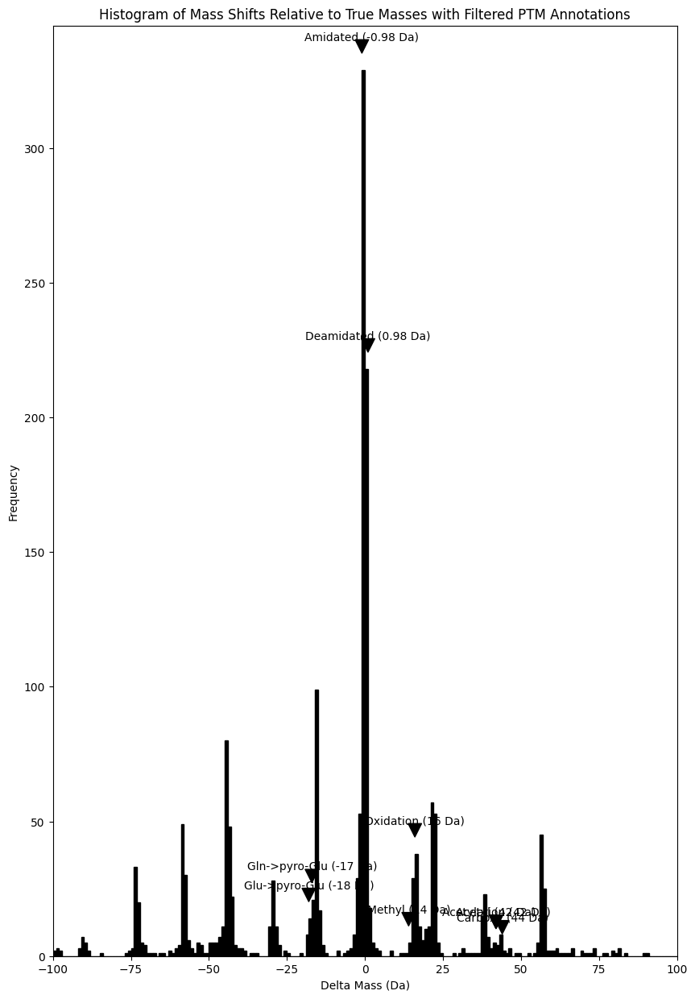

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# This assumes your dataset has a column 'Observed Mass'
observed_masses = df['MonoisotopicMass'].values  # Ensure this column exists or adjust accordingly

# PTMs and their associated mass shifts
ptms = {
    "Oxidation": 16,
    "Acetylation": 42,
    "Phospho": 80,
    "Acetyl": 42,
    "Amidated": -0.98,
    "Methyl": 14,
    "LRGG": 383,
    "Glu->pyro-Glu": -18,
    "Gln->pyro-Glu": -17,
    "Carboxy": 44,
    "Palmitoyl": 238,
    "Myristoyl": 210,
    "ADP-Ribosyl": 541,
    "Farnesyl": 204,
    "Nitrosyl": 29,
    "GeranylGeranyl": 272,
    "Formyl": 28,
    "Deamidated": 0.98,
    "Sulfo+amino": 95,
    "Met-loss": -131,
    "Met-loss+Acetyl": -89

}

# Calculate all delta masses
delta_masses = np.concatenate([observed_masses - mass for mass in true_masses])

# Count occurrences of each PTM-related delta mass
ptm_counts = {ptm: np.sum((delta_masses >= shift - 0.5) & (delta_masses <= shift + 0.5)) for ptm, shift in ptms.items()}

# Filter PTMs to include only those with more than two occurrences
filtered_ptms = {ptm: shift for ptm, shift in ptms.items() if ptm_counts[ptm] > 2}

# Define bins for the histogram
bins = np.arange(-100, 500, 1)  # Adjust this range and bin width as necessary

# Plotting the histogram
plt.figure(figsize=(10, 15))
counts, bins_array, patches = plt.hist(delta_masses, bins=bins, color='black', edgecolor='black')

# Annotating the PTMs that meet the criteria
for ptm, mass in filtered_ptms.items():
    index = np.digitize(mass, bins_array) - 1
    index = min(index, len(counts) - 1)  # Ensure index does not go out of bounds
    height = counts[index]
    plt.annotate(f'{ptm} ({mass} Da)', xy=(mass, height + 6),
                 xytext=(0, 10), textcoords='offset points',
                 ha='center', va='bottom', arrowprops=dict(facecolor='black', shrink=0.05))

# Labeling the plot
plt.title('Histogram of Mass Shifts Relative to True Masses with Filtered PTM Annotations')
plt.xlabel('Delta Mass (Da)')
plt.ylabel('Frequency')
plt.xlim(-100, 100)  # Limit x-axis from -100 to 100
plt.grid(False)

# Show the plot
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool, Legend
from bokeh.palettes import Category20_20
from bokeh.transform import factor_cmap

# Load the dataset
df = pd.read_csv('/content/190507_Thermo_Std_FD2_ms1.tsv', sep='\t')

# Apply the 5% FDR threshold to get significant results
q_value_threshold = 0.05
filtered_df = df[df['Qvalue'] <= q_value_threshold]

# Separate targets and decoys based on TargetDecoyType
targets = filtered_df[filtered_df['TargetDecoyType'] == 0]  # All true positive targets
decoys = filtered_df[filtered_df['TargetDecoyType'] >= 1]  # All false positive decoys

# Calculate Estimated FDR
# If there are no targets, FDR cannot be calculated
if len(targets) > 0:
    estimated_fdr = len(decoys) / len(targets)
else:
    estimated_fdr = np.nan  # Not a Number if there are no targets

print("Estimated FDR:", estimated_fdr)

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Define the PTMs and their masses
ptms = {
   "Oxidation": 16,
    "Acetylation": 42,
    "Phospho": 80,
    "Acetyl": 42,
    "Amidated": -0.98,
    "Methyl": 14,
    "LRGG": 383,
    "Glu->pyro-Glu": -18,
    "Gln->pyro-Glu": -17,
    "Carboxy": 44,
    "Palmitoyl": 238,
    "Myristoyl": 210,
    "ADP-Ribosyl": 541,
    "Farnesyl": 204,
    "Nitrosyl": 29,
    "GeranylGeranyl": 272,
    "Formyl": 28,
    "Deamidated": 0.98,
    "Sulfo+amino": 95,
    "Met-loss": -131,
    "Met-loss+Acetyl": -89
}

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) &
                            (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return 0

# Collect modified masses and keep only those with more than 2 occurrences
def collect_modified_masses(true_masses, ptms, df, width=10):
    modified_masses = []
    colors = []
    labels = []

    for mass in true_masses:
        for ptm, delta_mass in ptms.items():
            mod_mass = mass + delta_mass
            intensity = find_nearest_intensity(mod_mass, df, width)
            if intensity > 0:
                modified_masses.append((mod_mass, intensity, ptm))
                colors.append(ptm)
                labels.append(f"{ptm} (+{delta_mass})")

    # Filter out modifications that don't appear at least twice
    ptm_count = pd.DataFrame(modified_masses, columns=["Mass", "Intensity", "PTM"])
    frequent_ptms = ptm_count["PTM"].value_counts()
    valid_ptms = frequent_ptms[frequent_ptms >= 2].index

    final_masses = ptm_count[ptm_count["PTM"].isin(valid_ptms)]

    return final_masses

# Collect true and modified masses
true_mass_intensities = [(mass, find_nearest_intensity(mass, filtered_df, 10)) for mass in true_masses]
modified_masses = collect_modified_masses(true_masses, ptms, filtered_df)

# Create ColumnDataSource for the modified and true masses
modified_source = ColumnDataSource(data={
    'x': list(modified_masses["Mass"]),
    'y': list(modified_masses["Intensity"]),
    'color': list(modified_masses["PTM"]),
    'label': list(modified_masses["PTM"])
})

true_mass_source = ColumnDataSource(data={
    'x': [m[0] for m in true_mass_intensities],
    'y': [m[1] for m in true_mass_intensities]
})

# Configure Bokeh to display plots in the notebook
output_notebook()

# Create the plot
p = figure(width=800, height=300, title='Peptide Fragmentation Mass Spectrum',
           tools='xwheel_zoom,xpan,box_zoom,undo,reset',
           tooltips="@label: @x{0.0000} Da")

# Add circles for PTM-modified masses
p.circle('x', 'y', size=8, source=modified_source,
         color=factor_cmap('color', palette=Category20_20, factors=list(set(modified_masses["PTM"]))),
         legend_field='color')

# Add squares for true masses
p.square('x', 'y', size=10, color="black", source=true_mass_source, legend_label='True Masses')

# Configure plot aesthetics
p.legend.title = 'PTM Type and True Masses'
p.legend.location = 'top_right'
p.xaxis.axis_label = "Mass/Da"
p.yaxis.axis_label = "Intensity"

# Show the plot
show(p)


Estimated FDR: 0.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import pandas as pd
import numpy as np
from bokeh.io import show, export_png
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.io.export import export_png
!pip install selenium
from selenium import webdriver
from selenium.webdriver.chrome.options import Options

# Create ChromeOptions object
chrome_options = Options()

# Initialize ChromeDriver with options
driver = webdriver.Chrome('chromedriver', options=chrome_options)
driver.get("data:text/html;charset=utf-8,{html}".format(html=p.to_html()))
driver.save_screenshot("deconvolved_plot.png")
driver.quit()

# ... (rest of your code)

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.05)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    # Find the subset of dataframe where mass is within a certain window
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        # Return the highest intensity in this window
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return None

# Add markers for true masses
true_mass_markers = {'mass': [], 'intensity': [], 'label': []}
for mass in true_masses:
    intensity = find_nearest_intensity(mass, filtered_df)
    if intensity:
        true_mass_markers['mass'].append(mass)
        true_mass_markers['intensity'].append(intensity)
        true_mass_markers['label'].append(f'{mass:.4f}')

# Convert markers to ColumnDataSource
true_mass_cds = ColumnDataSource(data=true_mass_markers)

# Create a ColumnDataSource from the filtered DataFrame
cds = ColumnDataSource(data=filtered_df)

def create_p(width=800, height=300, main_title='Deconvolved PIP data set from FD'):
    tooltips = [
        ('m/z', '@MonoisotopicMass{0.0000}'),
        ('Int', '@SumIntensity')
    ]
    p = figure(
        width=width, height=height,
        title=main_title,
        tools='xwheel_zoom,xpan,box_zoom,undo,reset',
        tooltips=tooltips
    )
    return p

# Create the plot
p = create_p()

# Add a vertical bar plot to the figure
p.vbar(
    x='MonoisotopicMass', top='SumIntensity',
    source=cds,
    color='#324ea8',
    width=0.001  # Set the width of the bars
)

# Add red dots for true masses using scatter instead of circle
p.scatter(
    x='mass', y='intensity',
    source=true_mass_cds,
    size=10,
    color='red',
    marker='circle'  # Specify marker type
)

# Add labels above red dots
labels = LabelSet(x='mass', y='intensity', text='label', level='glyph',
                  x_offset=0, y_offset=3, source=true_mass_cds,
                  text_font_size="8pt", text_color="black")
p.add_layout(labels)

# Save the plot as a PNG file
export_png(p, filename="deconvolved_plot.png")

# Show the plot (optional)
show(p)


TypeError: WebDriver.__init__() got multiple values for argument 'options'

In [ ]:
!apt-get update
!apt install chromium-chromedriver
!pip install selenium


Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Ign:3 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 https://r2u.stat.illinois.edu/ubuntu jammy Release
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading pack

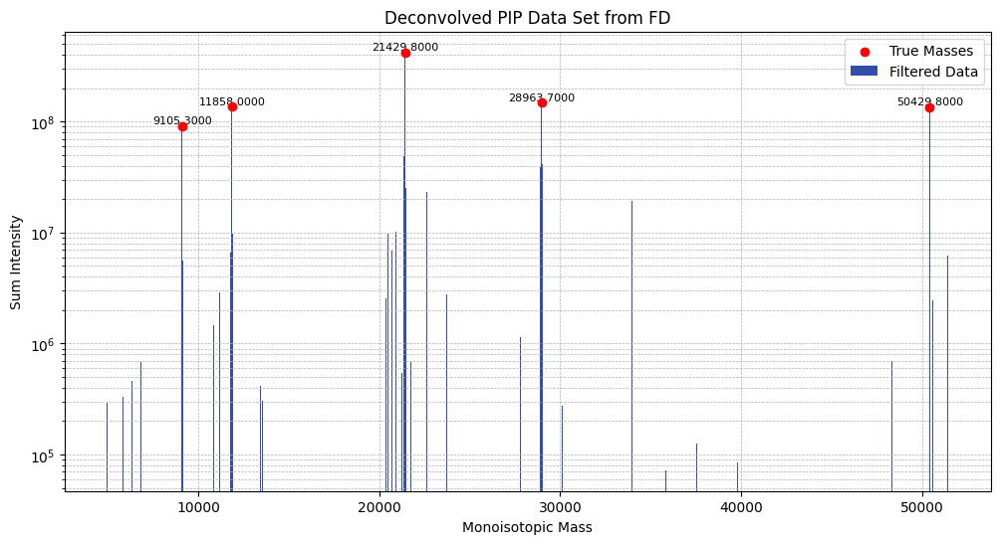

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/Experimental deconvolved file.tsv', sep='\t')

# Filter the dataset to include only those entries where TargetDecoyType = 0 and Qvalue <= 0.05
filtered_df = df[(df['TargetDecoyType'] == 0) & (df['Qvalue'] <= 0.05)]

# Define true masses
true_masses = np.array([9105.3, 11858.0, 21429.8, 28963.7, 50429.8, 67959.4])

# Function to find nearest intensity for a given mass
def find_nearest_intensity(mass, dataframe, width=10):
    # Find the subset of dataframe where mass is within a certain window
    mass_window = dataframe[(dataframe['MonoisotopicMass'] >= mass - width) & (dataframe['MonoisotopicMass'] <= mass + width)]
    if not mass_window.empty:
        # Return the highest intensity in this window
        return mass_window.loc[mass_window['SumIntensity'].idxmax()]['SumIntensity']
    return None

# Add markers for true masses
true_mass_markers = {'mass': [], 'intensity': [], 'label': []}
for mass in true_masses:
    intensity = find_nearest_intensity(mass, filtered_df)
    if intensity:
        true_mass_markers['mass'].append(mass)
        true_mass_markers['intensity'].append(intensity)
        true_mass_markers['label'].append(f'{mass:.4f}')

# Plotting with Matplotlib
plt.figure(figsize=(12, 6))

# Plotting the main data as vertical bars with increased width
plt.bar(filtered_df['MonoisotopicMass'], filtered_df['SumIntensity'], color='#324ea8', width=50, label='Filtered Data')

# Plotting the true masses as red dots
plt.scatter(true_mass_markers['mass'], true_mass_markers['intensity'], color='red', zorder=5, label='True Masses')

# Adding labels for the true masses
for mass, intensity, label in zip(true_mass_markers['mass'], true_mass_markers['intensity'], true_mass_markers['label']):
    plt.text(mass, intensity, label, fontsize=8, ha='center', va='bottom')

# Use a logarithmic scale for the y-axis to improve visibility of all peaks
plt.yscale('log')

# Adding gridlines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Adding labels and title
plt.xlabel('Monoisotopic Mass')
plt.ylabel('Sum Intensity')
plt.title('Deconvolved PIP Data Set from FD')
plt.legend()

# Save the plot as a PNG file
plt.savefig('deconvolved_plot.png')

# Show the plot
plt.show()


In [ ]:
import pandas as pd

# Define the monoisotopic masses for amino acids (in Daltons)
AMINO_ACID_MASSES = {
    'A': 71.03711, 'R': 156.10111, 'N': 114.04293, 'D': 115.02694, 'C': 103.00919,
    'E': 129.04259, 'Q': 128.05858, 'G': 57.02146,  'H': 137.05891, 'I': 113.08406,
    'L': 113.08406, 'K': 128.09496, 'M': 131.04049, 'F': 147.06841, 'P': 97.05276,
    'S': 87.03203,  'T': 101.04768, 'W': 186.07931, 'Y': 163.06333, 'V': 99.06841
}

# Mass adjustments for ions
PROTON_MASS = 1.007276
B_ION_OFFSET = 0  # b-ions: no proton in neutral form
Y_ION_OFFSET = 18.010565  # y-ions: H2O (neutral)

def calculate_neutral_monoisotopic_mass(sequence, ion_type):
    masses = []
    fragment_mass = 0

    if ion_type == 'b':
        # N-terminal ions: b-ions
        for i in range(len(sequence)):
            aa = sequence[i]
            fragment_mass += AMINO_ACID_MASSES[aa]
            masses.append(fragment_mass + B_ION_OFFSET)
    elif ion_type == 'y':
        # C-terminal ions: y-ions (reverse sequence)
        for i in range(len(sequence)):
            aa = sequence[-(i+1)]
            fragment_mass += AMINO_ACID_MASSES[aa]
            masses.append(fragment_mass + Y_ION_OFFSET)

    return masses

# Define the sequences and scan numbers
sequences = {
    "sequence_1": {"sequence": "GLSDGEWQQVLNVWGKVEADIAGHGQEVLIRLFTGHPETLEKFDKFKHLKTEAEMKASEDLKKHGTVVLTALGGILKKKGHHEAELKPLAQSHATKHKIPIKYLEFISDAIIHVLHSKHPGDFGADAQGAMTKALELFRNDIAAKYKELGFQG", "scan_number": 4},
    "sequence_2": {"sequence": "SHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK", "scan_number": 6},
    "sequence_3": {"sequence": "AVSKVYARSVYDSRGNPTVEVELTTEKGVFRSIVPSGASTGVHEALEMRDGDKSKWMGKGVLHAVKNVNDVIAPAFVKANIDVKDQKAVDDFLISLDGTANKSKLGANAILGVSLAASRAAAAEKNVPLYKHLADLSKSKTSPYVLPVPFLNVLNGGSHAGGALALQEFMIAPTGAKTFAEALRIGSEVYHNLKSLTKKRYGASAGNVGDEGGVAPNIQTAEEALDLIVDAIKAAGHDGKIKIGLDCASSEFFKDGKYDLDFKNPNSDKSKWLTGPQLADLYHSLMKRYPIVSIEDPFAEDDWEAWSHFFKTAGIQIVADDLTVTNPKRIATAIEKKAADALLLKVNQIGTLSESIKAAQDSFAAGWGVMVSHRSGETEDTFIADLVVGLRTGQIKTGAPARSERLAKLNQLLRIEEELGDNAVFAGENFHHGDKL", "scan_number": 8}
}

# Prepare data for CSV output
data = []

for name, info in sequences.items():
    sequence = info["sequence"]
    scan_number = info["scan_number"]

    # Calculate b-ions and y-ions
    b_ions = calculate_neutral_monoisotopic_mass(sequence, 'b')
    y_ions = calculate_neutral_monoisotopic_mass(sequence, 'y')

    # Store the data in rows for each fragment (b and y ions)
    for i in range(len(b_ions)):
        data.append([scan_number, f"{name}_b{i+1}", b_ions[i]])
    for i in range(len(y_ions)):
        data.append([scan_number, f"{name}_y{i+1}", y_ions[i]])

# Convert to DataFrame and save to CSV
df = pd.DataFrame(data, columns=["Scan Number", "Fragment", "Neutral Mass"])
output_csv_path = "neutral_fragment_masses.csv"
df.to_csv(output_csv_path, index=False)

print(f"CSV file saved at: {output_csv_path}")


CSV file saved at: neutral_fragment_masses.csv


In [ ]:
import pandas as pd

# Load the TSV file
input_file = '/content/FP classes_centroid_ms2.tsv'  # Replace with the path to your file
output_file = 'filtered_output.tsv'

# Read the TSV file into a pandas DataFrame
df = pd.read_csv(input_file, sep='\t')

# Filter rows where ScanNum is 4, 6, or 8
filtered_df = df[df['ScanNum'].isin([4, 6, 8])]

# Save the filtered data to a new TSV file
filtered_df.to_csv(output_file, sep='\t', index=False)

print(f"Filtered data saved to {output_file}")


Filtered data saved to filtered_outputisotope1.tsv


In [ ]:
import pandas as pd

# Function to calculate ppm difference
def ppm_difference(mass1, mass2):
    return abs(mass1 - mass2) / mass2 * 1e6

# Load file A (filtered.tsv) and file B (true mass CSV)
file_a = '/content/filtered_output FP classes.tsv'  # Replace with the path to file A
file_b = '/content/neutral_fragment_masses for FP class.csv'  # Replace with the path to file B
output_file = 'filtered_with_tp_fp.csv'

# Read the filtered.tsv into a pandas DataFrame
df_a = pd.read_csv(file_a, sep='\t')

# Read the true mass file (file B) into a pandas DataFrame
df_b = pd.read_csv(file_b)

# Filter rows in file A where TargetDecoyType = 0
df_a_filtered = df_a[df_a['TargetDecoyType'] == 0].copy()

# Add a new column 'TP_FP' to mark True Positive (TP) and False Positive (FP)
df_a_filtered['TP_FP'] = 'FP'  # Initialize all as FP

# Compare MonoisotopicMass from file A to NeutralMass from file B with 10ppm tolerance
tolerance_ppm = 10

for i, row_a in df_a_filtered.iterrows():
    mass_a = row_a['MonoisotopicMass']

    # Check for any matching masses within the tolerance in file B
    match_found = any(ppm_difference(mass_a, mass_b) <= tolerance_ppm for mass_b in df_b['Neutral Mass'])

    # If a match is found, mark as TP
    if match_found:
        df_a_filtered.at[i, 'TP_FP'] = 'TP'

# Merge the TP/FP column back into the original file A
df_a['TP_FP'] = df_a_filtered['TP_FP']

# Save the updated dataframe with TP/FP information back to a new TSV file
df_a.to_csv(output_file, sep='\t', index=False)

print(f"File with TP/FP column saved to {output_file}")


File with TP/FP column saved to filtered_with_tp_fp.csv


In [ ]:
pip install matplotlib seaborn


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the CSV file (after TP/FP classification)
file_a = '/content/filtered_with_tp_fp.csv'  # Replace with the path to your file
df = pd.read_csv(file_a)

# Verify column names
print(df.columns)

# Drop rows with missing Qscore values (if any)
df = df.dropna(subset=['Qscore'])

# Filter data for different categories
df_tp = df[df['TP_FP'] == 'TP']  # True Positives
df_fp = df[df['TP_FP'] == 'FP']  # False Positives
df_decoy = df[df['TargetDecoyType'] > 0]  # TargetDecoyType > 0

# Plot density plots using seaborn
plt.figure(figsize=(10, 6))

sns.kdeplot(df_tp['Qscore'], label='True Positives (TP)', color='green', fill=True)
sns.kdeplot(df_fp['Qscore'], label='False Positives (FP)', color='red', fill=True)
sns.kdeplot(df_decoy['Qscore'], label='TargetDecoyType > 0', color='blue', fill=True)

# Add labels and title
plt.xlabel('Qscore')
plt.ylabel('Density')
plt.title('Density Plot of Qscore for TP, FP, and TargetDecoyType > 0')
plt.legend()

# Show the plot.
plt.show()


Index(['Index\tFileName\tScanNum\tFeatureIndex\tTargetDecoyType\tRetentionTime\tMassCountInSpec\tAverageMass\tMonoisotopicMass\tSumIntensity\tMinCharge\tMaxCharge\tPeakCount\tPrecursorScanNum\tPrecursorFeatureIndex\tPrecursorMz\tPrecursorIntensity\tPrecursorCharge\tPrecursorSNR\tPrecursorMonoisotopicMass\tPrecursorQscore\tPrecursorQscore2D\tPrecursorQvalue\tIsotopeCosine\tChargeCosine\tChargeScore\tMassSNR\tChargeSNR\tAveragePPMError\tRepresentativeCharge\tRepresentativeMzStart\tRepresentativeMzEnd\tQscore\tQscore2D\tQvalue\tUnnamed: 35\tTP_FP'], dtype='object')


KeyError: ['Qscore']

Index(['Index', 'FileName', 'ScanNum', 'FeatureIndex', 'TargetDecoyType',
       'RetentionTime', 'MassCountInSpec', 'AverageMass', 'MonoisotopicMass',
       'SumIntensity', 'MinCharge', 'MaxCharge', 'PeakCount',
       'PrecursorScanNum', 'PrecursorFeatureIndex', 'PrecursorMz',
       'PrecursorIntensity', 'PrecursorCharge', 'PrecursorSNR',
       'PrecursorMonoisotopicMass', 'PrecursorQscore', 'PrecursorQscore2D',
       'PrecursorQvalue', 'IsotopeCosine', 'ChargeCosine', 'ChargeScore',
       'MassSNR', 'ChargeSNR', 'AveragePPMError', 'RepresentativeCharge',
       'RepresentativeMzStart', 'RepresentativeMzEnd', 'Qscore', 'Qscore2D',
       'Qvalue', 'Unnamed: 35', 'TP_FP'],
      dtype='object')


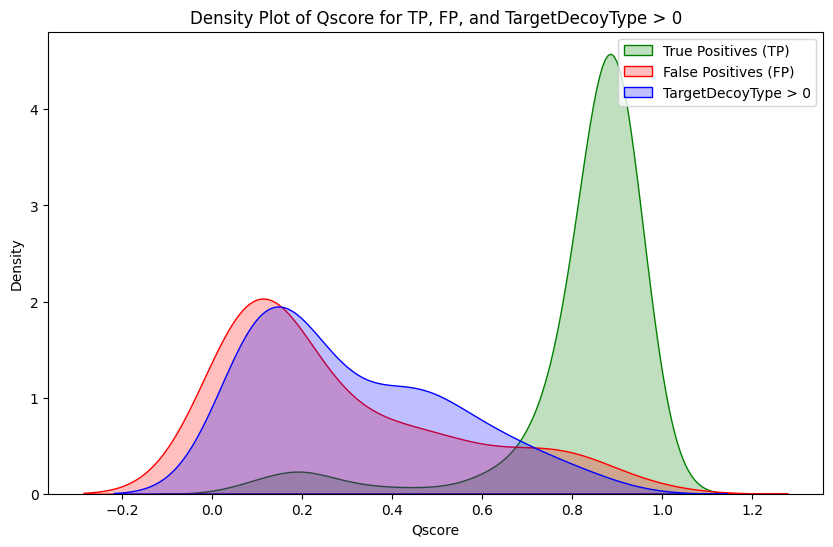

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the TSV file with tab delimiter
file_a = '/content/filtered_with_tp_fp.csv'  # Replace with the path to your file
df = pd.read_csv(file_a, sep='\t')

# Clean the column names by stripping extra spaces
df.columns = df.columns.str.strip()

# Verify column names to ensure Qscore and TP_FP are present
print(df.columns)

# Drop rows with missing Qscore values (if any)
df = df.dropna(subset=['Qscore'])

# Filter data for different categories
df_tp = df[df['TP_FP'] == 'TP']  # True Positives
df_fp = df[df['TP_FP'] == 'FP']  # False Positives
df_decoy = df[df['TargetDecoyType'] > 0]  # TargetDecoyType > 0

# Plot density plots using seaborn
plt.figure(figsize=(10, 6))

sns.kdeplot(df_tp['Qscore'], label='True Positives (TP)', color='green', fill=True)
sns.kdeplot(df_fp['Qscore'], label='False Positives (FP)', color='red', fill=True)
sns.kdeplot(df_decoy['Qscore'], label='TargetDecoyType > 0', color='blue', fill=True)

# Add labels and title
plt.xlabel('Qscore')
plt.ylabel('Density')
plt.title('Density Plot of Qscore for TP, FP, and TargetDecoyType > 0')
plt.legend()

# Show the plot.
plt.show()


In [ ]:
#ASMS 2025


<ipython-input-7-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-7-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-7-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-7-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)


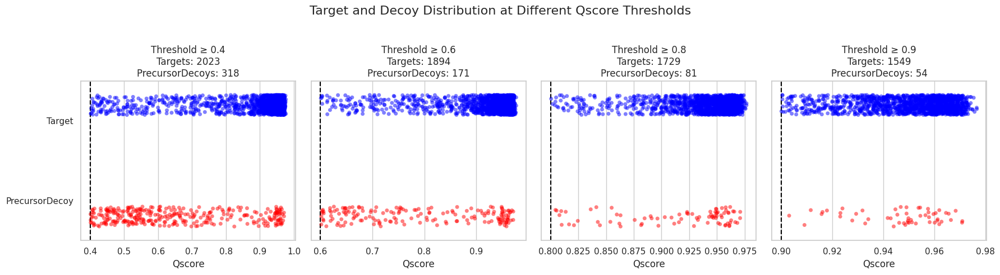

<ipython-input-8-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-8-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-8-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-8-79366372e6ab>:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)


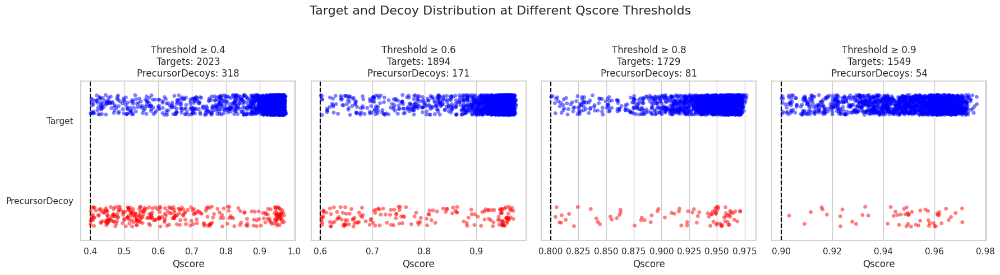

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ✅ Load data
file_aq = pd.read_csv("/content/FileAQ.tsv", sep="\t")

# ✅ Label targets and decoys
file_aq["Label"] = file_aq["TargetDecoyType"].apply(lambda x: "Target" if x == 0 else "PrecursorDecoy")

# ✅ Define Qscore thresholds to test
qscore_thresholds = [0.4, 0.6, 0.8, 0.9]

# ✅ Set up plot
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, len(qscore_thresholds), figsize=(18, 5), sharey=True)

for i, threshold in enumerate(qscore_thresholds):
    ax = axes[i]

    # ✅ Filtered data at threshold
    filtered_data = file_aq[file_aq["PrecursorQscore"] >= threshold]
    targets = filtered_data[filtered_data["Label"] == "Target"]
    decoys = filtered_data[filtered_data["Label"] == "PrecursorDecoy"]

    # ✅ Strip plot
    sns.stripplot(data=filtered_data, x="PrecursorQscore", y="Label", hue="Label",
                  jitter=0.25, dodge=True, alpha=0.5,
                  palette={"Target": "blue", "PrecursorDecoy": "red"}, ax=ax)

    # ✅ Vertical threshold line
    ax.axvline(threshold, color="black", linestyle="--")

    # ✅ Title and annotations
    ax.set_title(f"Threshold ≥ {threshold}\nTargets: {len(targets)}\nPrecursorDecoys: {len(decoys)}")
    ax.set_xlabel("Qscore")
    if i == 0:
        ax.set_ylabel("")
    ax.legend().set_visible(False)

# ✅ Final plot tweaks
fig.suptitle("Target and Decoy Distribution at Different Qscore Thresholds", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


<ipython-input-46-bd0b94376629>:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-46-bd0b94376629>:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-46-bd0b94376629>:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-46-bd0b94376629>:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)


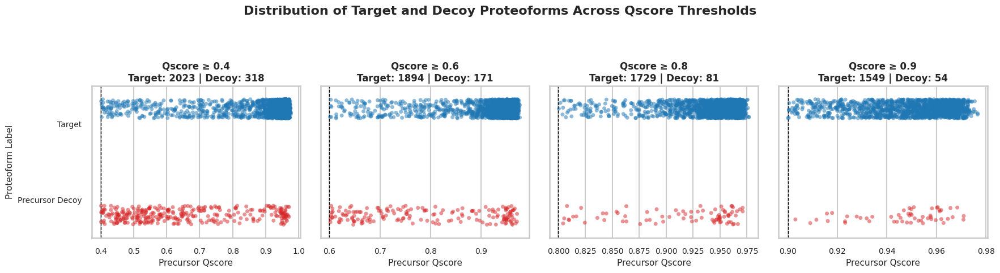

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Load and Prepare Data ===
file_path = "/content/FileAQ.tsv"
df = pd.read_csv(file_path, sep="\t")

# Label: 0 = Target, else = Decoy
df["Label"] = df["TargetDecoyType"].apply(lambda x: "Target" if x == 0 else "Precursor Decoy")

# Define Qscore thresholds
qscore_thresholds = [0.4, 0.6, 0.8, 0.9]

# === Plot Setup ===
sns.set(style="whitegrid", context="talk")
fig, axes = plt.subplots(1, len(qscore_thresholds), figsize=(18, 5), sharey=True)

for i, threshold in enumerate(qscore_thresholds):
    ax = axes[i]

    # Filter data at threshold
    filtered = df[df["PrecursorQscore"] >= threshold]
    targets = filtered[filtered["Label"] == "Target"]
    decoys = filtered[filtered["Label"] == "Precursor Decoy"]

    # Strip plot of Qscores for Target/Decoy
    sns.stripplot(
        data=filtered,
        x="PrecursorQscore", y="Label",
        hue="Label", jitter=0.25, dodge=True,
        alpha=0.5, palette={"Target": "#1f77b4", "Precursor Decoy": "#d62728"},
        ax=ax
    )

    # Threshold line
    ax.axvline(threshold, color="black", linestyle="--", linewidth=1)

    # Title and axes
    ax.set_title(
        f"Qscore ≥ {threshold}\n"
        f"Target: {len(targets)} | Decoy: {len(decoys)}",
        fontsize=12, fontweight='bold'
    )
    ax.set_xlabel("Precursor Qscore", fontsize=11)
    if i == 0:
        ax.set_ylabel("Proteoform Label", fontsize=11)
    else:
        ax.set_ylabel("")

    ax.tick_params(labelsize=10)
    ax.legend().set_visible(False)

# Overall plot title
fig.suptitle("Distribution of Target and Decoy Proteoforms Across Qscore Thresholds",
             fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


<ipython-input-48-eb3c3d39e18e>:55: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-48-eb3c3d39e18e>:55: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-48-eb3c3d39e18e>:55: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
<ipython-input-48-eb3c3d39e18e>:55: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)


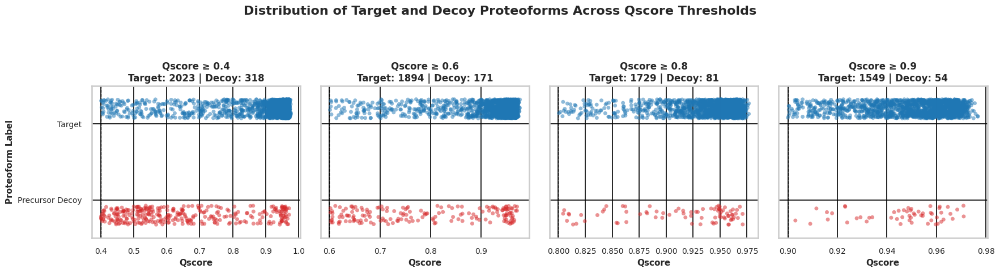

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Load and Prepare Data ===
file_path = "/content/FileAQ.tsv"
df = pd.read_csv(file_path, sep="\t")

# Label: 0 = Target, else = Decoy
df["Label"] = df["TargetDecoyType"].apply(lambda x: "Target" if x == 0 else "Precursor Decoy")

# Define Qscore thresholds
qscore_thresholds = [0.4, 0.6, 0.8, 0.9]

# === Plot Setup ===
sns.set(style="whitegrid", context="talk")
fig, axes = plt.subplots(1, len(qscore_thresholds), figsize=(18, 5), sharey=True)

for i, threshold in enumerate(qscore_thresholds):
    ax = axes[i]

    # Filter data at threshold
    filtered = df[df["PrecursorQscore"] >= threshold]
    targets = filtered[filtered["Label"] == "Target"]
    decoys = filtered[filtered["Label"] == "Precursor Decoy"]

    # Strip plot
    sns.stripplot(
        data=filtered,
        x="PrecursorQscore", y="Label",
        hue="Label", jitter=0.25, dodge=True,
        alpha=0.5, palette={"Target": "#1f77b4", "Precursor Decoy": "#d62728"},
        ax=ax
    )

    # Threshold line
    ax.axvline(threshold, color="black", linestyle="--", linewidth=1)

    # Bold, dark gridlines on both axes
    ax.grid(True, which='major', axis='both', linewidth=1.2, color='black')

    # Titles and labels
    ax.set_title(
        f"Qscore ≥ {threshold}\n"
        f"Target: {len(targets)} | Decoy: {len(decoys)}",
        fontsize=12, fontweight='bold'
    )
    ax.set_xlabel("Qscore", fontsize=11, fontweight='bold')
    if i == 0:
        ax.set_ylabel("Proteoform Label", fontsize=11, fontweight='bold')
    else:
        ax.set_ylabel("")

    ax.tick_params(labelsize=10)
    ax.legend().set_visible(False)

# Overall plot title
fig.suptitle("Distribution of Target and Decoy Proteoforms Across Qscore Thresholds",
             fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


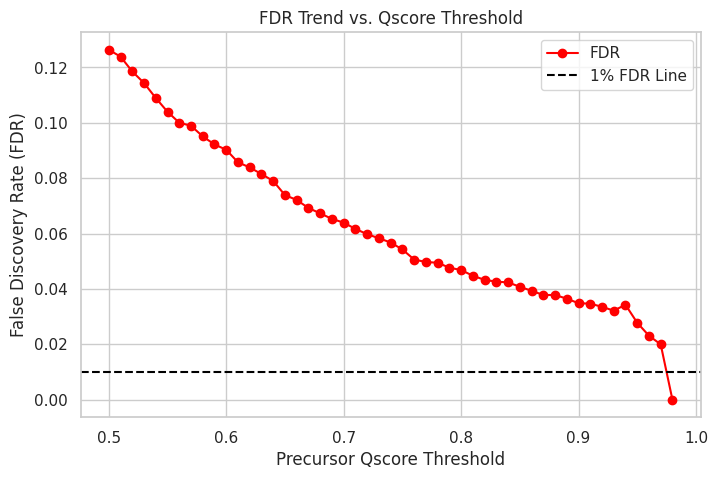

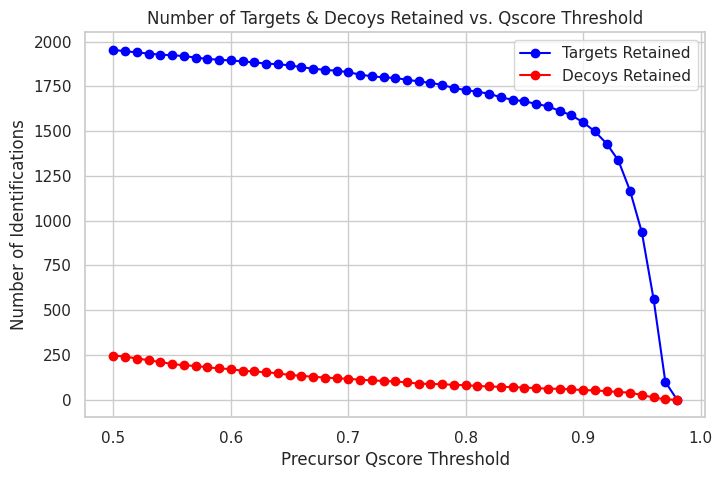

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# ✅ Reload FileAQ Data after execution state reset
file_path = "/content/FileAQ.tsv"  # Adjust if needed
file_aq = pd.read_csv(file_path, sep="\t")

# ✅ Define Qscore Thresholds from 0.5 to 1.0
qscore_values = []
fdr_values = []
targets_retained = []
decoys_retained = []

qscore_threshold = 0.50
max_qscore_threshold = 1.00
step = 0.01

while qscore_threshold <= max_qscore_threshold:
    # Apply Qscore filtering
    filtered_aq = file_aq[file_aq["PrecursorQscore"] >= qscore_threshold]

    # Count targets and decoys after filtering
    total_targets = filtered_aq[filtered_aq["TargetDecoyType"] == 0].shape[0]
    total_decoys = filtered_aq[filtered_aq["TargetDecoyType"] > 0].shape[0]
    fdr = (total_decoys / total_targets) if total_targets > 0 else 0

    # Store values for plotting
    qscore_values.append(qscore_threshold)
    fdr_values.append(fdr)
    targets_retained.append(total_targets)
    decoys_retained.append(total_decoys)

    # Stop if FDR < 1%
    if fdr <= 0.01:
        break

    qscore_threshold += step

# ✅ Plot FDR vs. Qscore Threshold
plt.figure(figsize=(8, 5))
plt.plot(qscore_values, fdr_values, marker="o", linestyle="-", label="FDR", color="red")
plt.axhline(y=0.01, color="black", linestyle="--", label="1% FDR Line")
plt.xlabel("Precursor Qscore Threshold")
plt.ylabel("False Discovery Rate (FDR)")
plt.title("FDR Trend vs. Qscore Threshold")
plt.legend()
plt.grid(True)
plt.show()

# ✅ Plot Targets & Decoys Retained vs. Qscore Threshold
plt.figure(figsize=(8, 5))
plt.plot(qscore_values, targets_retained, marker="o", linestyle="-", label="Targets Retained", color="blue")
plt.plot(qscore_values, decoys_retained, marker="o", linestyle="-", label="Decoys Retained", color="red")
plt.xlabel("Precursor Qscore Threshold")
plt.ylabel("Number of Identifications")
plt.title("Number of Targets & Decoys Retained vs. Qscore Threshold")
plt.legend()
plt.grid(True)
plt.show()


In [11]:
import pandas as pd

# Replace with your actual file path if it's not in the same directory
file_path = "FileAQ.tsv"  # or "AQ.tsv", update as needed

# Load the TSV file
df = pd.read_csv(file_path, sep="\t")

# Show column names
print("📋 Columns in the file:")
print(df.columns.tolist())

# Show the first few rows
print("\n🔍 First 5 rows of the file:")
print(df.head())


📋 Columns in the file:
['ScanNum', 'ScanNum_ms2', 'PrecursorMonoisotopicMass', 'PrecursorQscore', 'ScanNum_ms1', 'TargetDecoyType', 'MonoisotopicMass']

🔍 First 5 rows of the file:
   ScanNum  ScanNum_ms2  PrecursorMonoisotopicMass  PrecursorQscore  \
0      929          933                4080.023078         0.920451   
1      936          928                 537.154547         0.945689   
2      942          938                 581.072400         0.931917   
3      946          939                 609.176421         0.903460   
4      949          941                5193.553975         0.882634   

   ScanNum_ms1  TargetDecoyType  MonoisotopicMass  
0          929                0       4080.023078  
1          936                0        537.154547  
2          942                0        581.072400  
3          946                0        609.176421  
4          949                0       5193.553975  


In [ ]:
import pandas as pd
import numpy as np
from pyopenms import ModificationsDB

# ✅ Load the filtered datasets (Ensure these paths are correct)
file_low_fdr = "LowFiltered_TopPIC_RefinedFDR_Low.tsv"  # FDR < 0.01
file_high_fdr = "HighFiltered_TopPIC_RefinedFDR_High.tsv"  # FDR > 0.01

df_low_fdr = pd.read_csv(file_low_fdr, sep="\t")
df_high_fdr = pd.read_csv(file_high_fdr, sep="\t")

# ✅ Step 1: Extract delta masses from "unexpected modifications"
def extract_delta_masses(df):
    delta_masses = []
    df["unexpected modifications"] = df["unexpected modifications"].astype(str)
    for entry in df["unexpected modifications"]:
        if entry != "0" and entry not in ["-", "None", "nan", "NaN", ""]:
            try:
                delta_mass = float(entry.split(":")[0].strip())
                if -150 <= delta_mass <= 150:  # Filter extreme noise
                    delta_masses.append(delta_mass)
            except ValueError:
                continue
    return np.array(delta_masses)

delta_masses_low = extract_delta_masses(df_low_fdr)
delta_masses_high = extract_delta_masses(df_high_fdr)

# ✅ Step 2: Get ALL UniMod PTMs using PyOpenMS
mod_db = ModificationsDB()
all_unimod_masses = []
all_unimod_names = []

for i in range(mod_db.getNumberOfModifications()):
    mod_name = mod_db.getModification(i).getFullId()
    mod_mass = mod_db.getModification(i).getDiffMonoMass()

    if -150 <= mod_mass <= 150:  # Keep reasonable mass shifts
        all_unimod_names.append(mod_name)
        all_unimod_masses.append(mod_mass)

all_unimod_masses = np.array(all_unimod_masses)

# ✅ Step 3: Manually Define Old UniMod PTMs (For Comparison)
manual_unimod_ptms = np.array([
    1.00, 14.02, 15.99, 28.03, 42.01, 57.02, 79.97, 94.04,
    -17.03, -18.01, -56.03, -75.01, -89.03, -103.03
])

# ✅ Step 4: Merge Both Approaches
combined_unimod_masses = np.unique(np.concatenate([all_unimod_masses, manual_unimod_ptms]))

# ✅ Step 5: Match Delta Masses with UniMod PTMs (±1 Da Tolerance)
tolerance = 0.1  # Adjust if needed

def count_explained_masses(delta_masses, unimod_ptms, tolerance):
    matched = np.any(np.abs(delta_masses[:, None] - unimod_ptms) <= tolerance, axis=1)
    return np.sum(matched), len(delta_masses)

matched_low, total_low = count_explained_masses(delta_masses_low, combined_unimod_masses, tolerance)
matched_high, total_high = count_explained_masses(delta_masses_high, combined_unimod_masses, tolerance)

# ✅ Step 6: Compute Explained Percentages
explained_low_fdr = (matched_low / total_low) * 100 if total_low > 0 else 0
explained_high_fdr = (matched_high / total_high) * 100 if total_high > 0 else 0

# ✅ Step 7: Print Results
print(f"✅ Percentage of Explained Modifications (FDR < 0.01): {explained_low_fdr:.2f}%")
print(f"✅ Percentage of Explained Modifications (FDR > 0.01): {explained_high_fdr:.2f}%")

# ✅ Step 8: Save Matched UniMod PTMs to CSV
matched_df_low = pd.DataFrame({
    "Observed Mass": delta_masses_low,
    "UniMod Modification": ["Matched" if np.any(np.abs(mass - combined_unimod_masses) <= tolerance) else "Unmatched" for mass in delta_masses_low]
})
matched_df_high = pd.DataFrame({
    "Observed Mass": delta_masses_high,
    "UniMod Modification": ["Matched" if np.any(np.abs(mass - combined_unimod_masses) <= tolerance) else "Unmatched" for mass in delta_masses_high]
})

matched_df_low.to_csv("UniMod_Matched_FDR_Low.tsv", sep="\t", index=False)
matched_df_high.to_csv("UniMod_Matched_FDR_High.tsv", sep="\t", index=False)

print("✅ Matched UniMod PTMs saved to CSV files for both cases.")


✅ Percentage of Explained Modifications (FDR < 0.01): 80.00%
✅ Percentage of Explained Modifications (FDR > 0.01): 58.33%
✅ Matched UniMod PTMs saved to CSV files for both cases.


🔹 Qscore: 0.50 | MS1 FPs: 41 | MS2 FPs: 0 | Total: 320 | FDR: 0.1281
🔹 Qscore: 0.51 | MS1 FPs: 40 | MS2 FPs: 0 | Total: 318 | FDR: 0.1258
🔹 Qscore: 0.52 | MS1 FPs: 37 | MS2 FPs: 0 | Total: 315 | FDR: 0.1175
🔹 Qscore: 0.53 | MS1 FPs: 36 | MS2 FPs: 0 | Total: 313 | FDR: 0.1150
🔹 Qscore: 0.54 | MS1 FPs: 34 | MS2 FPs: 0 | Total: 310 | FDR: 0.1097
🔹 Qscore: 0.55 | MS1 FPs: 32 | MS2 FPs: 0 | Total: 307 | FDR: 0.1042
🔹 Qscore: 0.56 | MS1 FPs: 31 | MS2 FPs: 0 | Total: 305 | FDR: 0.1016
🔹 Qscore: 0.57 | MS1 FPs: 30 | MS2 FPs: 0 | Total: 304 | FDR: 0.0987
🔹 Qscore: 0.58 | MS1 FPs: 28 | MS2 FPs: 0 | Total: 301 | FDR: 0.0930
🔹 Qscore: 0.59 | MS1 FPs: 27 | MS2 FPs: 0 | Total: 300 | FDR: 0.0900
🔹 Qscore: 0.60 | MS1 FPs: 26 | MS2 FPs: 0 | Total: 299 | FDR: 0.0870
🔹 Qscore: 0.61 | MS1 FPs: 24 | MS2 FPs: 0 | Total: 296 | FDR: 0.0811
🔹 Qscore: 0.62 | MS1 FPs: 24 | MS2 FPs: 0 | Total: 295 | FDR: 0.0814
🔹 Qscore: 0.63 | MS1 FPs: 22 | MS2 FPs: 0 | Total: 291 | FDR: 0.0756
🔹 Qscore: 0.64 | MS1 FPs: 22 | MS2

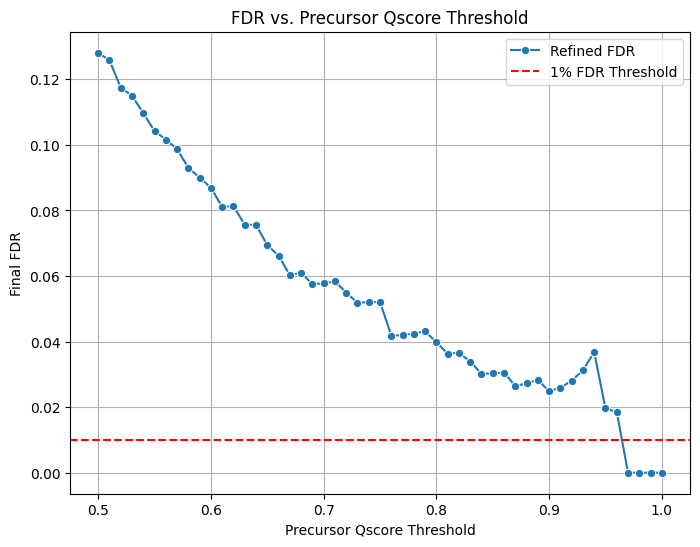

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ✅ Step 1: Load MS2 & TopPIC Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched precursors with Qscore
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC output

# ✅ Step 2: Match TopPIC Identifications with Precursor Info
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Remove TopPIC decoys (Only keep non-decoy proteins)
matched_toppic = matched_toppic[~matched_toppic["Protein accession"].str.contains("DECOY", na=False)]

# ✅ Step 3: Initialize Variables
qscore_thresholds = np.arange(0.5, 1.01, 0.01)  # Range of Qscores from 0.5 to 1.0
fdr_values = []
optimal_qscore = None

# ✅ Step 4: Iterate Over Qscore Thresholds
for qscore_threshold in qscore_thresholds:
    # Apply Qscore Filtering
    filtered_toppic = matched_toppic[matched_toppic["PrecursorQscore"] >= qscore_threshold]

    # Compute MS1 and MS2 False Positives (FPs)
    ms1_fps = filtered_toppic[filtered_toppic["TargetDecoyType"] > 0].shape[0]  # Decoy Precursors
    ms2_fps = filtered_toppic[filtered_toppic["Protein accession"].str.contains("DECOY", na=False)].shape[0]  # TopPIC Decoys

    # Compute Final FDR
    total_filtered = filtered_toppic.shape[0]
    fdr = (ms1_fps + ms2_fps) / total_filtered if total_filtered > 0 else 0
    fdr_values.append(fdr)

    print(f"🔹 Qscore: {qscore_threshold:.2f} | MS1 FPs: {ms1_fps} | MS2 FPs: {ms2_fps} | Total: {total_filtered} | FDR: {fdr:.4f}")

    # Identify the first Qscore where FDR <= 0.01
    if fdr <= 0.01 and optimal_qscore is None:
        optimal_qscore = qscore_threshold

# ✅ Step 5: Apply Final Filtering Based on Identified Qscore Threshold
if optimal_qscore:
    filtered_high_conf = matched_toppic[matched_toppic["PrecursorQscore"] >= optimal_qscore]  # FDR < 0.01
    filtered_low_conf = matched_toppic[matched_toppic["PrecursorQscore"] < optimal_qscore]   # FDR > 0.01

    # Save filtered datasets
    filtered_high_conf.to_csv("LowFiltered_TopPIC_RefinedFDR_Low.tsv", sep="\t", index=False)  # FDR < 0.01
    filtered_low_conf.to_csv("HighFiltered_TopPIC_RefinedFDR_High.tsv", sep="\t", index=False)  # FDR > 0.01

    print(f"✅ Optimal Qscore Found at {optimal_qscore:.2f} for FDR < 0.01")
    print("✅ Saved High and Low Confidence Filtered Data.")

# ✅ Step 6: Plot FDR Trends
plt.figure(figsize=(8, 6))
sns.lineplot(x=qscore_thresholds[:len(fdr_values)], y=fdr_values, marker="o", label="Refined FDR")

# Highlight 1% FDR cutoff
plt.axhline(y=0.01, color="red", linestyle="--", label="1% FDR Threshold")

plt.xlabel("Precursor Qscore Threshold")
plt.ylabel("Final FDR")
plt.title("FDR vs. Precursor Qscore Threshold")
plt.legend()
plt.grid(True)
plt.show()


In [1]:
pip install pandas matplotlib seaborn requests


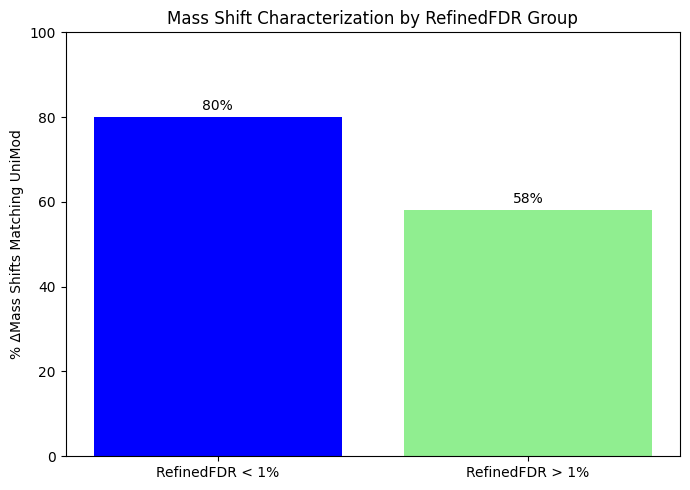

In [5]:
import matplotlib.pyplot as plt

# Data: manually extracted from your summary
groups = ['RefinedFDR < 1%', 'RefinedFDR > 1%']
match_rates = [80, 58]  # percentages

# Plot
fig, ax = plt.subplots(figsize=(7, 5))
bars = ax.bar(groups, match_rates, color=['blue', 'lightgreen'])

# Add labels
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2.0, yval + 1, f'{yval}%', ha='center', va='bottom')

# Titles and labels
ax.set_ylim(0, 100)
ax.set_ylabel('% ΔMass Shifts Matching UniMod')
ax.set_title('Mass Shift Characterization by RefinedFDR Group')

plt.tight_layout()
plt.show()


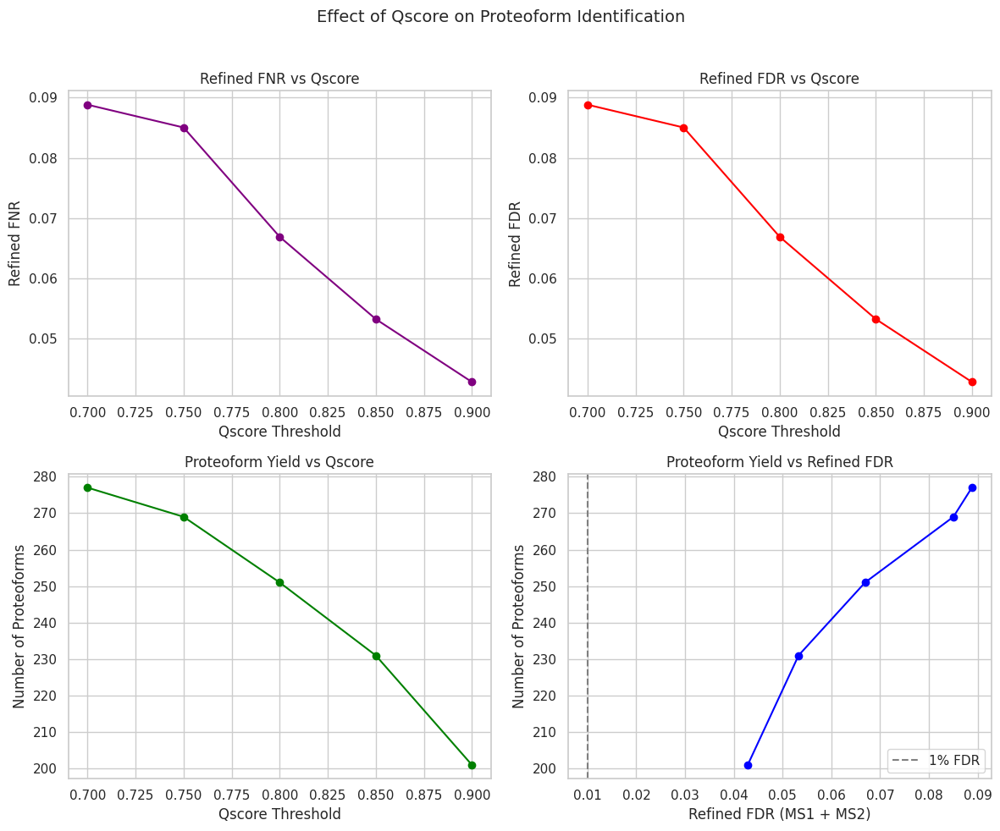

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Load and merge ---
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)
toppic.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)

df = toppic.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
df = df[~df["Protein accession"].isna()].copy()

# --- Define Qscore bins ---
qscores = [0.7, 0.75, 0.8, 0.85, 0.9]
fnr_list = []
fdr_list = []
counts = []

for q in qscores:
    subset = df[df["PrecursorQscore"] >= q].copy()
    if subset.empty:
        fnr_list.append(1.0)
        fdr_list.append(1.0)
        counts.append(0)
        continue

    subset["MS1_FP"] = subset["TargetDecoyType"] > 0
    subset["MS2_FP"] = subset["Protein accession"].astype(str).str.contains("DECOY")
    subset["TP"] = ~subset["MS2_FP"]

    ms1_fp = subset["MS1_FP"].sum()
    ms2_fp = subset["MS2_FP"].sum()
    tp = subset["TP"].sum()
    total = ms1_fp + ms2_fp + tp

    refined_fdr = (ms1_fp + ms2_fp) / total if total > 0 else 1.0
    refined_fnr = 1 - (tp / total) if total > 0 else 1.0

    fdr_list.append(refined_fdr)
    fnr_list.append(refined_fnr)
    counts.append(tp)

# --- Plotting ---
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle("Effect of Qscore on Proteoform Identification", fontsize=14)

# Top-left: r.FNR vs Qscore
axs[0, 0].plot(qscores, fnr_list, marker='o', color='purple')
axs[0, 0].set_title("Refined FNR vs Qscore")
axs[0, 0].set_xlabel("Qscore Threshold")
axs[0, 0].set_ylabel("Refined FNR")

# Top-right: r.FDR vs Qscore
axs[0, 1].plot(qscores, fdr_list, marker='o', color='red')
axs[0, 1].set_title("Refined FDR vs Qscore")
axs[0, 1].set_xlabel("Qscore Threshold")
axs[0, 1].set_ylabel("Refined FDR")

# Bottom-left: Proteoform Count vs Qscore
axs[1, 0].plot(qscores, counts, marker='o', color='green')
axs[1, 0].set_title("Proteoform Yield vs Qscore")
axs[1, 0].set_xlabel("Qscore Threshold")
axs[1, 0].set_ylabel("Number of Proteoforms")

# Bottom-right: Yield vs r.FDR
axs[1, 1].plot(fdr_list, counts, marker='o', color='blue')
axs[1, 1].set_title("Proteoform Yield vs Refined FDR")
axs[1, 1].set_xlabel("Refined FDR (MS1 + MS2)")
axs[1, 1].set_ylabel("Number of Proteoforms")
axs[1, 1].axvline(0.01, linestyle='--', color='gray', label='1% FDR')
axs[1, 1].legend()

# Layout
for ax in axs.flat:
    ax.grid(True)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


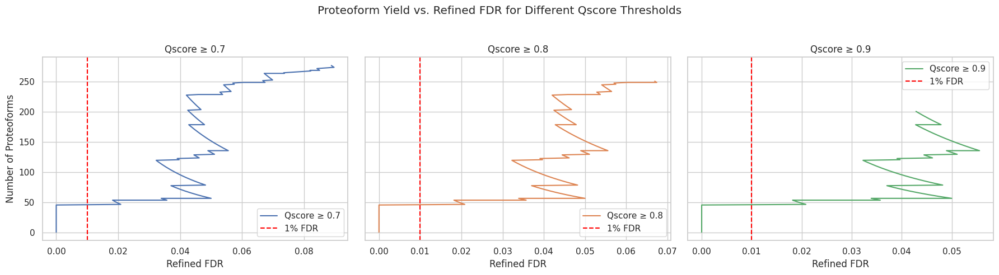

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)
toppic.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)

# Merge and filter
df = toppic.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
df = df[~df["Protein accession"].isna()].copy()

# Setup
qscore_thresholds = [0.7, 0.8, 0.9]
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for i, q in enumerate(qscore_thresholds):
    subset = df[df["PrecursorQscore"] >= q].copy()
    if subset.empty:
        continue

    subset["MS1_FP"] = subset["TargetDecoyType"] > 0
    subset["MS2_FP"] = subset["Protein accession"].astype(str).str.contains("DECOY")
    subset["TP"] = ~subset["MS2_FP"]

    subset = subset.sort_values("PrecursorQscore", ascending=False).reset_index(drop=True)

    ms1_fp = ms2_fp = tp = 0
    fdrs = []
    proteoforms = []

    for _, row in subset.iterrows():
        if row["MS1_FP"]:
            ms1_fp += 1
        if row["MS2_FP"]:
            ms2_fp += 1
        else:
            tp += 1
        total = ms1_fp + ms2_fp + tp
        refined_fdr = (ms1_fp + ms2_fp) / total if total > 0 else 0
        fdrs.append(refined_fdr)
        proteoforms.append(tp)

    ax = axes[i]
    ax.plot(fdrs, proteoforms, label=f"Qscore ≥ {q}", color=f"C{i}")
    ax.axvline(0.01, color='red', linestyle='--', label="1% FDR")
    ax.set_title(f"Qscore ≥ {q}")
    ax.set_xlabel("Refined FDR")
    if i == 0:
        ax.set_ylabel("Number of Proteoforms")
    ax.grid(True)
    ax.legend()

plt.suptitle("Proteoform Yield vs. Refined FDR for Different Qscore Thresholds")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Qscore: 0.50 | MS1 FPs: 41 | MS2 FPs: 0 | Total IDs: 320 | Refined FDR: 0.1281
Qscore: 0.51 | MS1 FPs: 40 | MS2 FPs: 0 | Total IDs: 318 | Refined FDR: 0.1258
Qscore: 0.52 | MS1 FPs: 37 | MS2 FPs: 0 | Total IDs: 315 | Refined FDR: 0.1175
Qscore: 0.53 | MS1 FPs: 36 | MS2 FPs: 0 | Total IDs: 313 | Refined FDR: 0.1150
Qscore: 0.54 | MS1 FPs: 34 | MS2 FPs: 0 | Total IDs: 310 | Refined FDR: 0.1097
Qscore: 0.55 | MS1 FPs: 32 | MS2 FPs: 0 | Total IDs: 307 | Refined FDR: 0.1042
Qscore: 0.56 | MS1 FPs: 31 | MS2 FPs: 0 | Total IDs: 305 | Refined FDR: 0.1016
Qscore: 0.57 | MS1 FPs: 30 | MS2 FPs: 0 | Total IDs: 304 | Refined FDR: 0.0987
Qscore: 0.58 | MS1 FPs: 28 | MS2 FPs: 0 | Total IDs: 301 | Refined FDR: 0.0930
Qscore: 0.59 | MS1 FPs: 27 | MS2 FPs: 0 | Total IDs: 300 | Refined FDR: 0.0900
Qscore: 0.60 | MS1 FPs: 26 | MS2 FPs: 0 | Total IDs: 299 | Refined FDR: 0.0870
Qscore: 0.61 | MS1 FPs: 24 | MS2 FPs: 0 | Total IDs: 296 | Refined FDR: 0.0811
Qscore: 0.62 | MS1 FPs: 24 | MS2 FPs: 0 | Total IDs:

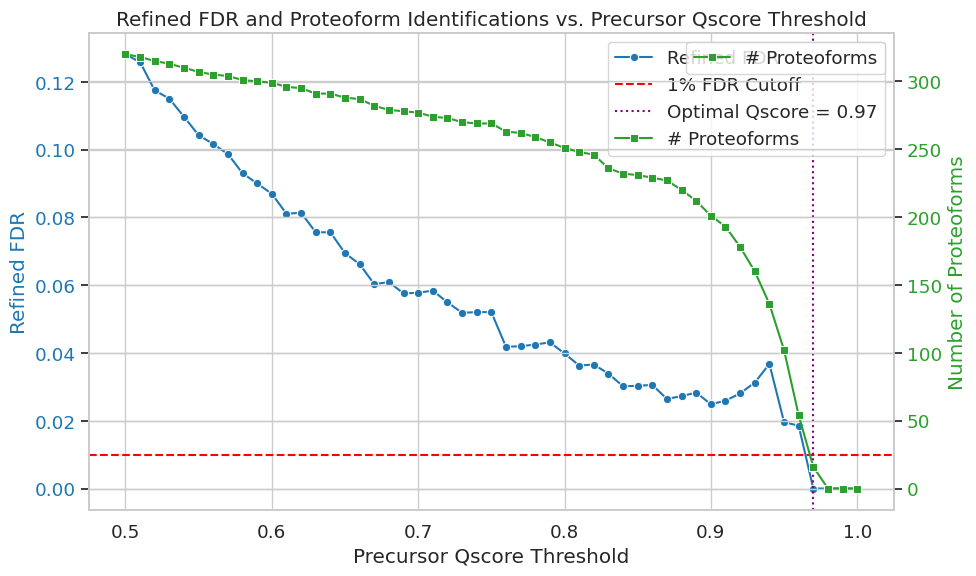

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Style
sns.set(style="whitegrid", font_scale=1.2)

# ✅ Step 1: Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched precursors with Qscore
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC output

# ✅ Step 2: Match TopPIC Identifications with Precursor Info
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Step 3: Remove TopPIC decoys (only keep non-decoy proteins)
matched_toppic = matched_toppic[~matched_toppic["Protein accession"].str.contains("DECOY", na=False)]

# ✅ Step 4: Iterate Over Qscore Thresholds
qscore_thresholds = np.arange(0.5, 1.01, 0.01)
fdr_values = []
num_proteoforms = []
optimal_qscore = None

for qscore in qscore_thresholds:
    filtered = matched_toppic[matched_toppic["PrecursorQscore"] >= qscore]

    ms1_fps = filtered[filtered["TargetDecoyType"] > 0].shape[0]  # Decoy precursors
    ms2_fps = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]  # TopPIC decoys
    total = filtered.shape[0]

    refined_fdr = (ms1_fps + ms2_fps) / total if total > 0 else 0
    fdr_values.append(refined_fdr)
    num_proteoforms.append(total)

    print(f"Qscore: {qscore:.2f} | MS1 FPs: {ms1_fps} | MS2 FPs: {ms2_fps} | Total IDs: {total} | Refined FDR: {refined_fdr:.4f}")

    if refined_fdr <= 0.01 and optimal_qscore is None:
        optimal_qscore = qscore

# ✅ Step 5: Plot FDR and Proteoform Counts
fig, ax1 = plt.subplots(figsize=(10, 6))

# FDR plot
sns.lineplot(x=qscore_thresholds[:len(fdr_values)], y=fdr_values, marker="o", ax=ax1, color="tab:blue", label="Refined FDR")
ax1.set_ylabel("Refined FDR", color="tab:blue")
ax1.tick_params(axis='y', labelcolor="tab:blue")
ax1.set_xlabel("Precursor Qscore Threshold")
ax1.axhline(y=0.01, linestyle="--", color="red", label="1% FDR Cutoff")

# Proteoform count plot
ax2 = ax1.twinx()
sns.lineplot(x=qscore_thresholds[:len(num_proteoforms)], y=num_proteoforms, marker="s", ax=ax2, color="tab:green", label="# Proteoforms")
ax2.set_ylabel("Number of Proteoforms", color="tab:green")
ax2.tick_params(axis='y', labelcolor="tab:green")

# Annotate optimal Qscore
if optimal_qscore:
    ax1.axvline(x=optimal_qscore, color="purple", linestyle=":", label=f"Optimal Qscore = {optimal_qscore:.2f}")

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")

plt.title("Refined FDR and Proteoform Identifications vs. Precursor Qscore Threshold")
plt.tight_layout()
plt.show()


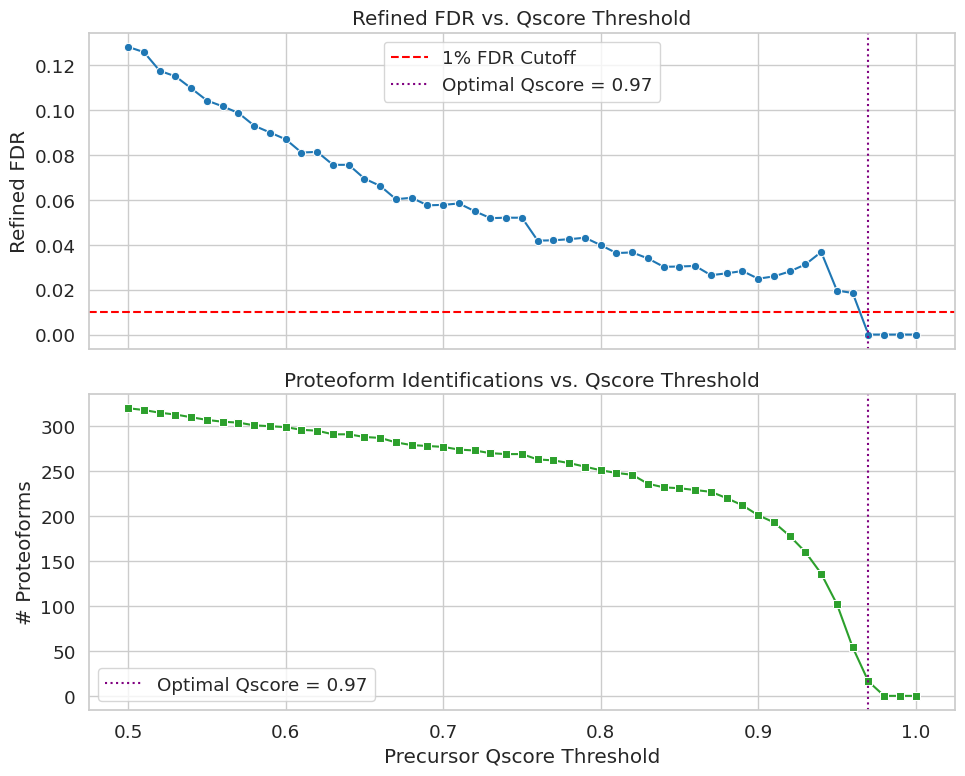

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid", font_scale=1.2)

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# ✅ Match TopPIC Identifications with Qscore
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
matched_toppic = matched_toppic[~matched_toppic["Protein accession"].str.contains("DECOY", na=False)]

# ✅ Compute FDR and Proteoform Counts at Different Qscore Thresholds
qscore_thresholds = np.arange(0.5, 1.01, 0.01)
fdr_values = []
num_proteoforms = []
optimal_qscore = None

for qscore in qscore_thresholds:
    filtered = matched_toppic[matched_toppic["PrecursorQscore"] >= qscore]

    ms1_fps = filtered[filtered["TargetDecoyType"] > 0].shape[0]
    ms2_fps = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]
    total = filtered.shape[0]

    refined_fdr = (ms1_fps + ms2_fps) / total if total > 0 else 0
    fdr_values.append(refined_fdr)
    num_proteoforms.append(total)

    if refined_fdr <= 0.01 and optimal_qscore is None:
        optimal_qscore = qscore

# ✅ Plot as Subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# FDR plot
sns.lineplot(x=qscore_thresholds, y=fdr_values, marker="o", ax=ax1, color="tab:blue")
ax1.axhline(y=0.01, linestyle="--", color="red", label="1% FDR Cutoff")
ax1.axvline(x=optimal_qscore, color="purple", linestyle=":", label=f"Optimal Qscore = {optimal_qscore:.2f}")
ax1.set_ylabel("Refined FDR")
ax1.set_title("Refined FDR vs. Qscore Threshold")
ax1.legend()

# Proteoform count plot
sns.lineplot(x=qscore_thresholds, y=num_proteoforms, marker="s", ax=ax2, color="tab:green")
ax2.axvline(x=optimal_qscore, color="purple", linestyle=":", label=f"Optimal Qscore = {optimal_qscore:.2f}")
ax2.set_ylabel("# Proteoforms")
ax2.set_xlabel("Precursor Qscore Threshold")
ax2.set_title("Proteoform Identifications vs. Qscore Threshold")
ax2.legend()

plt.tight_layout()
plt.show()


<ipython-input-3-56bee585f5ba>:40: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = matched_toppic.groupby(["fdr_bin", "decoy_type"]).size().unstack(fill_value=0)
<ipython-input-3-56bee585f5ba>:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  qscore_avg = matched_toppic.groupby("fdr_bin")["PrecursorQscore"].mean()


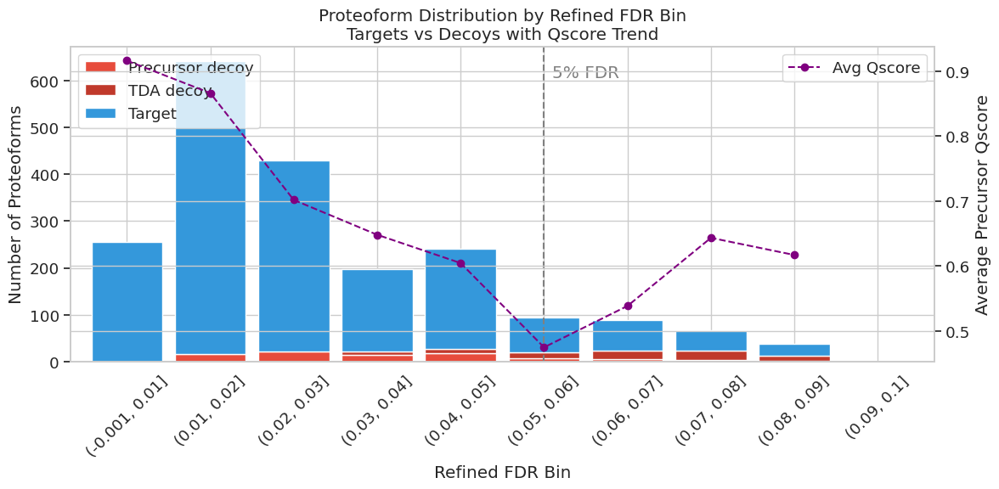

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Setup
sns.set(style="whitegrid", font_scale=1.2)

# Load data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# Rename + Match
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# Decoy classification
matched_toppic["is_precursor_decoy"] = matched_toppic["TargetDecoyType"] > 0
matched_toppic["is_TDA_decoy"] = matched_toppic["Protein accession"].str.contains("DECOY", na=False)
matched_toppic["is_target"] = ~(matched_toppic["is_precursor_decoy"] | matched_toppic["is_TDA_decoy"])

# Label decoy type
matched_toppic["decoy_type"] = "Target"
matched_toppic.loc[matched_toppic["is_precursor_decoy"], "decoy_type"] = "Precursor decoy"
matched_toppic.loc[matched_toppic["is_TDA_decoy"], "decoy_type"] = "TDA decoy"

# Sort by E-value (or Q-value if available)
matched_toppic = matched_toppic.sort_values("E-value")

# Compute cumulative FDR
matched_toppic["running_total"] = np.arange(1, len(matched_toppic) + 1)
matched_toppic["running_decoys"] = (matched_toppic["is_precursor_decoy"].astype(int) + matched_toppic["is_TDA_decoy"].astype(int)).cumsum()
matched_toppic["refined_fdr"] = matched_toppic["running_decoys"] / matched_toppic["running_total"]

# Bin by refined FDR
bins = np.arange(0, 0.101, 0.01)
matched_toppic["fdr_bin"] = pd.cut(matched_toppic["refined_fdr"], bins=bins, include_lowest=True)

# Count proteoforms per bin and decoy type
counts = matched_toppic.groupby(["fdr_bin", "decoy_type"]).size().unstack(fill_value=0)

# Qscore average per bin
qscore_avg = matched_toppic.groupby("fdr_bin")["PrecursorQscore"].mean()

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))

# Stacked bar plot
counts[["Precursor decoy", "TDA decoy", "Target"]].plot(
    kind="bar", stacked=True, ax=ax1, width=0.85,
    color=["#e74c3c", "#c0392b", "#3498db"]
)

ax1.set_xlabel("Refined FDR Bin")
ax1.set_ylabel("Number of Proteoforms")
ax1.set_title("Proteoform Distribution by Refined FDR Bin\nTargets vs Decoys with Qscore Trend")
ax1.tick_params(axis='x', rotation=45)
ax1.legend(loc="upper left")

# Line plot for average Qscore
ax2 = ax1.twinx()
ax2.plot(qscore_avg.index.astype(str), qscore_avg.values, color="purple", marker="o", linestyle="--", label="Avg Qscore")
ax2.set_ylabel("Average Precursor Qscore")
ax2.legend(loc="upper right")

# Add 5% FDR line
ax1.axvline(x=5, color="gray", linestyle="--")  # Bin 0.05 corresponds to index 5
ax1.text(5.1, ax1.get_ylim()[1]*0.9, "5% FDR", color="gray")

plt.tight_layout()
plt.show()


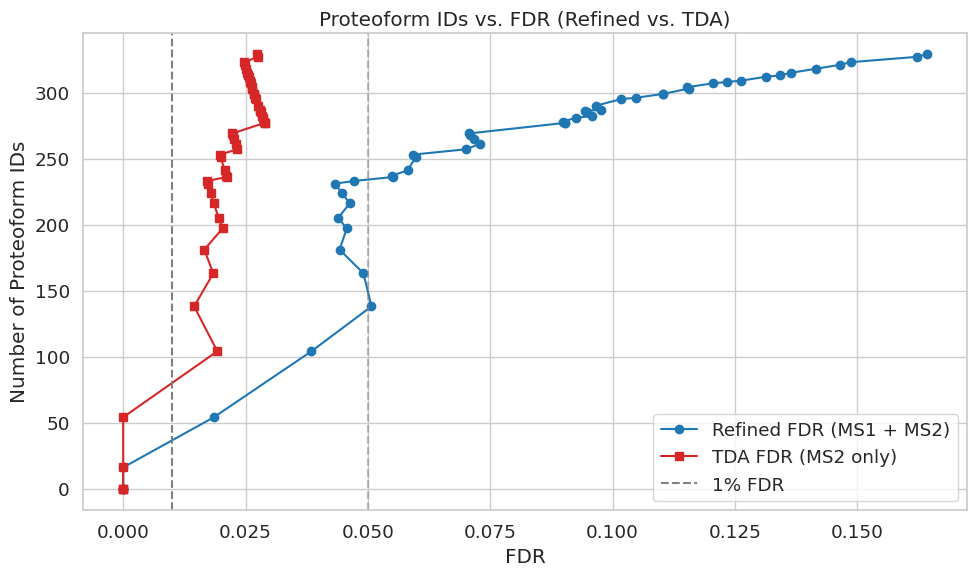

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Setup
sns.set(style="whitegrid", font_scale=1.2)

# Load data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# Merge and clean
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# Store metrics
qscore_thresholds = np.arange(0.5, 1.01, 0.01)
refined_fdr_values, refined_ids = [], []
tda_fdr_values, tda_ids = [], []

for qscore in qscore_thresholds:
    filtered = matched[matched["PrecursorQscore"] >= qscore]

    ms1_decoys = filtered[filtered["TargetDecoyType"] > 0].shape[0]  # Precursor decoys
    ms2_decoys = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]  # TDA decoys
    total_ids = filtered.shape[0]

    refined_fdr = (ms1_decoys + ms2_decoys) / total_ids if total_ids > 0 else 0
    tda_fdr = ms2_decoys / total_ids if total_ids > 0 else 0

    # Save values
    refined_fdr_values.append(refined_fdr)
    refined_ids.append(total_ids)
    tda_fdr_values.append(tda_fdr)
    tda_ids.append(total_ids)

# Prepare plotting dataframe
df_plot = pd.DataFrame({
    "Qscore": qscore_thresholds,
    "Refined_FDR": refined_fdr_values,
    "TDA_FDR": tda_fdr_values,
    "Proteoform_IDs": refined_ids  # same for both lines
})

# Filter for FDR range [0–5%]
df_filtered = df_plot[df_plot["Refined_FDR"] <= 0.05]

# Plot
plt.figure(figsize=(10, 6))

# Refined FDR
plt.plot(df_plot["Refined_FDR"], df_plot["Proteoform_IDs"], marker="o", label="Refined FDR (MS1 + MS2)", color="tab:blue")

# TDA FDR
plt.plot(df_plot["TDA_FDR"], df_plot["Proteoform_IDs"], marker="s", label="TDA FDR (MS2 only)", color="tab:red")

plt.axvline(0.01, linestyle="--", color="gray", label="1% FDR")
plt.axvline(0.05, linestyle="--", color="gray", alpha=0.5)

plt.xlabel("FDR")
plt.ylabel("Number of Proteoform IDs")
plt.title("Proteoform IDs vs. FDR (Refined vs. TDA)")
plt.legend()
plt.tight_layout()
plt.show()


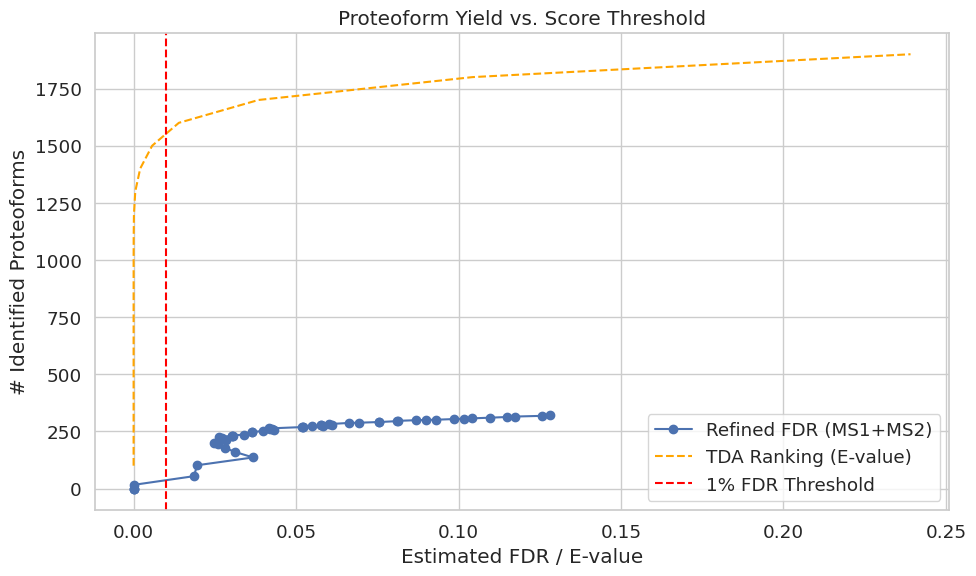

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load files
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# Merge data
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# Remove TopPIC decoys
matched = matched[~matched["Protein accession"].str.contains("DECOY", na=False)]

# Refined FDR curve
qscore_thresholds = np.arange(0.5, 1.01, 0.01)
refined_fdrs = []
target_counts = []

for thresh in qscore_thresholds:
    filtered = matched[matched["PrecursorQscore"] >= thresh]
    ms1_fp = filtered[filtered["TargetDecoyType"] > 0].shape[0]
    ms2_fp = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]
    total = filtered.shape[0]
    fdr = (ms1_fp + ms2_fp) / total if total > 0 else 0
    refined_fdrs.append(fdr)
    target_counts.append(total)

# TDA-based ranking using E-value
toppic_data["E-value"] = pd.to_numeric(toppic_data["E-value"], errors="coerce")
toppic_target_only = toppic_data[~toppic_data["Protein accession"].str.contains("DECOY", na=False)]
tda_sorted = toppic_target_only.sort_values("E-value")

tda_fdrs = []
tda_counts = []
for topn in range(100, len(tda_sorted), 100):
    subset = tda_sorted.iloc[:topn]
    tda_fdrs.append(subset["E-value"].max())
    tda_counts.append(len(subset))

# Plot
plt.figure(figsize=(10, 6))
plt.plot(refined_fdrs, target_counts, label="Refined FDR (MS1+MS2)", marker='o')
plt.plot(tda_fdrs, tda_counts, label="TDA Ranking (E-value)", linestyle='--', color='orange')
plt.axvline(0.01, color='red', linestyle='--', label="1% FDR Threshold")

plt.xlabel("Estimated FDR / E-value")
plt.ylabel("# Identified Proteoforms")
plt.title("Proteoform Yield vs. Score Threshold")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


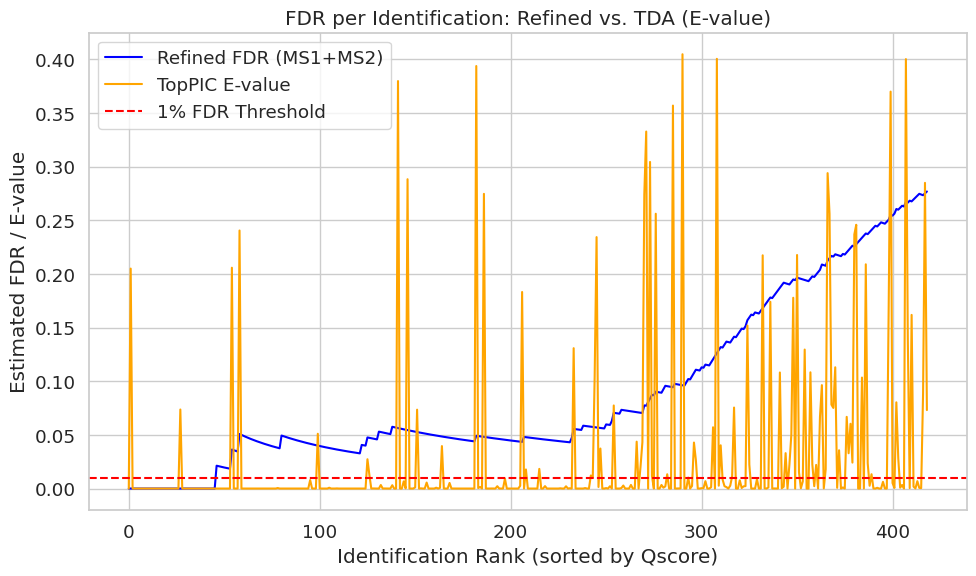

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and merge data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# Clean
matched = matched.dropna(subset=["PrecursorQscore", "E-value"])
matched["E-value"] = pd.to_numeric(matched["E-value"], errors="coerce")

# Sort by Qscore
matched_sorted = matched.sort_values("PrecursorQscore", ascending=False)

refined_fdrs = []
top_evalues = []

ms1_fp = 0
ms2_fp = 0
total = 0

for _, row in matched_sorted.iterrows():
    total += 1
    if row["TargetDecoyType"] > 0:
        ms1_fp += 1
    if "DECOY" in str(row["Protein accession"]):
        ms2_fp += 1
    refined_fdrs.append((ms1_fp + ms2_fp) / total)
    top_evalues.append(row["E-value"])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(refined_fdrs, label="Refined FDR (MS1+MS2)", color="blue")
plt.plot(top_evalues, label="TopPIC E-value", color="orange")
plt.axhline(0.01, color="red", linestyle="--", label="1% FDR Threshold")

plt.xlabel("Identification Rank (sorted by Qscore)")
plt.ylabel("Estimated FDR / E-value")
plt.title("FDR per Identification: Refined vs. TDA (E-value)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-12-6d1c8d35e0ee>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=fdr_df, x="Method", y="FDR", palette=["#E74C3C", "#3498DB"])
<ipython-input-12-6d1c8d35e0ee>:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


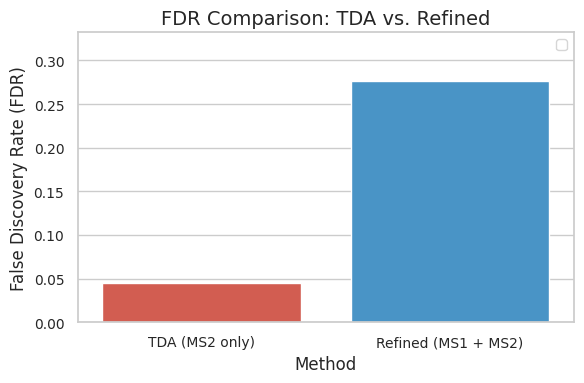

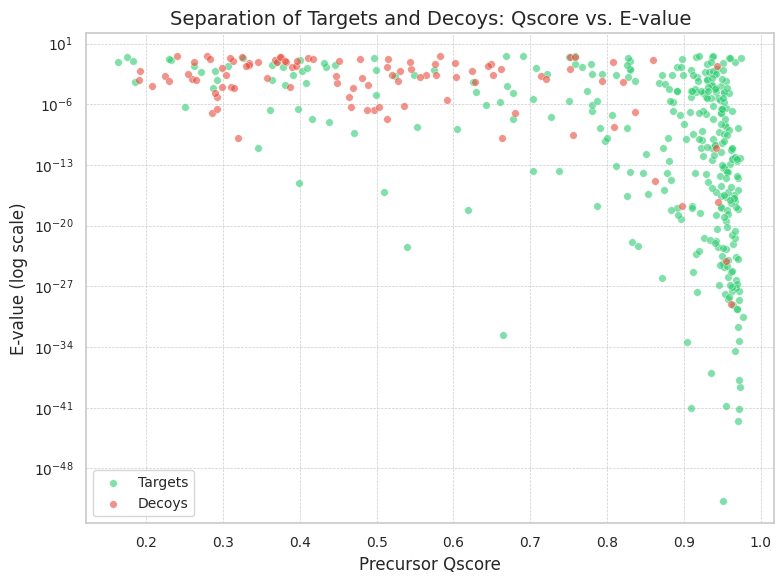

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 📌 Style and Config
sns.set(style="whitegrid")
plt.rcParams.update({
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10
})

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # Matched precursors (MS2)
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC proteoforms

# ✅ Merge TopPIC with precursor Qscores
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Clean up and convert E-value
matched["E-value"] = pd.to_numeric(matched["E-value"], errors="coerce")
matched = matched.dropna(subset=["E-value", "PrecursorQscore", "Protein accession", "TargetDecoyType"])

# ✅ FDR Estimation
num_total = matched.shape[0]
num_ms1_decoys = (matched["TargetDecoyType"] > 0).sum()
num_ms2_decoys = matched["Protein accession"].str.contains("DECOY", na=False).sum()
num_ms2_targets = (~matched["Protein accession"].str.contains("DECOY", na=False)).sum()

tda_fdr = num_ms2_decoys / num_ms2_targets if num_ms2_targets > 0 else 0
precursor_fdr = (num_ms1_decoys + num_ms2_decoys) / num_total if num_total > 0 else 0

# ✅ FDR Comparison Barplot
fdr_df = pd.DataFrame({
    "Method": ["TDA (MS2 only)", "Refined (MS1 + MS2)"],
    "FDR": [tda_fdr, precursor_fdr]
})

plt.figure(figsize=(6, 4))
sns.barplot(data=fdr_df, x="Method", y="FDR", palette=["#E74C3C", "#3498DB"])
#plt.axhline(0.01, color="black", linestyle="dashed", label="1% FDR")
plt.ylabel("False Discovery Rate (FDR)")
plt.title("FDR Comparison: TDA vs. Refined")
plt.ylim(0, max(fdr_df["FDR"].max() * 1.2, 0.02))
plt.legend()
plt.tight_layout()
plt.show()

# ✅ Scatter Plot: Qscore vs. E-value
plt.figure(figsize=(8, 6))
targets = matched[matched["TargetDecoyType"] == 0]
decoys = matched[matched["TargetDecoyType"] > 0]

sns.scatterplot(data=targets, x="PrecursorQscore", y="E-value", label="Targets", alpha=0.6, color="#2ECC71", s=30)
sns.scatterplot(data=decoys, x="PrecursorQscore", y="E-value", label="Decoys", alpha=0.6, color="#E74C3C", s=30)

plt.yscale("log")
plt.xlabel("Precursor Qscore")
plt.ylabel("E-value (log scale)")
plt.title("Separation of Targets and Decoys: Qscore vs. E-value")
plt.legend()
plt.tight_layout()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()


<ipython-input-16-175aaeaaa77e>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=count_df, x="Type", y="Count", palette=["#2ECC71", "#E74C3C", "#3498DB"])  # green, red, blue


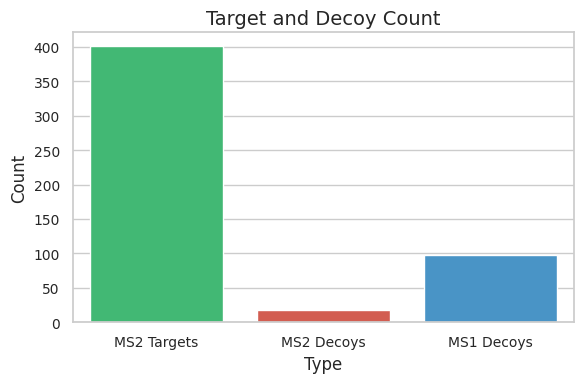

<ipython-input-16-175aaeaaa77e>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=fdr_df, x="Method", y="FDR", palette=["#E74C3C", "#3498DB"])


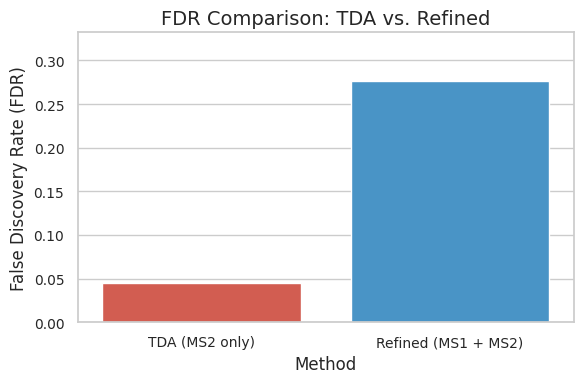

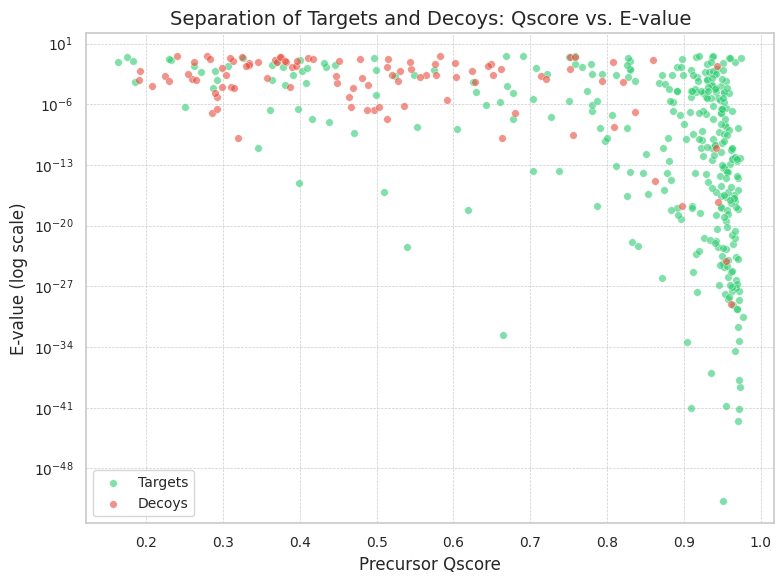

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 📌 Style and Config
sns.set(style="whitegrid")
plt.rcParams.update({
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10
})

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # Matched precursors (MS2)
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC proteoforms

# ✅ Merge TopPIC with precursor Qscores
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Clean up and convert E-value
matched["E-value"] = pd.to_numeric(matched["E-value"], errors="coerce")
matched = matched.dropna(subset=["E-value", "PrecursorQscore", "Protein accession", "TargetDecoyType"])

# ✅ FDR Estimation
num_total = matched.shape[0]
num_ms1_decoys = (matched["TargetDecoyType"] > 0).sum()
num_ms2_decoys = matched["Protein accession"].str.contains("DECOY", na=False).sum()
num_ms2_targets = (~matched["Protein accession"].str.contains("DECOY", na=False)).sum()

tda_fdr = num_ms2_decoys / num_ms2_targets if num_ms2_targets > 0 else 0
precursor_fdr = (num_ms1_decoys + num_ms2_decoys) / num_total if num_total > 0 else 0

# ✅ Bar Plot: Count of Target/Decoy Matches
count_df = pd.DataFrame({
    "Type": ["MS2 Targets", "MS2 Decoys", "MS1 Decoys"],
    "Count": [num_ms2_targets, num_ms2_decoys, num_ms1_decoys]
})

plt.figure(figsize=(6, 4))
sns.barplot(data=count_df, x="Type", y="Count", palette=["#2ECC71", "#E74C3C", "#3498DB"])  # green, red, blue
plt.ylabel("Count")
plt.title("Target and Decoy Count")
plt.tight_layout()
plt.show()

# ✅ FDR Comparison Barplot
fdr_df = pd.DataFrame({
    "Method": ["TDA (MS2 only)", "Refined (MS1 + MS2)"],
    "FDR": [tda_fdr, precursor_fdr]
})

plt.figure(figsize=(6, 4))
sns.barplot(data=fdr_df, x="Method", y="FDR", palette=["#E74C3C", "#3498DB"])
plt.ylabel("False Discovery Rate (FDR)")
plt.title("FDR Comparison: TDA vs. Refined")
plt.ylim(0, max(fdr_df["FDR"].max() * 1.2, 0.02))
plt.tight_layout()
plt.show()

# ✅ Scatter Plot: Qscore vs. E-value
plt.figure(figsize=(8, 6))
targets = matched[matched["TargetDecoyType"] == 0]
decoys = matched[matched["TargetDecoyType"] > 0]

sns.scatterplot(data=targets, x="PrecursorQscore", y="E-value", label="Targets", alpha=0.6, color="#2ECC71", s=30)
sns.scatterplot(data=decoys, x="PrecursorQscore", y="E-value", label="Decoys", alpha=0.6, color="#E74C3C", s=30)

plt.yscale("log")
plt.xlabel("Precursor Qscore")
plt.ylabel("E-value (log scale)")
plt.title("Separation of Targets and Decoys: Qscore vs. E-value")
plt.legend()
plt.tight_layout()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()


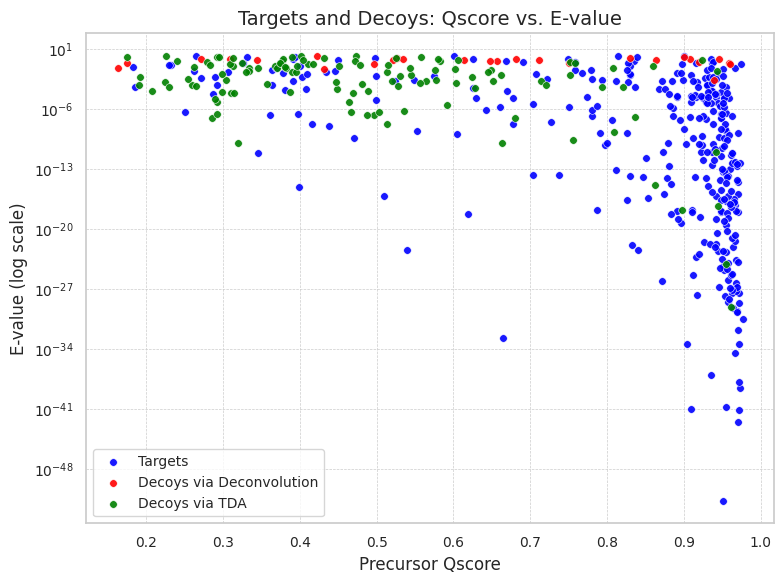

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 📌 Style and Config
sns.set(style="whitegrid")
plt.rcParams.update({
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10
})

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # Matched precursors (MS2)
toppic_data = pd.read_csv("/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv", sep="\t", skiprows=26)  # TopPIC proteoforms

# ✅ Merge TopPIC with precursor Qscores
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Clean up and convert E-value
matched["E-value"] = pd.to_numeric(matched["E-value"], errors="coerce")
matched = matched.dropna(subset=["E-value", "PrecursorQscore", "Protein accession", "TargetDecoyType"])

# ✅ Define categories for scatter plot
ms2_targets = matched[(~matched["Protein accession"].str.contains("DECOY", na=False)) & (matched["TargetDecoyType"] == 0)]
ms2_decoys = matched[(matched["Protein accession"].str.contains("DECOY", na=False)) & (matched["TargetDecoyType"] == 0)]
ms1_decoys = matched[matched["TargetDecoyType"] > 0]

# ✅ Scatter Plot: Qscore vs. E-value
plt.figure(figsize=(8, 6))

sns.scatterplot(data=ms2_targets, x="PrecursorQscore", y="E-value", label="Targets", color="blue", s=30, alpha=0.9)
sns.scatterplot(data=ms2_decoys, x="PrecursorQscore", y="E-value", label="Decoys via Deconvolution", color="red", s=30, alpha=0.9)
sns.scatterplot(data=ms1_decoys, x="PrecursorQscore", y="E-value", label="Decoys via TDA", color="green", s=30, alpha=0.9)

plt.yscale("log")
plt.xlabel("Precursor Qscore")
plt.ylabel("E-value (log scale)")
plt.title("Targets and Decoys: Qscore vs. E-value")
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()


<ipython-input-15-7715a7ed1cd6>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=fdr_df, x="Method", y="FDR", palette=["#E74C3C", "#3498DB"])


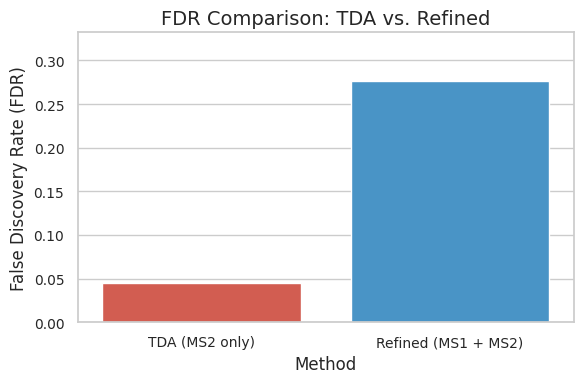

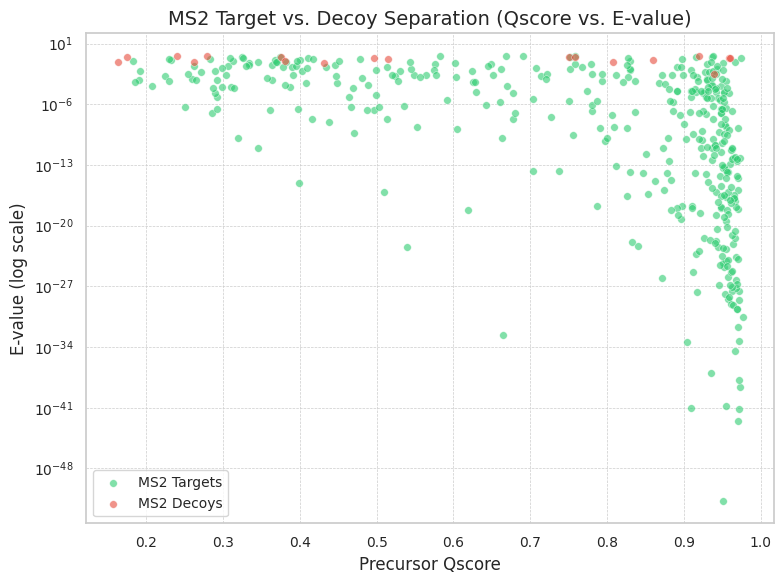

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 📌 Style and Config
sns.set(style="whitegrid")
plt.rcParams.update({
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10
})

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # Matched precursors (MS2)
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC proteoforms

# ✅ Merge TopPIC with precursor Qscores
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Clean up and convert E-value
matched["E-value"] = pd.to_numeric(matched["E-value"], errors="coerce")
matched = matched.dropna(subset=["E-value", "PrecursorQscore", "Protein accession", "TargetDecoyType"])

# ✅ FDR Estimation
num_total = matched.shape[0]
num_ms1_decoys = (matched["TargetDecoyType"] > 0).sum()
num_ms2_decoys = matched["Protein accession"].str.contains("DECOY", na=False).sum()
num_ms2_targets = (~matched["Protein accession"].str.contains("DECOY", na=False)).sum()

tda_fdr = num_ms2_decoys / num_ms2_targets if num_ms2_targets > 0 else 0
precursor_fdr = (num_ms1_decoys + num_ms2_decoys) / num_total if num_total > 0 else 0

# ✅ FDR Comparison Barplot
fdr_df = pd.DataFrame({
    "Method": ["TDA (MS2 only)", "Refined (MS1 + MS2)"],
    "FDR": [tda_fdr, precursor_fdr]
})

plt.figure(figsize=(6, 4))
sns.barplot(data=fdr_df, x="Method", y="FDR", palette=["#E74C3C", "#3498DB"])
plt.ylabel("False Discovery Rate (FDR)")
plt.title("FDR Comparison: TDA vs. Refined")
plt.ylim(0, max(fdr_df["FDR"].max() * 1.2, 0.02))
plt.tight_layout()
plt.show()

# ✅ Scatter Plot: Precursor Qscore vs. E-value (colored by MS2 TDA)
plt.figure(figsize=(8, 6))

# Separate based on MS2 TDA (Protein accession)
targets_ms2 = matched[~matched["Protein accession"].str.contains("DECOY", na=False)]
decoys_ms2 = matched[matched["Protein accession"].str.contains("DECOY", na=False)]

sns.scatterplot(data=targets_ms2, x="PrecursorQscore", y="E-value",
                label="MS2 Targets", alpha=0.6, color="#2ECC71", s=30)
sns.scatterplot(data=decoys_ms2, x="PrecursorQscore", y="E-value",
                label="MS2 Decoys", alpha=0.6, color="#E74C3C", s=30)

plt.yscale("log")
plt.xlabel("Precursor Qscore")
plt.ylabel("E-value (log scale)")
plt.title("MS2 Target vs. Decoy Separation (Qscore vs. E-value)")
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()


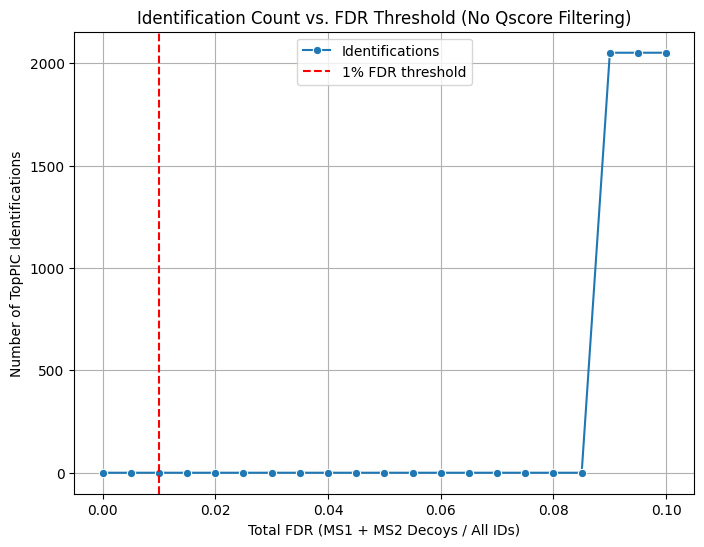

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched precursors
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC output

# Match by scan number
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# Compute per-row decoy flags
matched["Is_MS1_Decoy"] = matched["TargetDecoyType"] > 0
matched["Is_MS2_Decoy"] = matched["Protein accession"].str.contains("DECOY", na=False)

# Sweep over FDR cutoffs
fdr_thresholds = np.arange(0.0, 0.101, 0.005)
ident_counts = []

for fdr_cutoff in fdr_thresholds:
    # Assume global FDR estimated as (MS1 + MS2 decoys) / total
    ms1_fps = matched["Is_MS1_Decoy"].sum()
    ms2_fps = matched["Is_MS2_Decoy"].sum()
    total = matched.shape[0]

    global_fdr = (ms1_fps + ms2_fps) / total if total > 0 else 0

    # If global FDR ≤ threshold, accept all identifications
    if global_fdr <= fdr_cutoff:
        ident_counts.append(total)
    else:
        ident_counts.append(0)  # otherwise, reject all

# Plot
plt.figure(figsize=(8, 6))
sns.lineplot(x=fdr_thresholds, y=ident_counts, marker="o", label="Identifications")

plt.axvline(x=0.01, color="red", linestyle="--", label="1% FDR threshold")
plt.xlabel("Total FDR (MS1 + MS2 Decoys / All IDs)")
plt.ylabel("Number of TopPIC Identifications")
plt.title("Identification Count vs. FDR Threshold (No Qscore Filtering)")
plt.grid(True)
plt.legend()
plt.show()


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Separate targets and decoys
targets = matched[matched["TargetDecoyType"] == 0]
decoys = matched[matched["TargetDecoyType"] > 0]

# Plot distributions
plt.figure(figsize=(8, 5))
sns.histplot(targets["JointScore"], bins=50, label="Targets", color="green", stat="density", kde=True)
sns.histplot(decoys["JointScore"], bins=50, label="Decoys", color="red", stat="density", kde=True)

plt.xlabel("Joint Score (Qscore × -log10(E-value))")
plt.ylabel("Density")
plt.title("Discrimination Between Targets and Decoys: Joint Score")
plt.legend()
plt.tight_layout()
plt.show()


KeyError: 'JointScore'

<Figure size 800x500 with 0 Axes>

<ipython-input-15-2a0a5033e9af>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data["DeltaMass"] = filtered_data[modification_column].apply(extract_mass)


✅ Total Identifications: 104
✅ Unmodified Proteoforms: 60
✅ Modified Proteoforms: 44


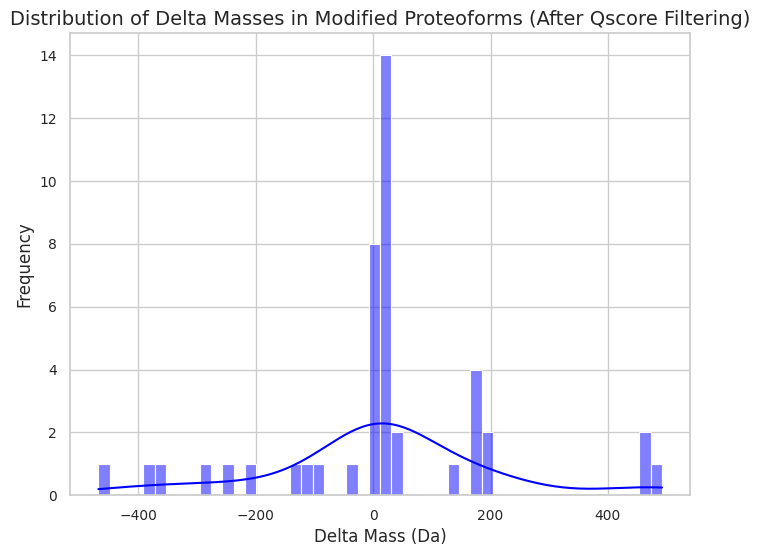

✅ Filtered data saved as 'Filtered_TopPIC_with_Qscore.tsv'


<ipython-input-15-2a0a5033e9af>:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=count_df, x="Type", y="Count", palette=["green", "red", "blue"])


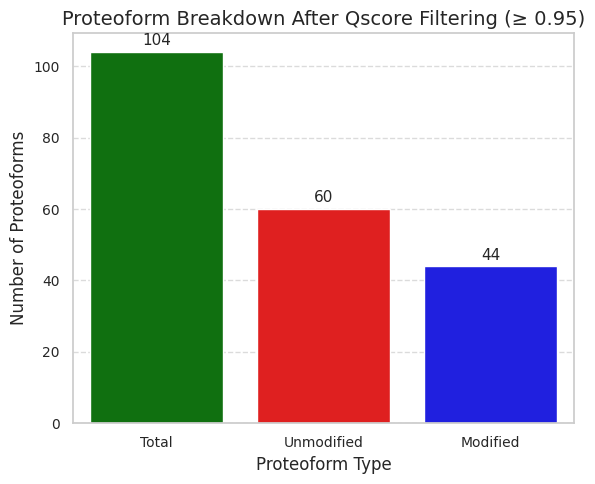

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re  # For extracting numeric delta masses

# ✅ Step 1: Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched precursors
toppic_data = pd.read_csv("/content/spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC output

# ✅ Step 2: Match TopPIC Identifications with Precursor Info from FileAQ
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)  # Standardize column name
matched_data = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Step 3: Apply Qscore Filtering (to enforce refined FDR)
qscore_column = "PrecursorQscore"  # Ensure this column is present in FileAQ
qscore_threshold = 0.95  # Adjust this based on analysis

if qscore_column in matched_data.columns:
    filtered_data = matched_data[matched_data[qscore_column] >= qscore_threshold]
else:
    print(f"❌ Column '{qscore_column}' not found in FileAQ!")
    exit()

# ✅ Step 4: Extract Delta Mass from "unexpected modifications"
modification_column = "unexpected modifications"  # Confirmed from the dataset

def extract_mass(value):
    """Extracts numeric delta mass from unexpected modifications column."""
    if pd.isna(value) or value == "0" or value == "":
        return np.nan  # No modification
    match = re.search(r'[-+]?\d*\.\d+|\d+', str(value))  # Extract numeric values
    return float(match.group()) if match else np.nan

filtered_data["DeltaMass"] = filtered_data[modification_column].apply(extract_mass)

# ✅ Step 5: Classify Unmodified and Modified Proteoforms
unmodified = filtered_data[filtered_data["DeltaMass"].isna()]
modified = filtered_data[filtered_data["DeltaMass"].notna()]

print(f"✅ Total Identifications: {filtered_data.shape[0]}")
print(f"✅ Unmodified Proteoforms: {unmodified.shape[0]}")
print(f"✅ Modified Proteoforms: {modified.shape[0]}")

# ✅ Step 6: Plot Delta Mass Histogram
plt.figure(figsize=(8, 6))
sns.histplot(modified["DeltaMass"], bins=50, kde=True, color="blue")
plt.xlabel("Delta Mass (Da)")
plt.ylabel("Frequency")
plt.title("Distribution of Delta Masses in Modified Proteoforms (After Qscore Filtering)")
plt.grid(True)
plt.show()

# ✅ Step 7: Save Filtered Data
filtered_data.to_csv("Filtered_TopPIC_with_Qscore.tsv", sep="\t", index=False)
print("✅ Filtered data saved as 'Filtered_TopPIC_with_Qscore.tsv'")
# ✅ Prepare Data Summary
counts = {
    "Type": ["Total", "Unmodified", "Modified"],
    "Count": [
        filtered_data.shape[0],
        unmodified.shape[0],
        modified.shape[0]
    ]
}
count_df = pd.DataFrame(counts)

# ✅ Plot Grouped Bar Chart
plt.figure(figsize=(6, 5))
sns.barplot(data=count_df, x="Type", y="Count", palette=["green", "red", "blue"])

# Add annotations
for index, row in count_df.iterrows():
    plt.text(index, row["Count"] + 1, str(row["Count"]), ha='center', va='bottom', fontsize=11)

plt.title("Proteoform Breakdown After Qscore Filtering (≥ 0.95)")
plt.ylabel("Number of Proteoforms")
plt.xlabel("Proteoform Type")
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()



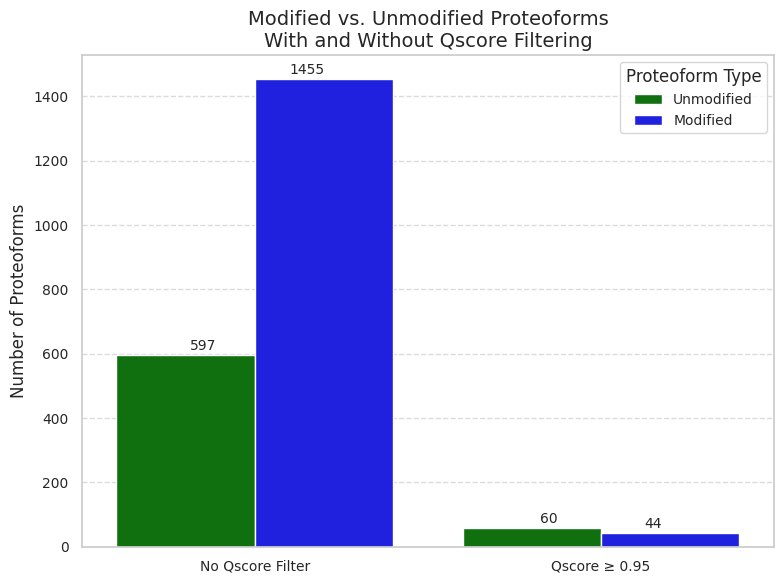

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# ✅ Standardize scan number column
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_data = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Extract delta mass
def extract_mass(value):
    if pd.isna(value) or value == "0" or value == "":
        return np.nan
    match = re.search(r'[-+]?\d*\.\d+|\d+', str(value))
    return float(match.group()) if match else np.nan

matched_data["DeltaMass"] = matched_data["unexpected modifications"].apply(extract_mass)

# ✅ Split without Qscore filtering
unmodified_all = matched_data[matched_data["DeltaMass"].isna()]
modified_all = matched_data[matched_data["DeltaMass"].notna()]

# ✅ Apply Qscore filtering
qscore_threshold = 0.95
filtered_data = matched_data[matched_data["PrecursorQscore"] >= qscore_threshold]

# ✅ Split with Qscore filtering
unmodified_filt = filtered_data[filtered_data["DeltaMass"].isna()]
modified_filt = filtered_data[filtered_data["DeltaMass"].notna()]

# ✅ Prepare DataFrames
counts_no_filter = pd.DataFrame({
    "Filter": "No Qscore Filter",
    "Type": ["Unmodified", "Modified"],
    "Count": [len(unmodified_all), len(modified_all)]
})

counts_filtered = pd.DataFrame({
    "Filter": "Qscore ≥ 0.95",
    "Type": ["Unmodified", "Modified"],
    "Count": [len(unmodified_filt), len(modified_filt)]
})

summary_df = pd.concat([counts_no_filter, counts_filtered], ignore_index=True)

# ✅ Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=summary_df, x="Filter", y="Count", hue="Type", palette=["green", "blue"])

for i, row in summary_df.iterrows():
    plt.text(
        x=i // 2 + (-0.15 if row["Type"] == "Unmodified" else 0.15),
        y=row["Count"] + 5,
        s=str(row["Count"]),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Modified vs. Unmodified Proteoforms\nWith and Without Qscore Filtering")
plt.ylabel("Number of Proteoforms")
plt.xlabel("")
plt.legend(title="Proteoform Type")
plt.tight_layout()
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()


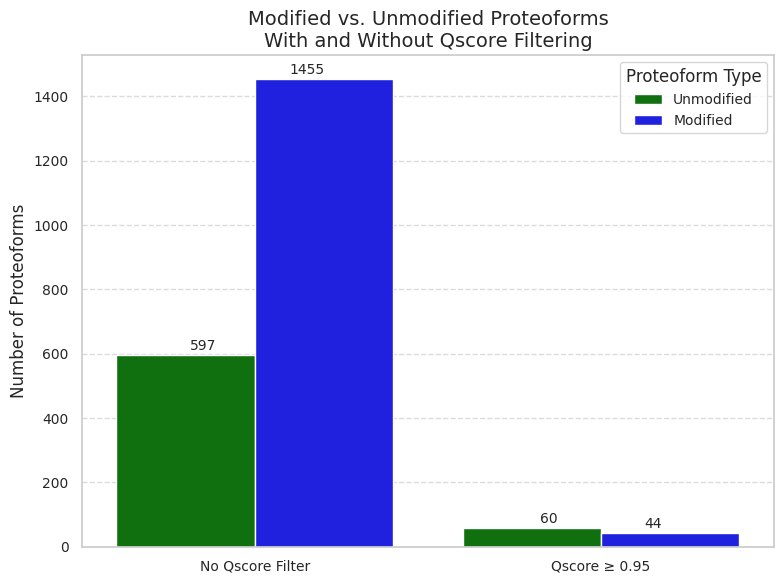

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# ✅ Standardize scan number column
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_data = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Extract delta mass
def extract_mass(value):
    if pd.isna(value) or value == "0" or value == "":
        return np.nan
    match = re.search(r'[-+]?\d*\.\d+|\d+', str(value))
    return float(match.group()) if match else np.nan

matched_data["DeltaMass"] = matched_data["unexpected modifications"].apply(extract_mass)

# ✅ Split without Qscore filtering
unmodified_all = matched_data[matched_data["DeltaMass"].isna()]
modified_all = matched_data[matched_data["DeltaMass"].notna()]

# ✅ Apply Qscore filtering
qscore_threshold = 0.95
filtered_data = matched_data[matched_data["PrecursorQscore"] >= qscore_threshold]

# ✅ Split with Qscore filtering
unmodified_filt = filtered_data[filtered_data["DeltaMass"].isna()]
modified_filt = filtered_data[filtered_data["DeltaMass"].notna()]

# ✅ Prepare DataFrames
counts_no_filter = pd.DataFrame({
    "Filter": "No Qscore Filter",
    "Type": ["Unmodified", "Modified"],
    "Count": [len(unmodified_all), len(modified_all)]
})

counts_filtered = pd.DataFrame({
    "Filter": "Qscore ≥ 0.95",
    "Type": ["Unmodified", "Modified"],
    "Count": [len(unmodified_filt), len(modified_filt)]
})

summary_df = pd.concat([counts_no_filter, counts_filtered], ignore_index=True)

# ✅ Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=summary_df, x="Filter", y="Count", hue="Type", palette=["green", "blue"])

for i, row in summary_df.iterrows():
    plt.text(
        x=i // 2 + (-0.15 if row["Type"] == "Unmodified" else 0.15),
        y=row["Count"] + 5,
        s=str(row["Count"]),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Modified vs. Unmodified Proteoforms\nWith and Without Qscore Filtering")
plt.ylabel("Number of Proteoforms")
plt.xlabel("")
plt.legend(title="Proteoform Type")
plt.tight_layout()
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()


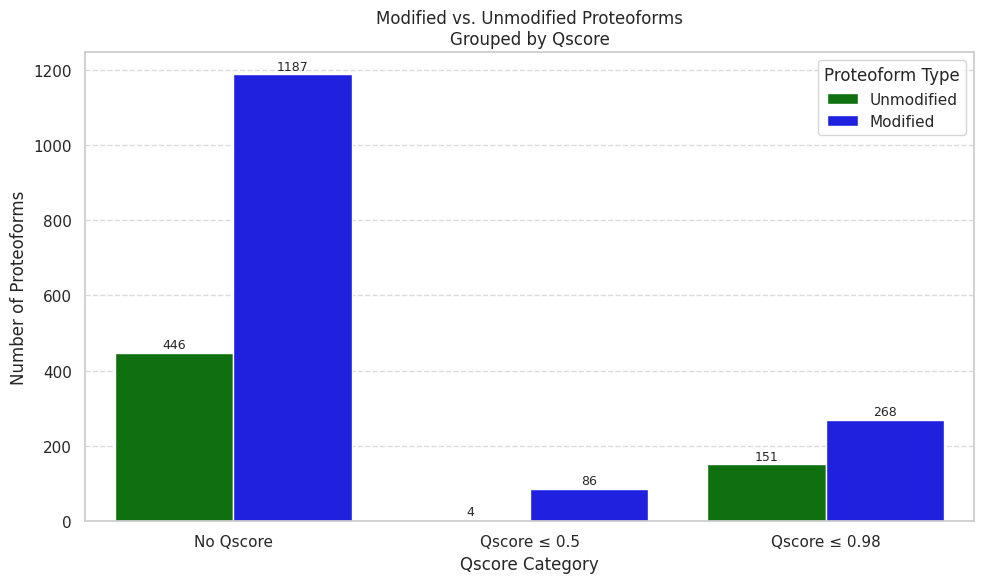

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# ✅ Standardize scan number column
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_data = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Extract delta mass
def extract_mass(value):
    if pd.isna(value) or value == "0" or value == "":
        return np.nan
    match = re.search(r'[-+]?\d*\.\d+|\d+', str(value))
    return float(match.group()) if match else np.nan

matched_data["DeltaMass"] = matched_data["unexpected modifications"].apply(extract_mass)

# ✅ Define Qscore-based groups
group_no_qscore = matched_data[matched_data["PrecursorQscore"].isna()]
group_qscore_050 = matched_data[(matched_data["PrecursorQscore"] <= 0.5)]
group_qscore_098 = matched_data[(matched_data["PrecursorQscore"] <= 0.98)]

# ✅ Helper to create count DataFrame
def count_modified_unmodified(df, label):
    return pd.DataFrame({
        "Filter": label,
        "Type": ["Unmodified", "Modified"],
        "Count": [
            df["DeltaMass"].isna().sum(),
            df["DeltaMass"].notna().sum()
        ]
    })

# ✅ Generate counts
df_no_qscore = count_modified_unmodified(group_no_qscore, "No Qscore")
df_qscore_050 = count_modified_unmodified(group_qscore_050, "Qscore ≤ 0.5")
df_qscore_098 = count_modified_unmodified(group_qscore_098, "Qscore ≤ 0.98")

# ✅ Combine
summary_df = pd.concat([df_no_qscore, df_qscore_050, df_qscore_098], ignore_index=True)

# ✅ Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=summary_df, x="Filter", y="Count", hue="Type", palette=["green", "blue"])

for i, row in summary_df.iterrows():
    x_offset = -0.2 if row["Type"] == "Unmodified" else 0.2
    plt.text(
        x=i // 2 + x_offset,
        y=row["Count"] + 5,
        s=str(row["Count"]),
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.title("Modified vs. Unmodified Proteoforms\nGrouped by Qscore")
plt.ylabel("Number of Proteoforms")
plt.xlabel("Qscore Category")
plt.legend(title="Proteoform Type")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


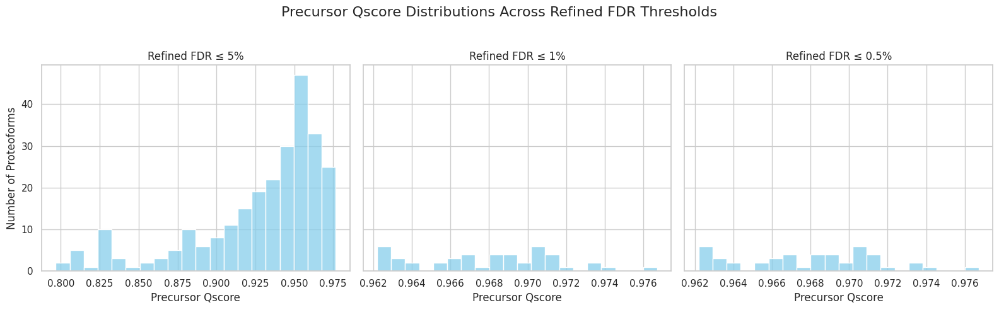

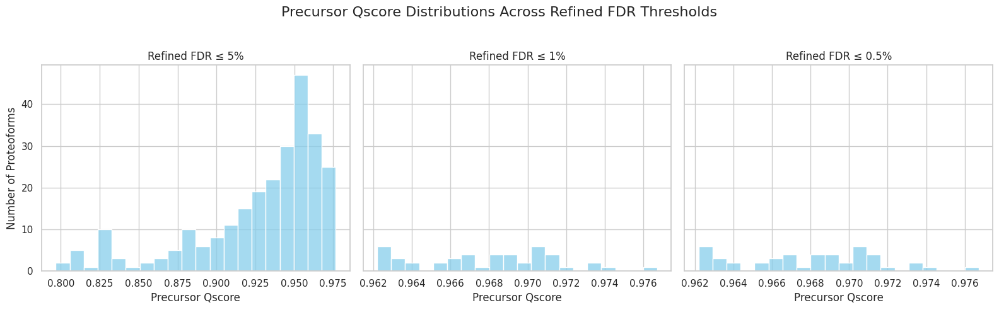

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# ✅ Merge and prepare
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
merged = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
merged = merged.dropna(subset=["E-value", "PrecursorQscore", "TargetDecoyType"])

# ✅ Sort by Qscore and assign refined FDR
merged = merged.sort_values("PrecursorQscore", ascending=False)
merged["IsDecoy"] = merged["TargetDecoyType"] > 0
merged["CumulativeDecoy"] = merged["IsDecoy"].cumsum()
merged["CumulativeTarget"] = (~merged["IsDecoy"]).cumsum()
merged["RefinedFDR"] = merged["CumulativeDecoy"] / merged["CumulativeTarget"]

# ✅ Define FDR thresholds
fdr_thresholds = [0.05, 0.01, 0.005]
titles = ["Refined FDR ≤ 5%", "Refined FDR ≤ 1%", "Refined FDR ≤ 0.5%"]

# ✅ Plot
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharey=True)

for ax, fdr_cutoff, title in zip(axes, fdr_thresholds, titles):
    subset = merged[merged["RefinedFDR"] <= fdr_cutoff]
    sns.histplot(subset["PrecursorQscore"], bins=20, ax=ax, color="skyblue", kde=False)
    ax.set_title(title)
    ax.set_xlabel("Precursor Qscore")
    ax.set_ylabel("Number of Proteoforms")

plt.suptitle("Precursor Qscore Distributions Across Refined FDR Thresholds", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


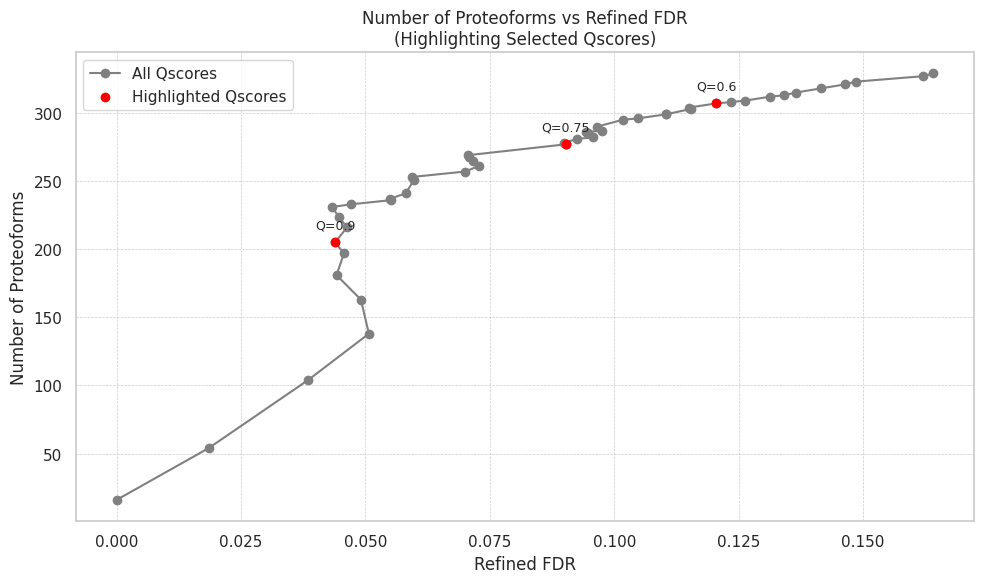

In [21]:
import matplotlib.pyplot as plt
import pandas as pd

# Define the data manually
data = [
    (0.50, 329), (0.51, 327), (0.52, 323), (0.53, 321), (0.54, 318), (0.55, 315),
    (0.56, 313), (0.57, 312), (0.58, 309), (0.59, 308), (0.60, 307), (0.61, 304),
    (0.62, 303), (0.63, 299), (0.64, 299), (0.65, 296), (0.66, 295), (0.67, 290),
    (0.68, 287), (0.69, 286), (0.70, 285), (0.71, 282), (0.72, 281), (0.73, 278),
    (0.74, 277), (0.75, 277), (0.76, 269), (0.77, 268), (0.78, 265), (0.79, 261),
    (0.80, 257), (0.81, 253), (0.82, 251), (0.83, 241), (0.84, 237), (0.85, 236),
    (0.86, 233), (0.87, 231), (0.88, 224), (0.89, 216), (0.90, 205), (0.91, 197),
    (0.92, 181), (0.93, 163), (0.94, 138), (0.95, 104), (0.96, 54), (0.97, 16)
]

# Convert to DataFrame
df = pd.DataFrame(data, columns=["Qscore", "NumProteoforms"])
df["FDR"] = [
    0.1641, 0.1621, 0.1486, 0.1464, 0.1415, 0.1365,
    0.1342, 0.1314, 0.1262, 0.1234, 0.1205, 0.1151,
    0.1155, 0.1104, 0.1104, 0.1047, 0.1017, 0.0966,
    0.0976, 0.0944, 0.0947, 0.0957, 0.0925, 0.0899,
    0.0903, 0.0903, 0.0706, 0.0709, 0.0717, 0.0728,
    0.0700, 0.0593, 0.0598, 0.0581, 0.0549, 0.0551,
    0.0472, 0.0433, 0.0446, 0.0463, 0.0439, 0.0457,
    0.0442, 0.0491, 0.0507, 0.0385, 0.0185, 0.0000
]

# Highlight three specific Qscores
highlight_scores = [0.60, 0.75, 0.90]
highlight_df = df[df["Qscore"].isin(highlight_scores)]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(df["FDR"], df["NumProteoforms"], marker='o', color='gray', label='All Qscores')
plt.scatter(highlight_df["FDR"], highlight_df["NumProteoforms"], color='red', label='Highlighted Qscores', zorder=5)

# Annotate highlighted points
for _, row in highlight_df.iterrows():
    plt.annotate(f'Q={row["Qscore"]}', (row["FDR"], row["NumProteoforms"]),
                 textcoords="offset points", xytext=(0,10), ha='center', fontsize=9)

plt.xlabel("Refined FDR")
plt.ylabel("Number of Proteoforms")
plt.title("Number of Proteoforms vs Refined FDR\n(Highlighting Selected Qscores)")
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend()
plt.tight_layout()
plt.show()



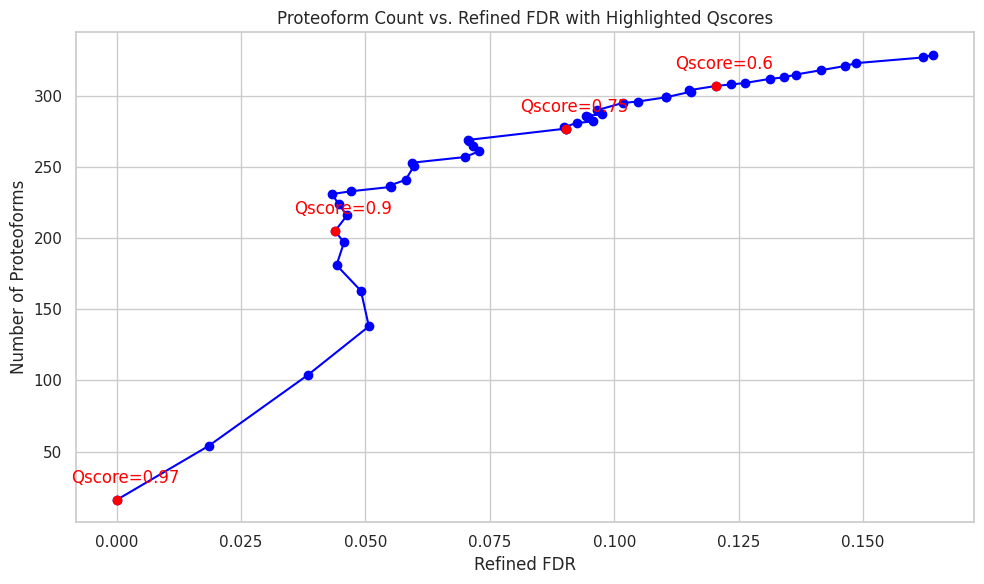

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

# Provided data
data = {
    'Qscore': [0.50, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.60,
               0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.70, 0.71, 0.72,
               0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.80, 0.81, 0.82, 0.83, 0.84,
               0.85, 0.86, 0.87, 0.88, 0.89, 0.90, 0.91, 0.92, 0.93, 0.94, 0.95,
               0.96, 0.97],
    'Total': [329, 327, 323, 321, 318, 315, 313, 312, 309, 308, 307, 304, 303, 299,
              299, 296, 295, 290, 287, 286, 285, 282, 281, 278, 277, 277, 269, 268,
              265, 261, 257, 253, 251, 241, 237, 236, 233, 231, 224, 216, 205, 197,
              181, 163, 138, 104, 54, 16],
    'FDR': [0.1641, 0.1621, 0.1486, 0.1464, 0.1415, 0.1365, 0.1342, 0.1314, 0.1262,
            0.1234, 0.1205, 0.1151, 0.1155, 0.1104, 0.1104, 0.1047, 0.1017, 0.0966,
            0.0976, 0.0944, 0.0947, 0.0957, 0.0925, 0.0899, 0.0903, 0.0903, 0.0706,
            0.0709, 0.0717, 0.0728, 0.0700, 0.0593, 0.0598, 0.0581, 0.0549, 0.0551,
            0.0472, 0.0433, 0.0446, 0.0463, 0.0439, 0.0457, 0.0442, 0.0491, 0.0507,
            0.0385, 0.0185, 0.0000]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(df['FDR'], df['Total'], marker='o', linestyle='-', color='blue')

# Highlight specific Qscores
highlight_qscores = [0.60, 0.75, 0.90, 0.97]
highlight_points = df[df['Qscore'].isin(highlight_qscores)]
ax.scatter(highlight_points['FDR'], highlight_points['Total'], color='red', zorder=5)

# Annotate each point
for _, row in highlight_points.iterrows():
    ax.annotate(f"Qscore={row['Qscore']}", (row['FDR'], row['Total']),
                textcoords="offset points", xytext=(6, 12), ha='center', color='red')

# Labels and title
ax.set_xlabel("Refined FDR")
ax.set_ylabel("Number of Proteoforms")
ax.set_title("Proteoform Count vs. Refined FDR with Highlighted Qscores")

plt.grid(True)
plt.tight_layout()
plt.show()


TDA FDR: 0.0395
Refined FDR: 0.0858


<ipython-input-27-c4ccd9f94d18>:65: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=summary_counts, x="FDR Method", y="Count", hue="ModType", palette=["green", "orange", "red"])


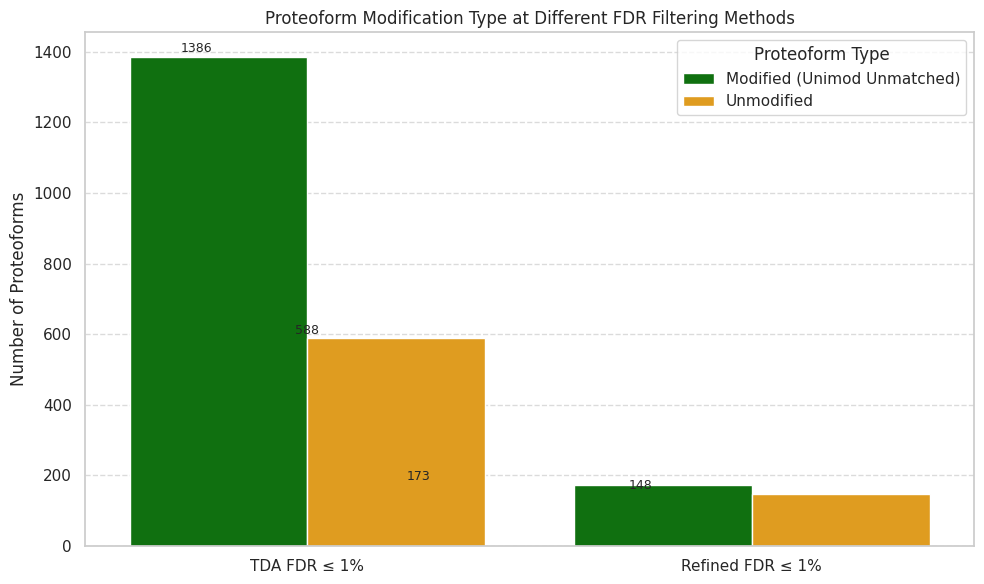

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 precursor info
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC result

# ✅ Match TopPIC with precursor info
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Extract delta mass (modification indicator)
def extract_mass(value):
    if pd.isna(value) or value == "0" or value == "":
        return np.nan
    match = re.search(r'[-+]?\d*\.\d+|\d+', str(value))
    return float(match.group()) if match else np.nan

matched["DeltaMass"] = matched["unexpected modifications"].apply(extract_mass)

# ✅ Classify modification types
def classify_mod_type(row):
    if pd.isna(row["DeltaMass"]):
        return "Unmodified"
    elif "UNIMOD" in str(row["unexpected modifications"]):
        return "Modified (Unimod Matched)"
    else:
        return "Modified (Unimod Unmatched)"

matched["ModType"] = matched.apply(classify_mod_type, axis=1)

# ✅ TDA FDR
tda_targets = matched[~matched["Protein accession"].str.contains("DECOY", na=False)].shape[0]
tda_decoys = matched[matched["Protein accession"].str.contains("DECOY", na=False)].shape[0]
tda_fdr = (tda_decoys / tda_targets) if tda_targets > 0 else 0

# ✅ Refined FDR (MS1 + MS2)
ms1_fps = matched[matched["TargetDecoyType"] > 0].shape[0]
refined_fdr = (ms1_fps + tda_decoys) / matched.shape[0] if matched.shape[0] > 0 else 0

print(f"TDA FDR: {tda_fdr:.4f}")
print(f"Refined FDR: {refined_fdr:.4f}")

# ✅ Apply 1% FDR filtering
tda_pass = matched[~matched["Protein accession"].str.contains("DECOY", na=False)].copy()
refined_pass = matched[matched["TargetDecoyType"] == 0].copy()

# ✅ Count for each FDR type
def count_modtypes(df, label):
    return pd.DataFrame({
        "FDR Method": label,
        "ModType": df["ModType"].value_counts().index,
        "Count": df["ModType"].value_counts().values
    })

counts_tda = count_modtypes(tda_pass, "TDA FDR ≤ 1%")
counts_refined = count_modtypes(refined_pass, "Refined FDR ≤ 1%")
summary_counts = pd.concat([counts_tda, counts_refined], ignore_index=True)

# ✅ Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=summary_counts, x="FDR Method", y="Count", hue="ModType", palette=["green", "orange", "red"])

# Add annotations
for i, row in summary_counts.iterrows():
    plt.text(
        x=i // 3 + (-0.25 + 0.25 * (i % 3)),
        y=row["Count"] + 5,
        s=str(row["Count"]),
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.title("Proteoform Modification Type at Different FDR Filtering Methods")
plt.ylabel("Number of Proteoforms")
plt.xlabel("")
plt.legend(title="Proteoform Type")
plt.tight_layout()
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()


🔹 Qscore: 0.50 | MS1 FPs: 41 | MS2 FPs: 0 | Total: 320 | FDR: 0.1281
🔹 Qscore: 0.51 | MS1 FPs: 40 | MS2 FPs: 0 | Total: 318 | FDR: 0.1258
🔹 Qscore: 0.52 | MS1 FPs: 37 | MS2 FPs: 0 | Total: 315 | FDR: 0.1175
🔹 Qscore: 0.53 | MS1 FPs: 36 | MS2 FPs: 0 | Total: 313 | FDR: 0.1150
🔹 Qscore: 0.54 | MS1 FPs: 34 | MS2 FPs: 0 | Total: 310 | FDR: 0.1097
🔹 Qscore: 0.55 | MS1 FPs: 32 | MS2 FPs: 0 | Total: 307 | FDR: 0.1042
🔹 Qscore: 0.56 | MS1 FPs: 31 | MS2 FPs: 0 | Total: 305 | FDR: 0.1016
🔹 Qscore: 0.57 | MS1 FPs: 30 | MS2 FPs: 0 | Total: 304 | FDR: 0.0987
🔹 Qscore: 0.58 | MS1 FPs: 28 | MS2 FPs: 0 | Total: 301 | FDR: 0.0930
🔹 Qscore: 0.59 | MS1 FPs: 27 | MS2 FPs: 0 | Total: 300 | FDR: 0.0900
🔹 Qscore: 0.60 | MS1 FPs: 26 | MS2 FPs: 0 | Total: 299 | FDR: 0.0870
🔹 Qscore: 0.61 | MS1 FPs: 24 | MS2 FPs: 0 | Total: 296 | FDR: 0.0811
🔹 Qscore: 0.62 | MS1 FPs: 24 | MS2 FPs: 0 | Total: 295 | FDR: 0.0814
🔹 Qscore: 0.63 | MS1 FPs: 22 | MS2 FPs: 0 | Total: 291 | FDR: 0.0756
🔹 Qscore: 0.64 | MS1 FPs: 22 | MS2

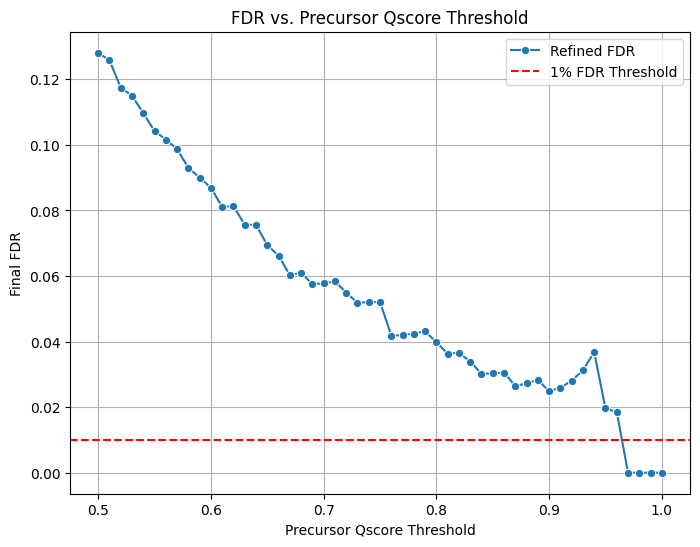

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ✅ Step 1: Load MS2 & TopPIC Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched precursors with Qscore
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC output

# ✅ Step 2: Match TopPIC Identifications with Precursor Info
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Remove TopPIC decoys (Only keep non-decoy proteins)
matched_toppic = matched_toppic[~matched_toppic["Protein accession"].str.contains("DECOY", na=False)]

# ✅ Step 3: Initialize Variables
qscore_thresholds = np.arange(0.5, 1.01, 0.01)  # Range of Qscores from 0.5 to 1.0
fdr_values = []
optimal_qscore = None

# ✅ Step 4: Iterate Over Qscore Thresholds
for qscore_threshold in qscore_thresholds:
    # Apply Qscore Filtering
    filtered_toppic = matched_toppic[matched_toppic["PrecursorQscore"] >= qscore_threshold]

    # Compute MS1 and MS2 False Positives (FPs)
    ms1_fps = filtered_toppic[filtered_toppic["TargetDecoyType"] > 0].shape[0]  # Decoy Precursors
    ms2_fps = filtered_toppic[filtered_toppic["Protein accession"].str.contains("DECOY", na=False)].shape[0]  # TopPIC Decoys

    # Compute Final FDR
    total_filtered = filtered_toppic.shape[0]
    fdr = (ms1_fps + ms2_fps) / total_filtered if total_filtered > 0 else 0
    fdr_values.append(fdr)

    print(f"🔹 Qscore: {qscore_threshold:.2f} | MS1 FPs: {ms1_fps} | MS2 FPs: {ms2_fps} | Total: {total_filtered} | FDR: {fdr:.4f}")

    # Identify the first Qscore where FDR <= 0.01
    if fdr <= 0.01 and optimal_qscore is None:
        optimal_qscore = qscore_threshold

# ✅ Step 5: Apply Final Filtering Based on Identified Qscore Threshold
if optimal_qscore:
    filtered_high_conf = matched_toppic[matched_toppic["PrecursorQscore"] >= optimal_qscore]  # FDR < 0.01
    filtered_low_conf = matched_toppic[matched_toppic["PrecursorQscore"] < optimal_qscore]   # FDR > 0.01

    # Save filtered datasets
    filtered_high_conf.to_csv("LowFiltered_TopPIC_RefinedFDR_Low.tsv", sep="\t", index=False)  # FDR < 0.01
    filtered_low_conf.to_csv("HighFiltered_TopPIC_RefinedFDR_High.tsv", sep="\t", index=False)  # FDR > 0.01

    print(f"✅ Optimal Qscore Found at {optimal_qscore:.2f} for FDR < 0.01")
    print("✅ Saved High and Low Confidence Filtered Data.")

# ✅ Step 6: Plot FDR Trends
plt.figure(figsize=(8, 6))
sns.lineplot(x=qscore_thresholds[:len(fdr_values)], y=fdr_values, marker="o", label="Refined FDR")

# Highlight 1% FDR cutoff
plt.axhline(y=0.01, color="red", linestyle="--", label="1% FDR Threshold")

plt.xlabel("Precursor Qscore Threshold")
plt.ylabel("Final FDR")
plt.title("FDR vs. Precursor Qscore Threshold")
plt.legend()
plt.grid(True)
plt.show()


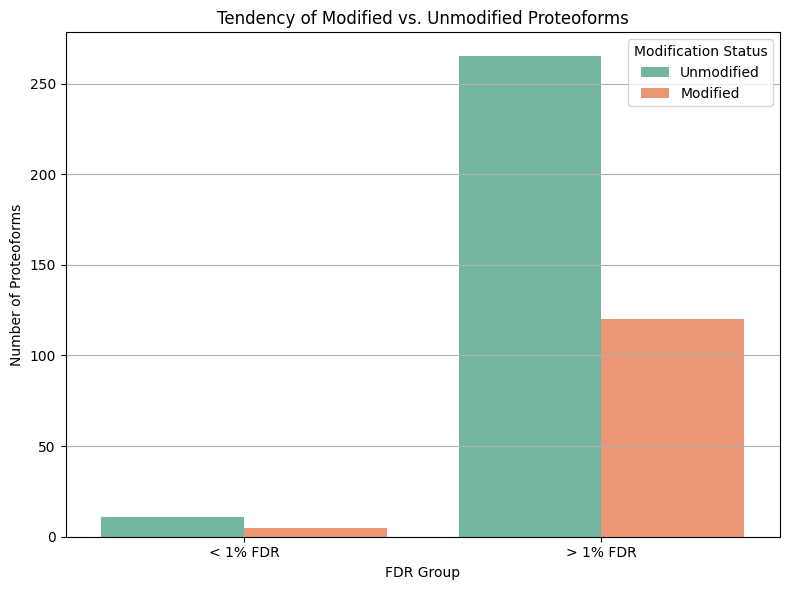

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pyopenms import ModificationsDB

# ✅ Load the filtered datasets
df_low_fdr = pd.read_csv("LowFiltered_TopPIC_RefinedFDR_Low.tsv", sep="\t")
df_high_fdr = pd.read_csv("HighFiltered_TopPIC_RefinedFDR_High.tsv", sep="\t")

# ✅ Step 1: Extract delta masses from "unexpected modifications"
def extract_delta_masses_and_labels(df):
    delta_masses = []
    labels = []
    df["unexpected modifications"] = df["unexpected modifications"].astype(str)
    for entry in df["unexpected modifications"]:
        if entry != "0" and entry not in ["-", "None", "nan", "NaN", ""]:
            try:
                delta_mass = float(entry.split(":")[0].strip())
                if -150 <= delta_mass <= 150:
                    delta_masses.append(delta_mass)
                    labels.append("Modified")
                else:
                    labels.append("Unmodified")
            except ValueError:
                labels.append("Unmodified")
        else:
            labels.append("Unmodified")
    return np.array(delta_masses), labels

# Extract delta masses and labels for both datasets
delta_masses_low, labels_low = extract_delta_masses_and_labels(df_low_fdr)
delta_masses_high, labels_high = extract_delta_masses_and_labels(df_high_fdr)

# ✅ Step 2: Count Modified and Unmodified Proteoforms
from collections import Counter

count_low = Counter(labels_low)
count_high = Counter(labels_high)

# Fill in missing categories if not present
count_low.setdefault("Modified", 0)
count_low.setdefault("Unmodified", 0)
count_high.setdefault("Modified", 0)
count_high.setdefault("Unmodified", 0)

# ✅ Step 3: Create DataFrame for Visualization
plot_data = pd.DataFrame({
    "FDR Group": ["< 1% FDR"] * 2 + ["> 1% FDR"] * 2,
    "Modification Status": ["Unmodified", "Modified"] * 2,
    "Count": [count_low["Unmodified"], count_low["Modified"],
              count_high["Unmodified"], count_high["Modified"]]
})

# ✅ Step 4: Plot the Results
plt.figure(figsize=(8, 6))
sns.barplot(data=plot_data, x="FDR Group", y="Count", hue="Modification Status", palette="Set2")
plt.title("Tendency of Modified vs. Unmodified Proteoforms")
plt.ylabel("Number of Proteoforms")
plt.xlabel("FDR Group")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


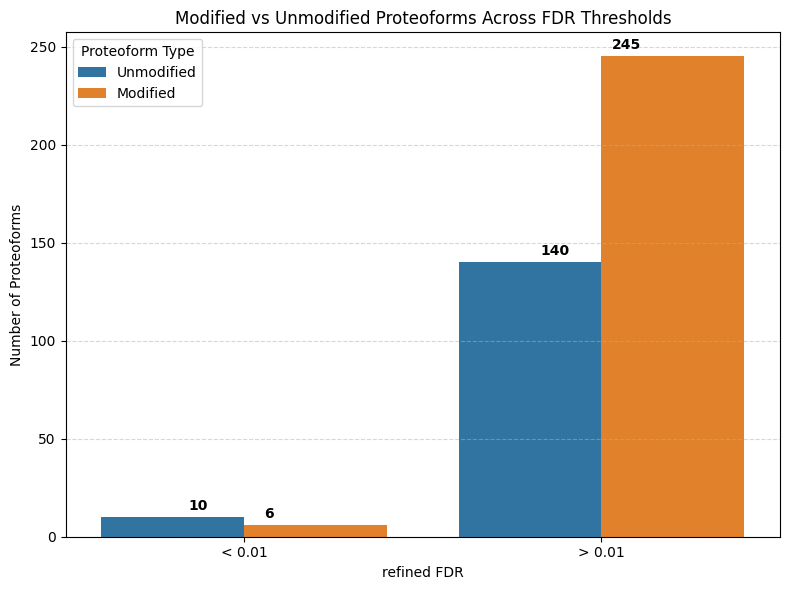

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ✅ Load the filtered datasets (Ensure these paths are correct)
file_low_fdr = "LowFiltered_TopPIC_RefinedFDR_Low.tsv"  # FDR < 0.01
file_high_fdr = "HighFiltered_TopPIC_RefinedFDR_High.tsv"  # FDR > 0.01

df_low = pd.read_csv(file_low_fdr, sep="\t")
df_high = pd.read_csv(file_high_fdr, sep="\t")

# ✅ Helper function to classify proteoforms
def classify_modifications(df):
    df["unexpected modifications"] = df["unexpected modifications"].astype(str)
    return df["unexpected modifications"].apply(
        lambda x: "Unmodified" if x in ["0", "-", "None", "nan", "NaN", ""] else "Modified"
    )

df_low["ModificationStatus"] = classify_modifications(df_low)
df_high["ModificationStatus"] = classify_modifications(df_high)

# ✅ Count modified/unmodified in each FDR group
count_low = df_low["ModificationStatus"].value_counts().rename_axis("ModificationStatus").reset_index(name="Count")
count_low["FDR"] = "< 0.01"

count_high = df_high["ModificationStatus"].value_counts().rename_axis("ModificationStatus").reset_index(name="Count")
count_high["FDR"] = "> 0.01"

# ✅ Combine for visualization
plot_df = pd.concat([count_low, count_high], ignore_index=True)

# ✅ Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=plot_df, x="FDR", y="Count", hue="ModificationStatus")

# Add numbers on each bar
for i in range(len(plot_df)):
    row = plot_df.iloc[i]
    plt.text(
        x=i // 2 + (-0.13 if row["ModificationStatus"] == "Unmodified" else 0.07),
        y=row["Count"] + 2,
        s=f"{row['Count']}",
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

plt.title("Modified vs Unmodified Proteoforms Across FDR Thresholds")
plt.ylabel("Number of Proteoforms")
plt.xlabel("refined FDR")
plt.legend(title="Proteoform Type")
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.show()


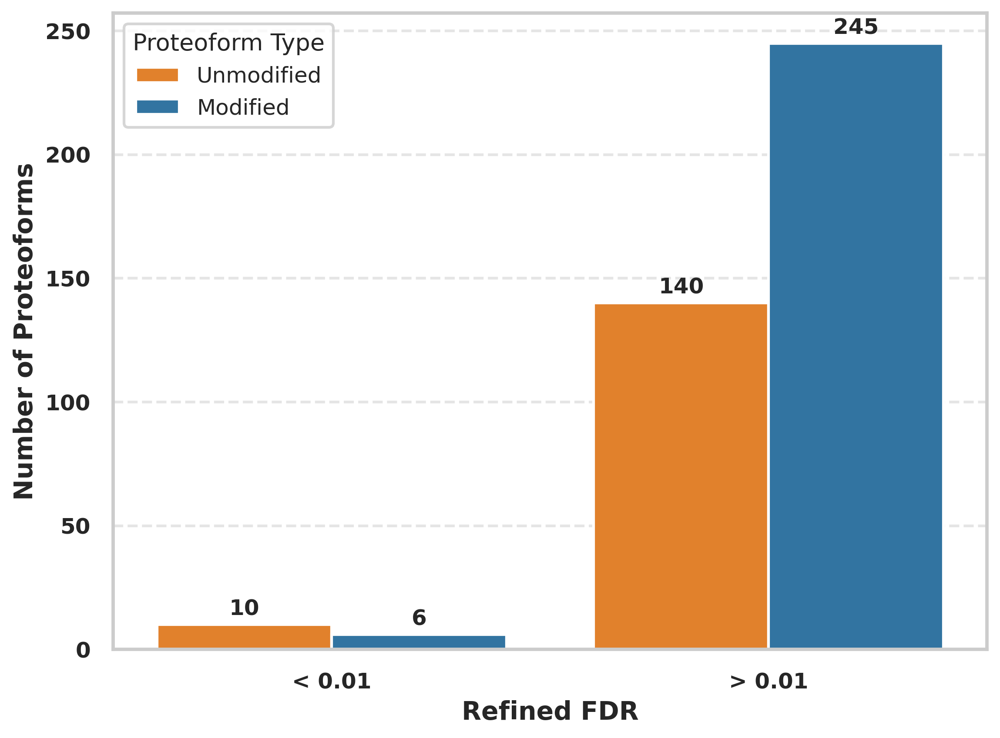

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the filtered datasets
file_low_fdr = "LowFiltered_TopPIC_RefinedFDR_Low.tsv"
file_high_fdr = "HighFiltered_TopPIC_RefinedFDR_High.tsv"

df_low = pd.read_csv(file_low_fdr, sep="\t")
df_high = pd.read_csv(file_high_fdr, sep="\t")

# Classify proteoforms
def classify_modifications(df):
    df["unexpected modifications"] = df["unexpected modifications"].astype(str)
    return df["unexpected modifications"].apply(
        lambda x: "Unmodified" if x.strip() in ["0", "-", "None", "nan", "NaN", ""] else "Modified"
    )

df_low["ModificationStatus"] = classify_modifications(df_low)
df_high["ModificationStatus"] = classify_modifications(df_high)

# Count and label
count_low = df_low["ModificationStatus"].value_counts().rename_axis("ModificationStatus").reset_index(name="Count")
count_low["FDR"] = "< 0.01"

count_high = df_high["ModificationStatus"].value_counts().rename_axis("ModificationStatus").reset_index(name="Count")
count_high["FDR"] = "> 0.01"

plot_df = pd.concat([count_low, count_high], ignore_index=True)

# Plotting
plt.figure(figsize=(8, 6), dpi=300)
sns.set_style("whitegrid")
sns.set_context("talk")

palette = {"Modified": "#1f77b4", "Unmodified": "#ff7f0e"}
bar_plot = sns.barplot(data=plot_df, x="FDR", y="Count", hue="ModificationStatus", palette=palette)

# Annotate bars
for p in bar_plot.patches:
    height = p.get_height()
    if height == 0:
        continue  # ⛔ Skip zero-height bars
    bar_plot.annotate(
        f'{int(height)}',
        (p.get_x() + p.get_width() / 2., height + 2),
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )


# Styling
#plt.title("Modified vs Unmodified Proteoforms Across FDR Thresholds", fontsize=16, fontweight='bold')
plt.ylabel("Number of Proteoforms", fontsize=14, fontweight='bold')
plt.xlabel("Refined FDR", fontsize=14, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.legend(title="Proteoform Type", fontsize=12, title_fontsize=13)
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.5)

# Optional: Save as publication-quality file
# plt.savefig("mod_vs_unmod_fdr.svg", format="svg")  # or "png"

plt.show()


In [3]:
pip install pyopenms

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 MB 2.7 MB/s eta 0:00:00


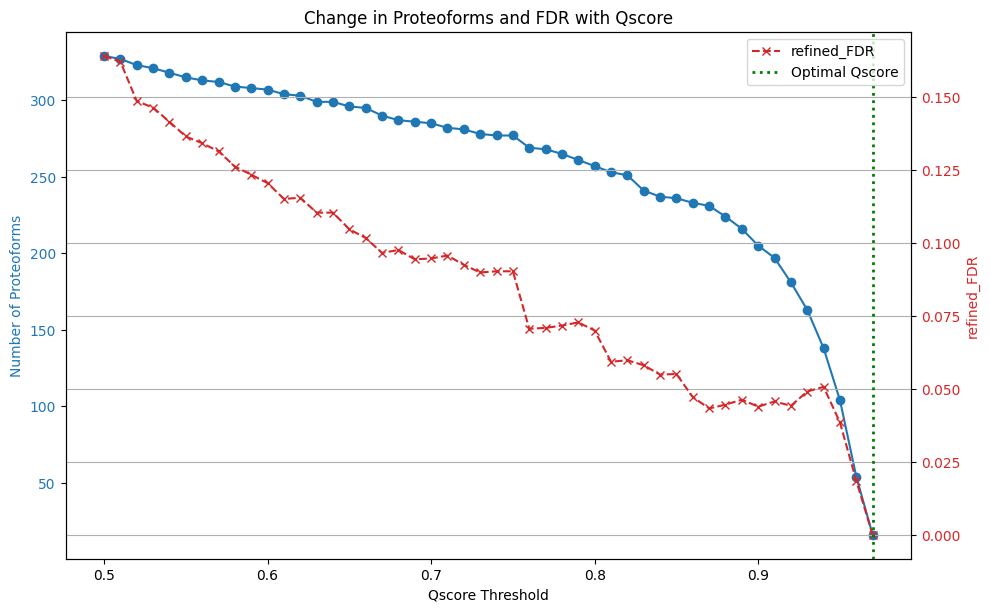

In [10]:
import matplotlib.pyplot as plt
import pandas as pd

# Your data as a dictionary or import from CSV
data = {
    "Qscore": [round(0.50 + 0.01 * i, 2) for i in range(48)],
    "Total": [329, 327, 323, 321, 318, 315, 313, 312, 309, 308, 307, 304, 303, 299, 299, 296, 295, 290, 287, 286, 285, 282, 281, 278, 277, 277, 269, 268, 265, 261, 257, 253, 251, 241, 237, 236, 233, 231, 224, 216, 205, 197, 181, 163, 138, 104, 54, 16],
    "FDR": [0.1641, 0.1621, 0.1486, 0.1464, 0.1415, 0.1365, 0.1342, 0.1314, 0.1262, 0.1234, 0.1205, 0.1151, 0.1155, 0.1104, 0.1104, 0.1047, 0.1017, 0.0966, 0.0976, 0.0944, 0.0947, 0.0957, 0.0925, 0.0899, 0.0903, 0.0903, 0.0706, 0.0709, 0.0717, 0.0728, 0.0700, 0.0593, 0.0598, 0.0581, 0.0549, 0.0551, 0.0472, 0.0433, 0.0446, 0.0463, 0.0439, 0.0457, 0.0442, 0.0491, 0.0507, 0.0385, 0.0185, 0.0000]
}

df = pd.DataFrame(data)

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Line plot for Total Proteoforms
color = 'tab:blue'
ax1.set_xlabel('Qscore Threshold')
ax1.set_ylabel('Number of Proteoforms', color=color)
ax1.plot(df['Qscore'], df['Total'], color=color, marker='o', label='Proteoforms')
ax1.tick_params(axis='y', labelcolor=color)

# Twin axis for FDR
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('refined_FDR', color=color)
ax2.plot(df['Qscore'], df['FDR'], color=color, marker='x', linestyle='--', label='refined_FDR')
ax2.tick_params(axis='y', labelcolor=color)

# Optional vertical line at optimal Qscore
plt.axvline(x=0.97, color='green', linestyle=':', linewidth=2, label='Optimal Qscore')

fig.tight_layout()
plt.title("Change in Proteoforms and FDR with Qscore")
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


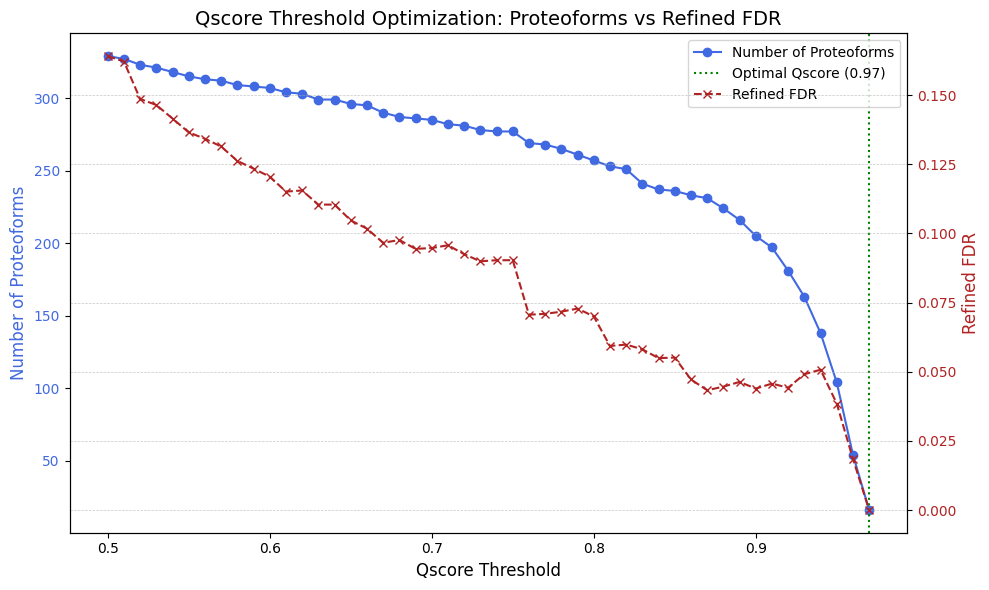

In [11]:
import matplotlib.pyplot as plt

# Example data (replace with your actual arrays if needed)
qscore = [0.50, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59,
          0.60, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69,
          0.70, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79,
          0.80, 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89,
          0.90, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97]

proteoforms = [329, 327, 323, 321, 318, 315, 313, 312, 309, 308,
               307, 304, 303, 299, 299, 296, 295, 290, 287, 286,
               285, 282, 281, 278, 277, 277, 269, 268, 265, 261,
               257, 253, 251, 241, 237, 236, 233, 231, 224, 216,
               205, 197, 181, 163, 138, 104, 54, 16]

refined_fdr = [0.1641, 0.1621, 0.1486, 0.1464, 0.1415, 0.1365, 0.1342, 0.1314, 0.1262, 0.1234,
               0.1205, 0.1151, 0.1155, 0.1104, 0.1104, 0.1047, 0.1017, 0.0966, 0.0976, 0.0944,
               0.0947, 0.0957, 0.0925, 0.0899, 0.0903, 0.0903, 0.0706, 0.0709, 0.0717, 0.0728,
               0.0700, 0.0593, 0.0598, 0.0581, 0.0549, 0.0551, 0.0472, 0.0433, 0.0446, 0.0463,
               0.0439, 0.0457, 0.0442, 0.0491, 0.0507, 0.0385, 0.0185, 0.0000]

# Optimal threshold (last nonzero FDR or manually define it)
optimal_idx = refined_fdr.index(min(refined_fdr))
optimal_qscore = qscore[optimal_idx]

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Proteoforms on left y-axis
ax1.plot(qscore, proteoforms, 'o-', color='royalblue', label='Number of Proteoforms')
ax1.set_xlabel('Qscore Threshold', fontsize=12)
ax1.set_ylabel('Number of Proteoforms', fontsize=12, color='royalblue')
ax1.tick_params(axis='y', labelcolor='royalblue')

# Refined FDR on right y-axis
ax2 = ax1.twinx()
ax2.plot(qscore, refined_fdr, 'x--', color='firebrick', label='Refined FDR')
ax2.set_ylabel('Refined FDR', fontsize=12, color='firebrick')
ax2.tick_params(axis='y', labelcolor='firebrick')

# Vertical line at optimal point
ax1.axvline(optimal_qscore, linestyle=':', color='green', label=f'Optimal Qscore ({optimal_qscore:.2f})')

# Title and legend
plt.title('Qscore Threshold Optimization: Proteoforms vs Refined FDR', fontsize=14)
fig.tight_layout()

# Combined legend from both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()


In [12]:
pip install matplotlib matplotlib-venn


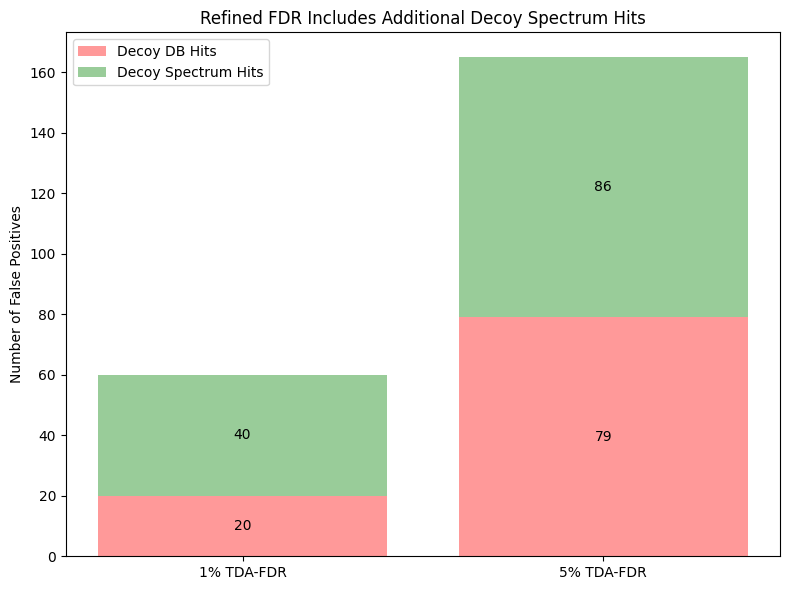

In [14]:
import matplotlib.pyplot as plt

labels = ['1% TDA-FDR', '5% TDA-FDR']
decoy_db = [20, 79]
decoy_spectra = [40, 86]

x = range(len(labels))

fig, ax = plt.subplots(figsize=(8, 6))

# Bar plots
ax.bar(x, decoy_db, label='Decoy DB Hits', color='#ff9999')
ax.bar(x, decoy_spectra, bottom=decoy_db, label='Decoy Spectrum Hits', color='#99cc99')

# Labels
for i in x:
    ax.text(i, decoy_db[i] / 2, str(decoy_db[i]), ha='center', va='center', color='black')
    ax.text(i, decoy_db[i] + decoy_spectra[i] / 2, str(decoy_spectra[i]), ha='center', va='center', color='black')

ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylabel('Number of False Positives')
ax.set_title('Refined FDR Includes Additional Decoy Spectrum Hits')
ax.legend()

plt.tight_layout()
plt.show()


In [16]:
import pandas as pd

# ✅ Step 1: Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched precursors
toppic_data = pd.read_csv("/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv", sep="\t", skiprows=26)  # TopPIC output

# ✅ Step 2: Match TopPIC Identifications with Precursor Info
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Step 3: Apply Qscore Filtering
qscore_threshold = 0.85  # Set the threshold
filtered_toppic = matched_toppic[matched_toppic["PrecursorQscore"] >= qscore_threshold]

# ✅ Step 4: Compute MS1 False Positives (FPs)
ms1_fps = filtered_toppic[filtered_toppic["TargetDecoyType"] > 0].shape[0]  # Decoy Precursors

# ✅ Step 5: Compute MS2 False Positives (FPs)
ms2_fps = filtered_toppic[filtered_toppic["Protein accession"].str.contains("DECOY", na=False)].shape[0]  # Decoy Identifications in TopPIC

# ✅ Step 6: Compute Final FDR
final_fdr = (ms1_fps + ms2_fps) / filtered_toppic.shape[0] if filtered_toppic.shape[0] > 0 else 0

# ✅ Print Results
print(f"✅ MS1 FPs: {ms1_fps}")
print(f"✅ MS2 FPs: {ms2_fps}")
print(f"✅ Total Filtered Identifications: {filtered_toppic.shape[0]}")
print(f"✅ Final FDR: {final_fdr:.4f} ({final_fdr * 100:.2f}%)")

# ✅ Save Final Filtered TopPIC Data
filtered_toppic.to_csv("Filtered_TopPIC.tsv", sep="\t", index=False)
print("✅ Saved Filtered TopPIC Data.")

✅ MS1 FPs: 11
✅ MS2 FPs: 12
✅ Total Filtered Identifications: 277
✅ Final FDR: 0.0830 (8.30%)
✅ Saved Filtered TopPIC Data.


🔹 Total TopPIC Identifications: 2953
🔸 Decoy DB Hits (MS2-level FPs): 244
🔸 Decoy Spectrum Hits (MS1-level FPs): 194
✅ TDA FDR (MS2-only): 0.0901 (9.01%)
✅ Refined FDR (MS1 + MS2): 0.1483 (14.83%)


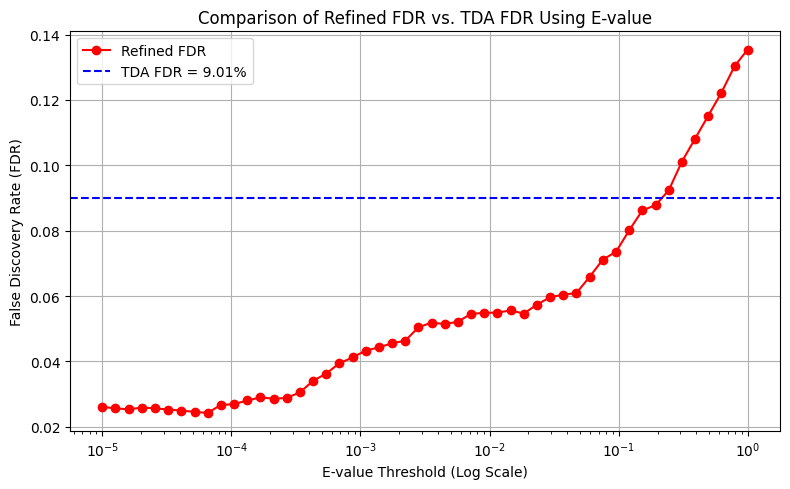

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ✅ Load Data
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # Precursor info
toppic_data = pd.read_csv("/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv", sep="\t", skiprows=26)  # TopPIC results

# ✅ Match TopPIC Identifications with Precursor Info
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# ✅ Report: Total TopPIC identifications
total_ids = matched_toppic.shape[0]
print(f"🔹 Total TopPIC Identifications: {total_ids}")

# ✅ Count decoy DB hits (from TopPIC)
decoy_db_hits = matched_toppic[matched_toppic["Protein accession"].str.contains("DECOY", na=False)].shape[0]
print(f"🔸 Decoy DB Hits (MS2-level FPs): {decoy_db_hits}")

# ✅ Count decoy spectrum hits (from precursor matching)
decoy_spectrum_hits = matched_toppic[matched_toppic["TargetDecoyType"] > 0].shape[0]
print(f"🔸 Decoy Spectrum Hits (MS1-level FPs): {decoy_spectrum_hits}")

# ✅ Compute TDA FDR (MS2 only)
total_targets_tda = matched_toppic[~matched_toppic["Protein accession"].str.contains("DECOY", na=False)].shape[0]
fdr_tda = decoy_db_hits / total_targets_tda if total_targets_tda > 0 else 0
print(f"✅ TDA FDR (MS2-only): {fdr_tda:.4f} ({fdr_tda * 100:.2f}%)")

# ✅ Compute Refined FDR (MS1 + MS2)
total_matched = matched_toppic.shape[0]
refined_fdr_total = (decoy_db_hits + decoy_spectrum_hits) / total_matched if total_matched > 0 else 0
print(f"✅ Refined FDR (MS1 + MS2): {refined_fdr_total:.4f} ({refined_fdr_total * 100:.2f}%)")

# ✅ Iterate Over E-value Thresholds
evalue_thresholds = np.logspace(-5, 0, num=50)
refined_fdr_values = []
tda_fdr_values = []

for evalue in evalue_thresholds:
    filtered = matched_toppic[matched_toppic["E-value"] <= evalue]

    ms2_fps = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]
    ms1_fps = filtered[filtered["TargetDecoyType"] > 0].shape[0]
    total_filtered = filtered.shape[0]

    refined_fdr = (ms1_fps + ms2_fps) / total_filtered if total_filtered > 0 else 0
    refined_fdr_values.append(refined_fdr)
    tda_fdr_values.append(fdr_tda)  # static line for comparison

# ✅ Plot Comparison
plt.figure(figsize=(8, 5))
plt.plot(evalue_thresholds, refined_fdr_values, marker="o", linestyle="-", color="red", label="Refined FDR")
plt.axhline(y=fdr_tda, color="blue", linestyle="--", label=f"TDA FDR = {fdr_tda:.2%}")
plt.xscale("log")
plt.xlabel("E-value Threshold (Log Scale)")
plt.ylabel("False Discovery Rate (FDR)")
plt.title("Comparison of Refined FDR vs. TDA FDR Using E-value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


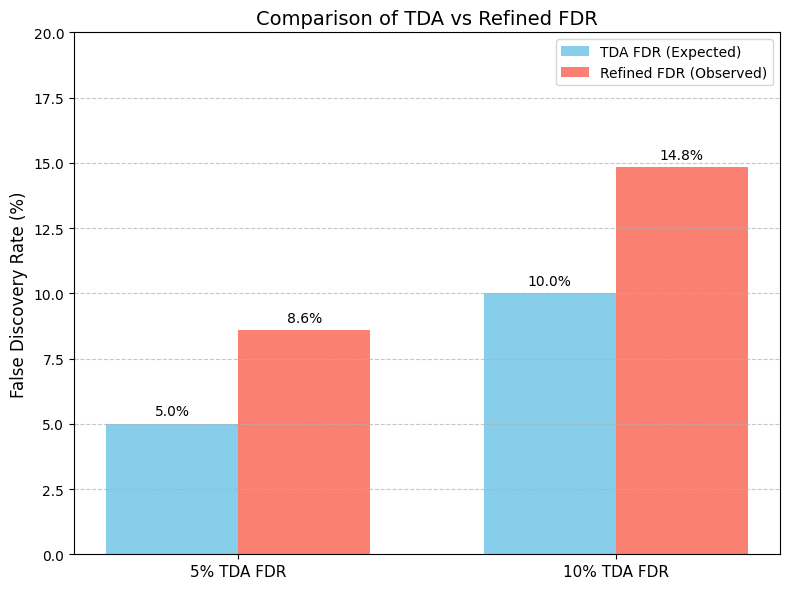

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Data
tda_thresholds = ["5% TDA FDR", "10% TDA FDR"]
tda_fdr = [5.00, 10.00]            # Intended thresholds
refined_fdr = [8.58, 14.83]        # Measured refined FDRs

x = np.arange(len(tda_thresholds))
width = 0.35

# Plot
fig, ax = plt.subplots(figsize=(8, 6))
bars1 = ax.bar(x - width/2, tda_fdr, width, label='TDA FDR (Expected)', color='skyblue')
bars2 = ax.bar(x + width/2, refined_fdr, width, label='Refined FDR (Observed)', color='salmon')

# Add labels above bars
for bar in bars1 + bars2:
    height = bar.get_height()
    ax.annotate(f'{height:.1f}%',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 4),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10)

# Styling
ax.set_ylabel('False Discovery Rate (%)', fontsize=12)
ax.set_title('Comparison of TDA vs Refined FDR', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(tda_thresholds, fontsize=11)
ax.legend()
ax.set_ylim(0, 20)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


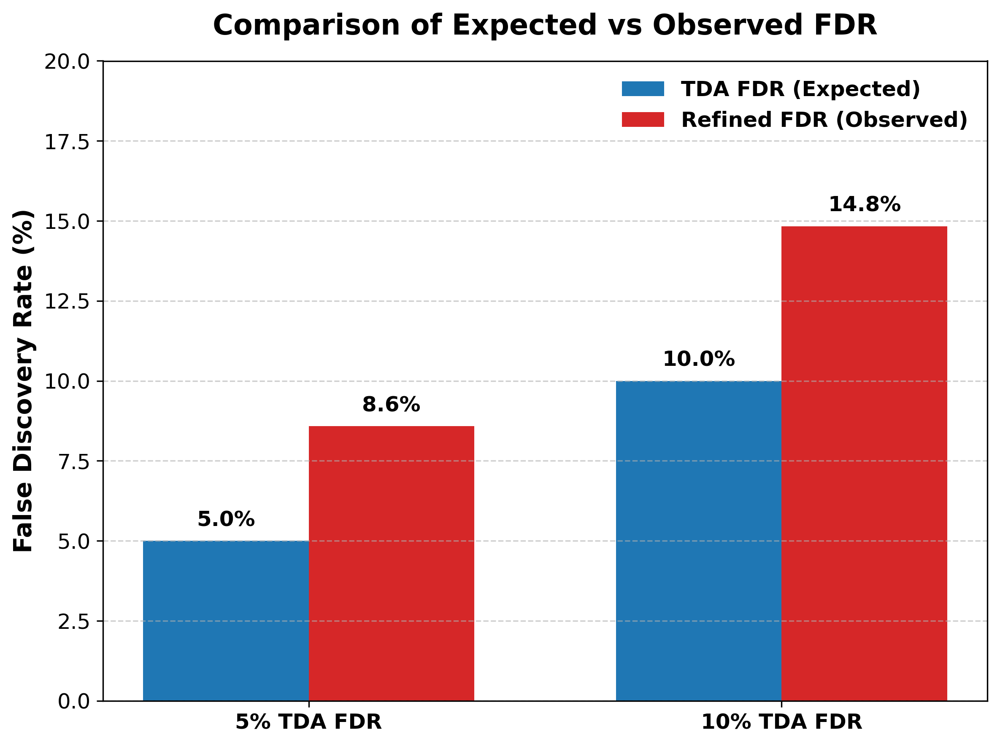

In [38]:
import matplotlib.pyplot as plt
import numpy as np

# Data
tda_thresholds = ["5% TDA FDR", "10% TDA FDR"]
tda_fdr = [5.00, 10.00]           # Expected FDR
refined_fdr = [8.58, 14.83]       # Observed refined FDR

x = np.arange(len(tda_thresholds))
width = 0.35

# Plot
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

# Bars
bars1 = ax.bar(x - width/2, tda_fdr, width, label='TDA FDR (Expected)', color='#1f77b4')
bars2 = ax.bar(x + width/2, refined_fdr, width, label='Refined FDR (Observed)', color='#d62728')

# Labels on bars
for bar in bars1 + bars2:
    height = bar.get_height()
    ax.annotate(f'{height:.1f}%',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 6),
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=12, fontweight='bold', color='black')

# Styling
ax.set_ylabel('False Discovery Rate (%)', fontsize=14, fontweight='bold')
ax.set_title('Comparison of Expected vs Observed FDR', fontsize=16, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(tda_thresholds, fontsize=12, fontweight='bold')
ax.tick_params(axis='y', labelsize=12)
ax.set_ylim(0, 20)
ax.grid(axis='y', linestyle='--', alpha=0.6)

# Legend
legend = ax.legend(fontsize=12, frameon=False)
for text in legend.get_texts():
    text.set_fontweight('bold')

plt.tight_layout()
plt.show()


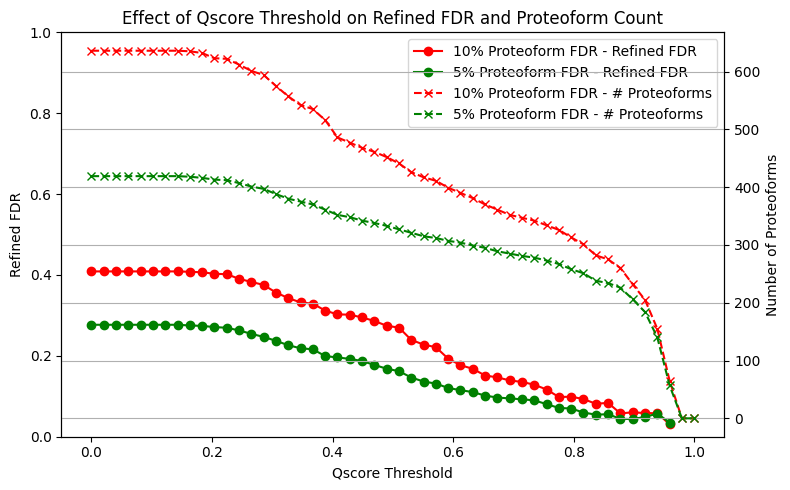

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ✅ Load precursor info with Qscore
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")

# ✅ Define TopPIC files and labels
toppic_files = {
    "10% Proteoform FDR": "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv",
    "5% Proteoform FDR": "/content/spectra_ms2_toppic_proteoform_single.tsv"
}

# ✅ Qscore thresholds to evaluate
qscore_thresholds = np.linspace(0, 1, 50)

# ✅ Prepare plot
fig, ax1 = plt.subplots(figsize=(8, 5))
ax2 = ax1.twinx()

colors = ["red", "green"]

for i, (label, filepath) in enumerate(toppic_files.items()):
    toppic_data = pd.read_csv(filepath, sep="\t", skiprows=26)
    toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)

    # ✅ Merge with Qscore info
    matched = toppic_data.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

    refined_fdr_list = []
    num_proteoforms_list = []

    for qthresh in qscore_thresholds:
        subset = matched[matched["PrecursorQscore"] >= qthresh]

        total = subset.shape[0]
        ms2_fp = subset[subset["Protein accession"].str.contains("DECOY", na=False)].shape[0]
        ms1_fp = subset[subset["TargetDecoyType"] > 0].shape[0]
        refined_fdr = (ms1_fp + ms2_fp) / total if total > 0 else np.nan

        refined_fdr_list.append(refined_fdr)
        num_proteoforms_list.append(total)

    # ✅ Plot Refined FDR (left y-axis)
    ax1.plot(qscore_thresholds, refined_fdr_list, color=colors[i], linestyle='-', marker='o', label=f"{label} - Refined FDR")

    # ✅ Plot Proteoform Count (right y-axis)
    ax2.plot(qscore_thresholds, num_proteoforms_list, color=colors[i], linestyle='--', marker='x', label=f"{label} - # Proteoforms")

# ✅ Labeling
ax1.set_xlabel("Qscore Threshold")
ax1.set_ylabel("Refined FDR", color="black")
ax2.set_ylabel("Number of Proteoforms", color="black")
ax1.set_ylim(0, 1.0)
ax1.set_title("Effect of Qscore Threshold on Refined FDR and Proteoform Count")

# ✅ Legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")

plt.grid(True)
plt.tight_layout()
plt.show()


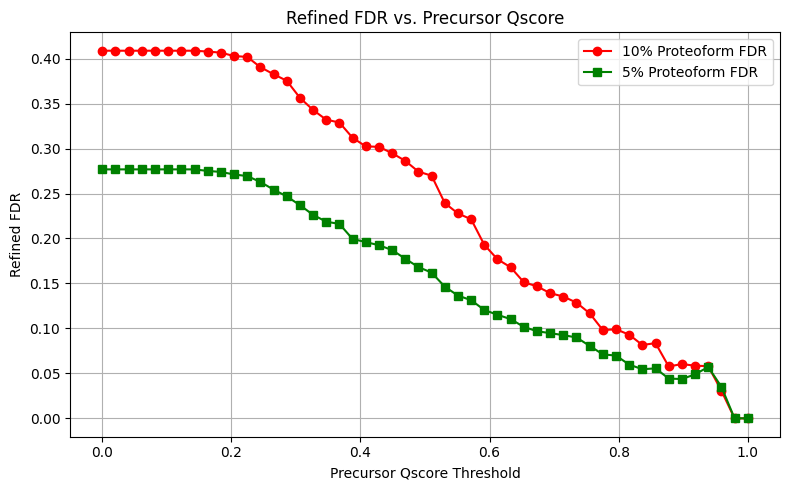

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ✅ Load precursor info
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # Precursor info

# ✅ Load TopPIC result files
toppic_10 = pd.read_csv("/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv", sep="\t", skiprows=26)
toppic_5 = pd.read_csv("/content/spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)

# ✅ Function to compute Refined FDR over Qscore thresholds
def compute_refined_fdr(toppic_data, file_aq, label):
    toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_data.merge(file_aq, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []

    for q in thresholds:
        filtered = merged[merged["PrecursorQscore"] >= q]
        total = filtered.shape[0]
        ms2_fp = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]
        ms1_fp = filtered[filtered["TargetDecoyType"] > 0].shape[0]
        refined_fdr = (ms1_fp + ms2_fp) / total if total > 0 else 0
        refined_fdrs.append(refined_fdr)

    return thresholds, refined_fdrs

# ✅ Compute Refined FDR values for both files
qscore_10, refined_fdr_10 = compute_refined_fdr(toppic_10, file_aq, "10% FDR")
qscore_5, refined_fdr_5 = compute_refined_fdr(toppic_5, file_aq, "5% FDR")

# ✅ Plot
plt.figure(figsize=(8, 5))
plt.plot(qscore_10, refined_fdr_10, label="10% Proteoform FDR", color="red", marker='o')
plt.plot(qscore_5, refined_fdr_5, label="5% Proteoform FDR", color="green", marker='s')
plt.xlabel("Precursor Qscore Threshold")
plt.ylabel("Refined FDR")
plt.title("Refined FDR vs. Precursor Qscore")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


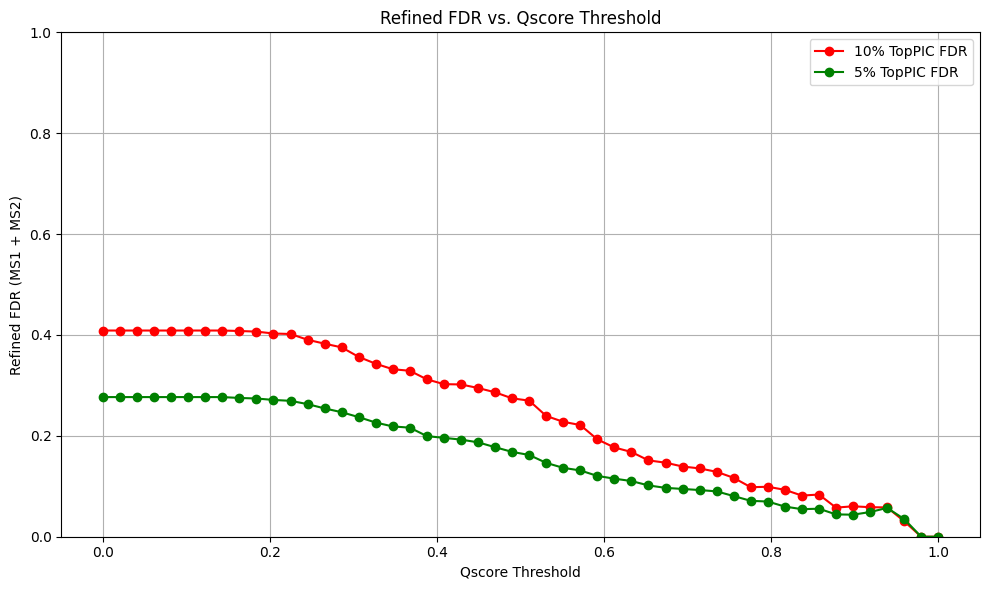

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ✅ Load precursor info with Qscore and TargetDecoyType
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # contains ScanNum_ms2, Qscore, TargetDecoyType

# ✅ Load two TopPIC result files
toppic_file_10 = "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv"
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

df_10 = load_and_merge(toppic_file_10, precursor_info)
df_5 = load_and_merge(toppic_file_5, precursor_info)

# ✅ Function to calculate refined FDR over Qscore thresholds
def calculate_refined_fdr(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = filtered.shape[0]
        if total == 0:
            refined_fdrs.append(0)
            continue

        ms2_fp = filtered[filtered["Protein accession"].str.contains("DECOY", na=False)].shape[0]
        ms1_fp = filtered[filtered["TargetDecoyType"] > 0].shape[0]
        refined_fdr = (ms1_fp + ms2_fp) / total
        refined_fdrs.append(refined_fdr)

    return thresholds, refined_fdrs

# ✅ Calculate refined FDR values for both TopPIC result sets
x_10, y_10 = calculate_refined_fdr(df_10)
x_5, y_5 = calculate_refined_fdr(df_5)

# ✅ Plot results
plt.figure(figsize=(10, 6))
plt.plot(x_10, y_10, 'r-', marker='o', label="10% TopPIC FDR")
plt.plot(x_5, y_5, 'g-', marker='o', label="5% TopPIC FDR")

plt.xlabel("Qscore Threshold")
plt.ylabel("Refined FDR (MS1 + MS2)")
plt.title("Refined FDR vs. Qscore Threshold")
plt.grid(True)
plt.legend()
plt.ylim(0, 1.0)
plt.tight_layout()
plt.show()


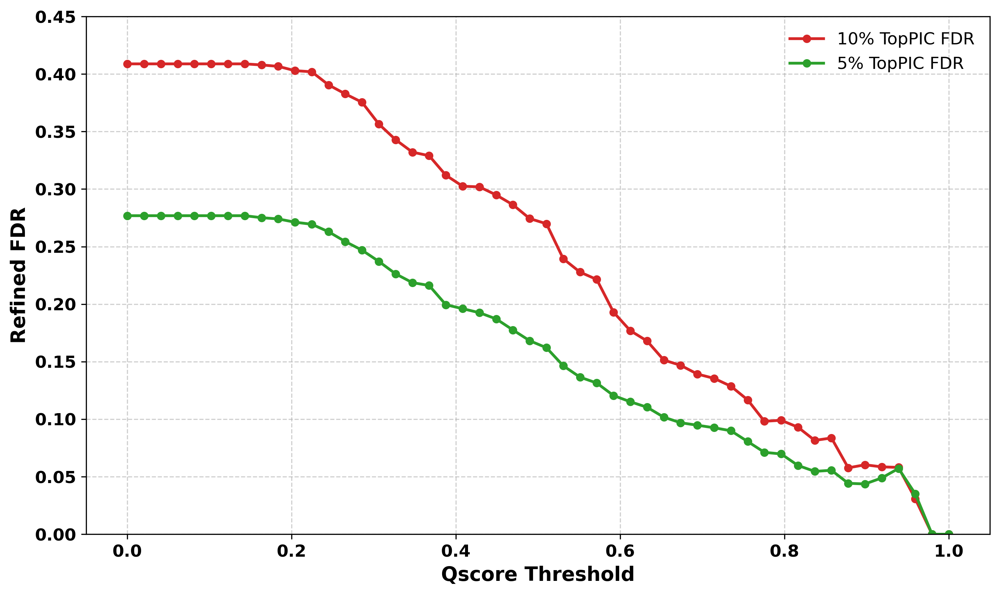

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load precursor info
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Columns: ScanNum_ms2, PrecursorQscore, TargetDecoyType

# TopPIC results
toppic_file_10 = "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv"
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

# Merge
df_10 = load_and_merge(toppic_file_10, precursor_info)
df_5 = load_and_merge(toppic_file_5, precursor_info)

# Refined FDR computation
def calculate_refined_fdr(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        if total == 0:
            refined_fdrs.append(0)
            continue

        ms2_fp = filtered["Protein accession"].str.contains("DECOY", na=False).sum()
        ms1_fp = (filtered["TargetDecoyType"] > 0).sum()
        refined_fdr = (ms1_fp + ms2_fp) / total
        refined_fdrs.append(refined_fdr)

    return thresholds, refined_fdrs

# Calculate
x_10, y_10 = calculate_refined_fdr(df_10)
x_5, y_5 = calculate_refined_fdr(df_5)

# Plotting
plt.figure(figsize=(10, 6), dpi=300)

plt.plot(x_10, y_10, color='#d62728', marker='o', linewidth=2, markersize=5, label="10% TopPIC FDR")
plt.plot(x_5, y_5, color='#2ca02c', marker='o', linewidth=2, markersize=5, label="5% TopPIC FDR")

plt.xlabel("Qscore Threshold", fontsize=14, fontweight='bold')
plt.ylabel("Refined FDR", fontsize=14, fontweight='bold')
#plt.title("Refined FDR vs. Qscore Threshold", fontsize=16, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12, frameon=False)
plt.ylim(0, 0.45)

plt.tight_layout()
plt.show()



Refined FDR Table for 10% TopPIC FDR
Qscore Threshold | Total | Decoys | Refined FDR
---------------------------------------------
0.4               496    135     0.272
0.6               399    66      0.165
0.8               312    26      0.083
0.9               231    13      0.056

Refined FDR Table for 5% TopPIC FDR
Qscore Threshold | Total | Decoys | Refined FDR
---------------------------------------------
0.4               354    65      0.184
0.6               307    34      0.111
0.8               257    16      0.062
0.9               205    9       0.044


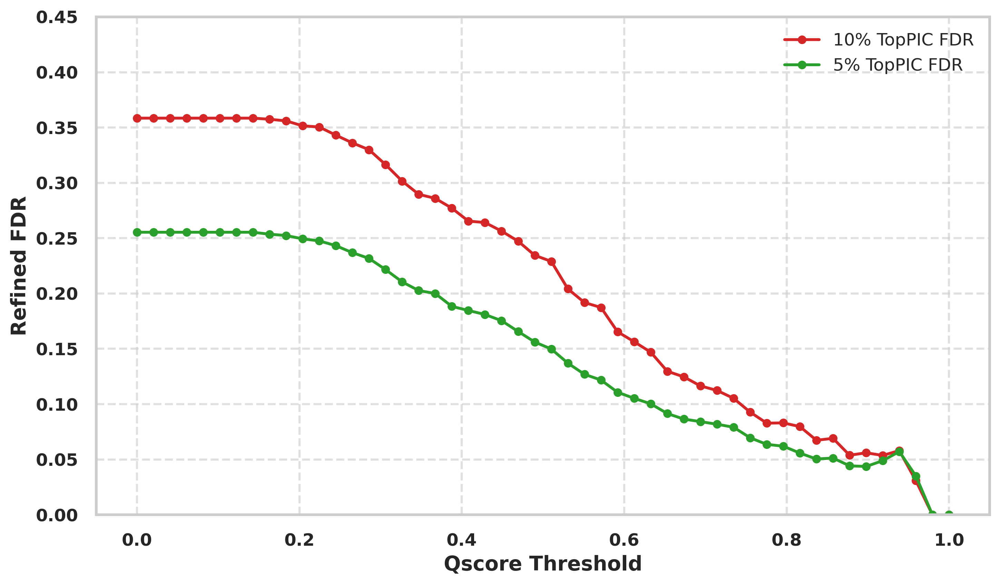

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load precursor Qscore info ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Columns: ScanNum_ms2, PrecursorQscore, TargetDecoyType

# === Load TopPIC result files ===
toppic_file_10 = "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv"
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

# === Merge TopPIC and precursor data ===
df_10 = load_and_merge(toppic_file_10, precursor_info)
df_5 = load_and_merge(toppic_file_5, precursor_info)

# === Refined FDR calculation ===
def calculate_refined_fdr(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        if total == 0:
            refined_fdrs.append(0)
            continue

        # Decoy = either MS1 decoy or TopPIC DECOY hit
        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        refined_fdr = is_decoy.sum() / total
        refined_fdrs.append(refined_fdr)

    return thresholds, refined_fdrs

# === Compute refined FDR curves ===
x_10, y_10 = calculate_refined_fdr(df_10)
x_5, y_5 = calculate_refined_fdr(df_5)

# === Print refined FDR table at specific Qscore thresholds ===
def print_fdr_table(df, label):
    print(f"\nRefined FDR Table for {label}")
    print("Qscore Threshold | Total | Decoys | Refined FDR")
    print("-" * 45)
    for t in [0.4, 0.6, 0.8, 0.9]:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        decoys = is_decoy.sum()
        refined_fdr = decoys / total if total > 0 else 0
        print(f"{t:<17} {total:<6} {decoys:<7} {refined_fdr:.3f}")

print_fdr_table(df_10, "10% TopPIC FDR")
print_fdr_table(df_5, "5% TopPIC FDR")

# === Plotting ===
plt.figure(figsize=(10, 6), dpi=300)

plt.plot(x_10, y_10, color='#d62728', marker='o', linewidth=2, markersize=5, label="10% TopPIC FDR")
plt.plot(x_5, y_5, color='#2ca02c', marker='o', linewidth=2, markersize=5, label="5% TopPIC FDR")

plt.xlabel("Qscore Threshold", fontsize=14, fontweight='bold')
plt.ylabel("Refined FDR", fontsize=14, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12, frameon=False)
plt.ylim(0, 0.45)

plt.tight_layout()
plt.show()



Refined FDR Table for 10% TopPIC FDR
Qscore Threshold | Total | Decoys | Refined FDR
---------------------------------------------
0.4               388    89      0.229
0.6               327    46      0.141
0.8               268    22      0.082
0.9               211    13      0.062

Refined FDR Table for 5% TopPIC FDR
Qscore Threshold | Total | Decoys | Refined FDR
---------------------------------------------
0.4               354    65      0.184
0.6               307    34      0.111
0.8               257    16      0.062
0.9               205    9       0.044

Refined FDR Table for 1% TopPIC FDR (filtered by Q-value ≤ 0.01)
Qscore Threshold | Total | Decoys | Refined FDR
---------------------------------------------
0.4               326    49      0.150
0.6               287    26      0.091
0.8               243    11      0.045
0.9               196    6       0.031
=== Total Identifications BEFORE Qscore Filtering ===
10% TopPIC FDR: Total = 2349, Decoys = 266, Refined FDR

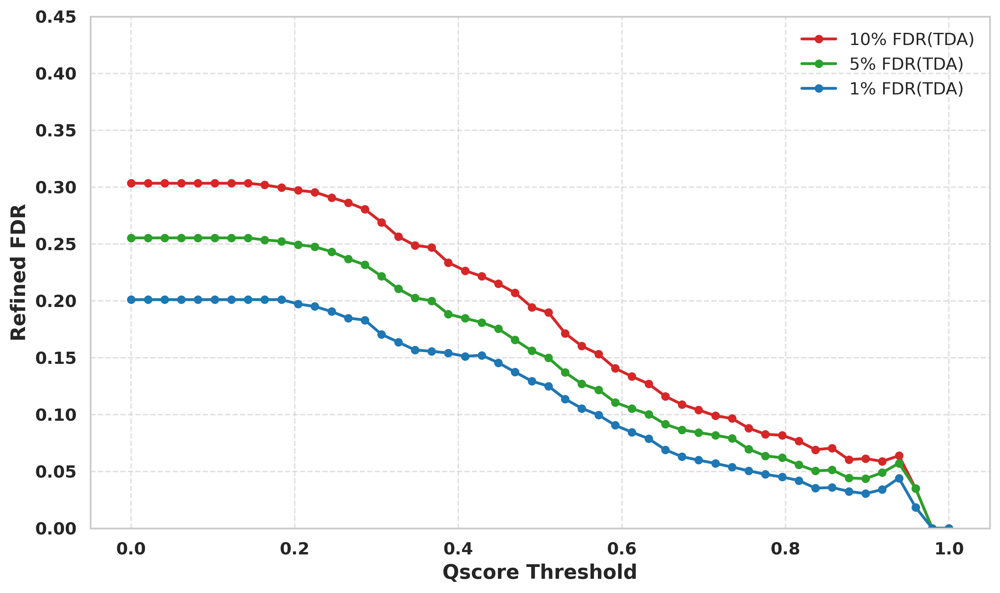

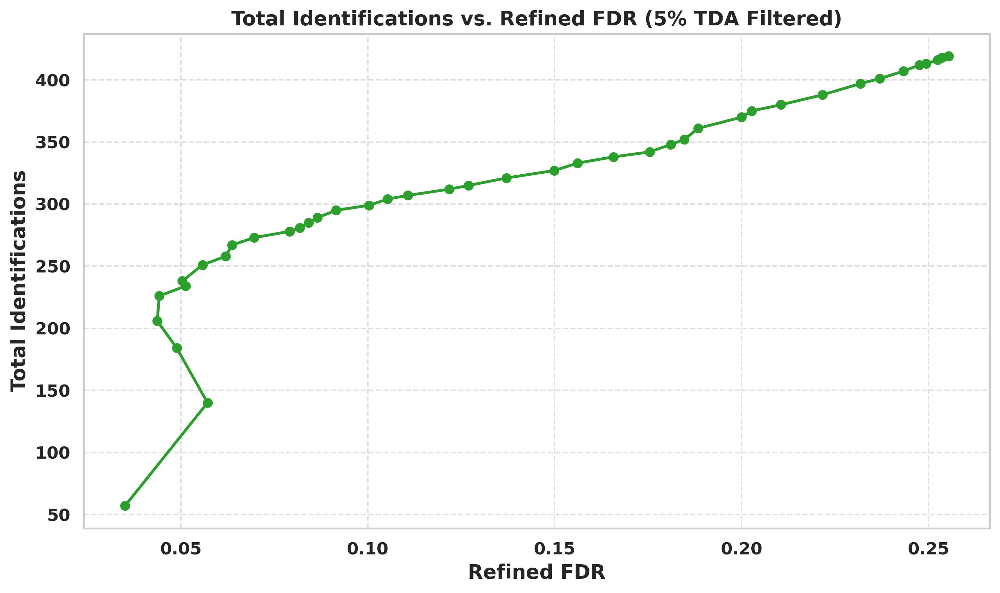

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load precursor Qscore info ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Columns: ScanNum_ms2, PrecursorQscore, TargetDecoyType

# === Load TopPIC result files ===
toppic_file_10 = "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv"
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

# === Merge TopPIC and precursor data ===
df_10 = load_and_merge(toppic_file_10, precursor_info)
df_5 = load_and_merge(toppic_file_5, precursor_info)

# === Extract 1% FDR subset from TopPIC file using proteoform-level Q-value ===
df_1 = df_10[df_10["Proteoform-level Q-value"] <= 0.01].copy()  # Use 10% file to extract lower FDR subset

# === Refined FDR calculation ===
def calculate_refined_fdr(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        if total == 0:
            refined_fdrs.append(0)
            continue

        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        refined_fdr = is_decoy.sum() / total
        refined_fdrs.append(refined_fdr)

    return thresholds, refined_fdrs

# === Compute refined FDR curves ===
x_10, y_10 = calculate_refined_fdr(df_10)
x_5, y_5 = calculate_refined_fdr(df_5)
x_1, y_1 = calculate_refined_fdr(df_1)

# === Print refined FDR table at specific Qscore thresholds ===
def print_fdr_table(df, label):
    print(f"\nRefined FDR Table for {label}")
    print("Qscore Threshold | Total | Decoys | Refined FDR")
    print("-" * 45)
    for t in [0.4, 0.6, 0.8, 0.9]:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        decoys = is_decoy.sum()
        refined_fdr = decoys / total if total > 0 else 0
        print(f"{t:<17} {total:<6} {decoys:<7} {refined_fdr:.3f}")

print_fdr_table(df_10, "10% TopPIC FDR")
print_fdr_table(df_5, "5% TopPIC FDR")
print_fdr_table(df_1, "1% TopPIC FDR (filtered by Q-value ≤ 0.01)")

# === Total identifications without Qscore filtering ===
def print_total_ids(df, label):
    total = len(df)
    decoys = ((df["Protein accession"].str.contains("DECOY", na=False)) | (df["TargetDecoyType"] > 0)).sum()
    refined_fdr = decoys / total if total > 0 else 0
    print(f"{label}: Total = {total}, Decoys = {decoys}, Refined FDR = {refined_fdr:.3f}")

print("=== Total Identifications BEFORE Qscore Filtering ===")
print_total_ids(df_10, "10% TopPIC FDR")
print_total_ids(df_5, "5% TopPIC FDR")
print_total_ids(df_1, "1% TopPIC FDR (filtered by Q-value ≤ 0.01)")


# === Plotting ===
plt.figure(figsize=(10, 6), dpi=300)

plt.plot(x_10, y_10, color='#d62728', marker='o', linewidth=2, markersize=5, label="10% FDR(TDA)")
plt.plot(x_5, y_5, color='#2ca02c', marker='o', linewidth=2, markersize=5, label="5% FDR(TDA)")
plt.plot(x_1, y_1, color='#1f77b4', marker='o', linewidth=2, markersize=5, label="1% FDR(TDA)")

plt.xlabel("Qscore Threshold", fontsize=14, fontweight='bold')
plt.ylabel("Refined FDR", fontsize=14, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12, frameon=False)
plt.ylim(0, 0.45)

plt.tight_layout()
plt.show()
# === Refined FDR vs Total Identifications calculation ===
def calculate_refined_fdr_and_counts(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []
    total_ids = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        if total == 0:
            continue
        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        refined_fdr = is_decoy.sum() / total
        refined_fdrs.append(refined_fdr)
        total_ids.append(total)

    return refined_fdrs, total_ids

# === Compute refined FDR vs total IDs using 5% TopPIC file only ===
refined_fdrs_5, total_ids_5 = calculate_refined_fdr_and_counts(df_5)

# === Plotting: Refined FDR vs Total Identifications ===
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(refined_fdrs_5, total_ids_5, marker='o', color='#2ca02c', linewidth=2, label="5% FDR (TDA)")

plt.xlabel("Refined FDR", fontsize=14, fontweight='bold')
plt.ylabel("Total Identifications", fontsize=14, fontweight='bold')
plt.title("Total Identifications vs. Refined FDR (5% TDA Filtered)", fontsize=14, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


At TopPIC 5% proteoform-level Q-value:
Total IDs = 2052, Decoys = 167, Refined FDR = 0.081


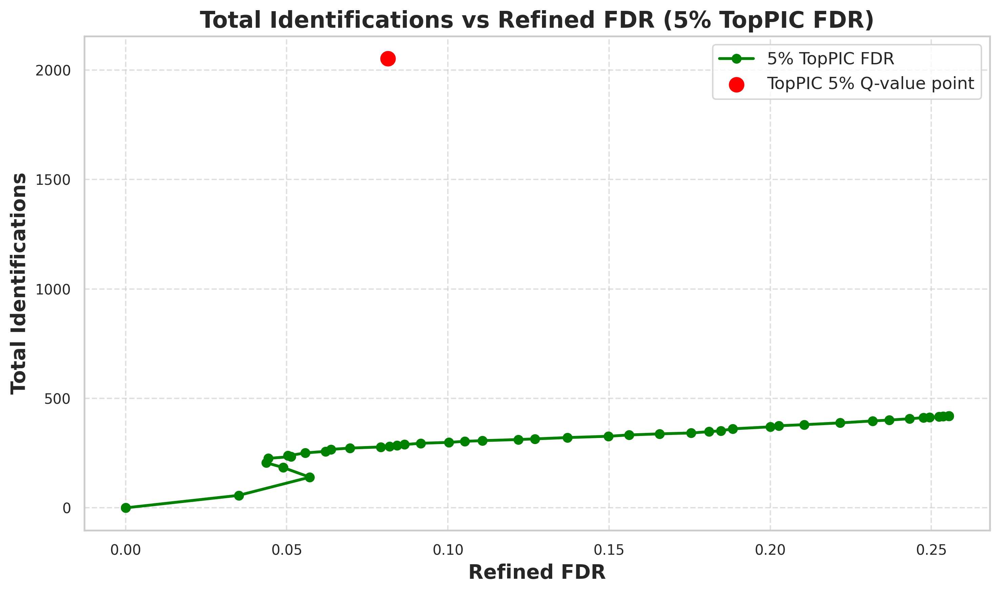

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load precursor Qscore info ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Columns: ScanNum_ms2, PrecursorQscore, TargetDecoyType

# === Load TopPIC result files ===
toppic_file_10 = "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv"
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

# === Merge TopPIC and precursor data ===
df_5 = load_and_merge(toppic_file_5, precursor_info)

# === Calculate refined FDR and total identifications for different Qscore thresholds ===
def compute_refined_fdr_and_total(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []
    total_ids = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        if total == 0:
            refined_fdrs.append(0)
            total_ids.append(0)
            continue

        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        refined_fdr = is_decoy.sum() / total

        refined_fdrs.append(refined_fdr)
        total_ids.append(total)

    return thresholds, refined_fdrs, total_ids

# Compute for 5% TopPIC file
qscore_thresholds, refined_fdrs, total_ids = compute_refined_fdr_and_total(df_5)

# Find the proteoform-level Q-value closest to 0.05 in df_5
qval_target = 0.05
# Find subset with Q-value <= 0.05
subset_5pct = df_5[df_5["Proteoform-level Q-value"] <= qval_target]

# Calculate total identifications and refined FDR for that subset
total_5pct = len(subset_5pct)
decoy_5pct = ((subset_5pct["Protein accession"].str.contains("DECOY", na=False)) | (subset_5pct["TargetDecoyType"] > 0)).sum()
refined_fdr_5pct = decoy_5pct / total_5pct if total_5pct > 0 else 0

print(f"At TopPIC 5% proteoform-level Q-value:")
print(f"Total IDs = {total_5pct}, Decoys = {decoy_5pct}, Refined FDR = {refined_fdr_5pct:.3f}")

# Plot total IDs vs refined FDR
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(refined_fdrs, total_ids, marker='o', color='green', linewidth=2, markersize=6, label='5% TopPIC FDR')

# Mark the point at TopPIC 5% Q-value
plt.scatter(refined_fdr_5pct, total_5pct, color='red', s=100, zorder=5, label='TopPIC 5% Q-value point')

plt.xlabel("Refined FDR", fontsize=14, fontweight='bold')
plt.ylabel("Total Identifications", fontsize=14, fontweight='bold')
plt.title("Total Identifications vs Refined FDR (5% TopPIC FDR)", fontsize=16, fontweight='bold')

plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


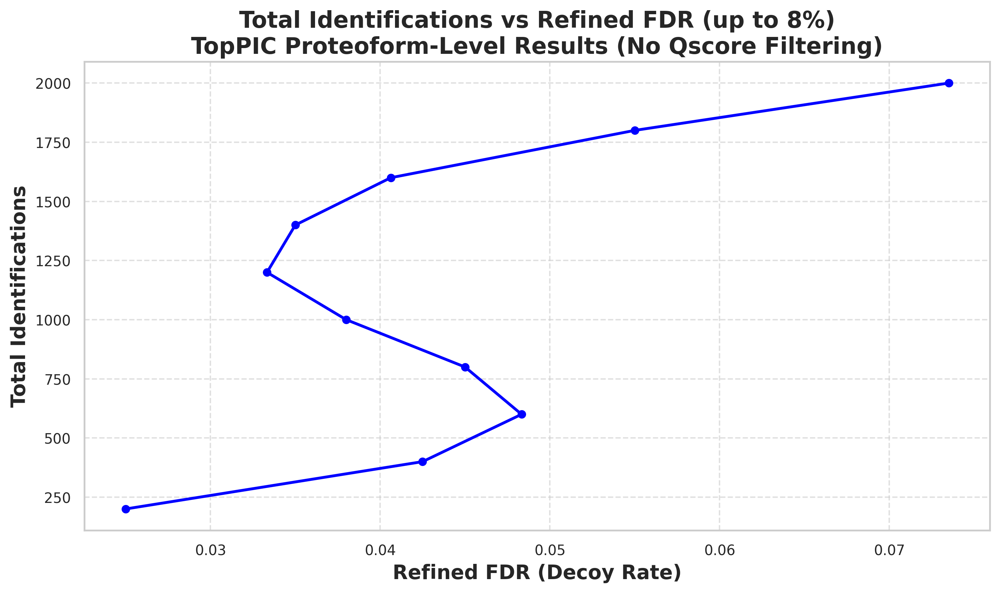

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load precursor Qscore info ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Contains ScanNum_ms2, PrecursorQscore, TargetDecoyType

# === Load TopPIC 5% FDR result file ===
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

df_5 = load_and_merge(toppic_file_5, precursor_info)

# Sort by TopPIC proteoform-level Q-value ascending (best hits first)
df_sorted = df_5.sort_values("Proteoform-level Q-value").reset_index(drop=True)



refined_fdrs = []
total_ids = []
step = 200

for i in range(step, len(df_sorted)+1, step):
    subset = df_sorted.iloc[:i]
    total = len(subset)

    decoys_toppic = subset["Protein accession"].str.contains("DECOY", na=False).sum()

    precursor_decoy_mask = (subset["TargetDecoyType"] > 0) & (~subset["Protein accession"].str.contains("DECOY", na=False))
    decoys_precursor = precursor_decoy_mask.sum()

    decoys_total = decoys_toppic + decoys_precursor

    refined_fdr = decoys_total / total if total > 0 else 0

    if refined_fdr <= 0.08:
        refined_fdrs.append(refined_fdr)
        total_ids.append(total)
    else:
        break

plt.figure(figsize=(10, 6), dpi=300)
plt.plot(refined_fdrs, total_ids, marker='o', linestyle='-', color='blue', linewidth=2, markersize=5)
plt.xlabel("Refined FDR (Decoy Rate)", fontsize=14, fontweight='bold')
plt.ylabel("Total Identifications", fontsize=14, fontweight='bold')
plt.title("Total Identifications vs Refined FDR (up to 8%)\nTopPIC Proteoform-Level Results (No Qscore Filtering)", fontsize=16, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



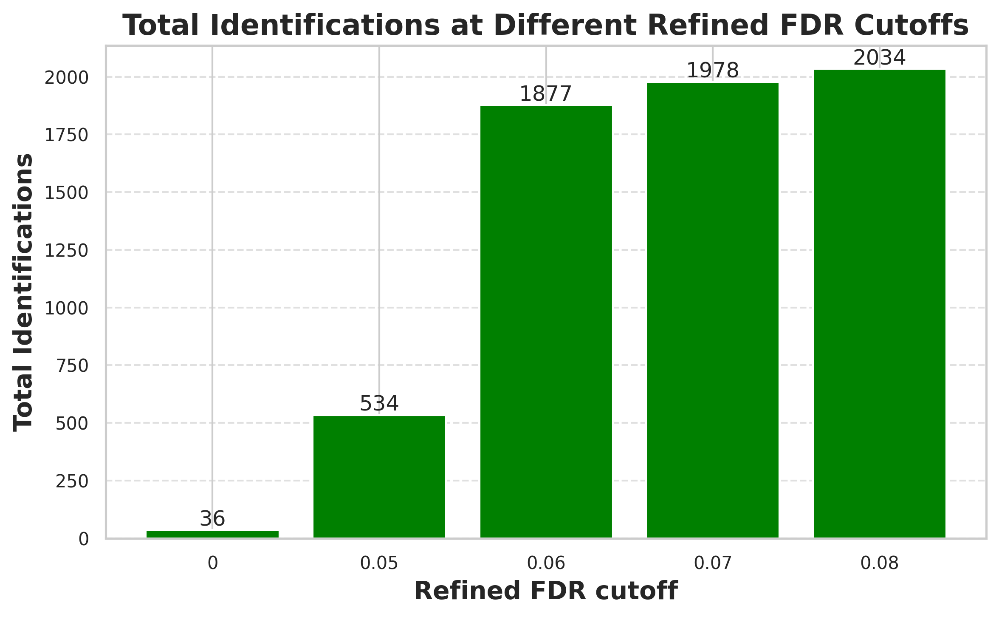

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Assuming df_sorted is already prepared and sorted by PrecursorQscore descending ---

# Define the FDR cutoff points you want to plot
fdr_cutoffs = [0, 0.05, 0.06, 0.07, 0.08]

# Function to calculate refined FDR and total IDs for a given subset
def get_ids_at_fdr_cutoff(df, cutoff):
    subset = df.copy()
    # Calculate refined FDR over the entire df_sorted first
    # Here we will select all rows where refined FDR <= cutoff
    # But since refined FDR is cumulative, better to do it by checking all subsets with increasing number of IDs

    # We'll iterate over the dataset from top (highest Qscore) down to get IDs up to the cutoff
    for i in range(1, len(subset) + 1):
        current = subset.iloc[:i]
        total = len(current)
        decoys_toppic = current["Protein accession"].str.contains("DECOY", na=False).sum()
        precursor_decoy_mask = (current["TargetDecoyType"] > 0) & (~current["Protein accession"].str.contains("DECOY", na=False))
        decoys_precursor = precursor_decoy_mask.sum()
        decoys_total = decoys_toppic + decoys_precursor
        refined_fdr = decoys_total / total if total > 0 else 0

        # If refined FDR exceeds cutoff, return previous count
        if refined_fdr > cutoff:
            return i - 1  # total IDs just before FDR exceeded cutoff
    return len(subset)  # if never exceeded cutoff, return full length

# Load and prepare your df_sorted here (sorted by PrecursorQscore descending)
# For example:
# df_sorted = df_5.sort_values(by="PrecursorQscore", ascending=False).reset_index(drop=True)

# For demo, I'll assume df_sorted is prepared already.

# Calculate total IDs at each cutoff
total_ids_at_cutoff = []
for cutoff in fdr_cutoffs:
    ids_count = get_ids_at_fdr_cutoff(df_sorted, cutoff)
    total_ids_at_cutoff.append(ids_count)

# Plot bar chart
plt.figure(figsize=(8,5), dpi=300)
bars = plt.bar([str(c) for c in fdr_cutoffs], total_ids_at_cutoff, color='green')
plt.xlabel("Refined FDR cutoff", fontsize=14, fontweight='bold')
plt.ylabel("Total Identifications", fontsize=14, fontweight='bold')
plt.title("Total Identifications at Different Refined FDR Cutoffs", fontsize=16, fontweight='bold')
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Optional: label each bar with its count
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, str(height), ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()


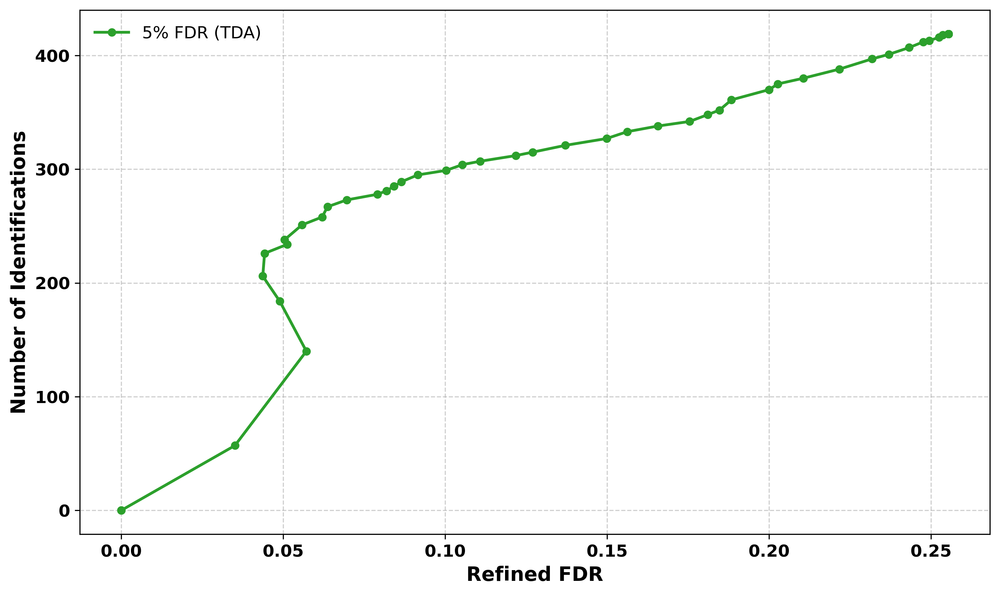

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load precursor Qscore info ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Columns: ScanNum_ms2, PrecursorQscore, TargetDecoyType

# === Load TopPIC result file for 5% FDR ===
toppic_file_5 = "/content/spectra_ms2_toppic_proteoform_single.tsv"

def load_and_merge(toppic_file, precursor_info):
    toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
    toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
    merged = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")
    return merged

# === Merge TopPIC and precursor data ===
df_5 = load_and_merge(toppic_file_5, precursor_info)

# === Refined FDR and ID count calculation ===
def calculate_refined_fdr_and_ids(df):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []
    total_ids = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        total = len(filtered)
        total_ids.append(total)

        if total == 0:
            refined_fdrs.append(0)
            continue

        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        refined_fdr = is_decoy.sum() / total
        refined_fdrs.append(refined_fdr)

    return refined_fdrs, total_ids

# === Compute for 5% FDR ===
refined_fdrs_5, num_ids_5 = calculate_refined_fdr_and_ids(df_5)

# === Plot: Number of Identifications vs Refined FDR ===
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(refined_fdrs_5, num_ids_5, color='#2ca02c', marker='o', linewidth=2, markersize=5, label="5% FDR (TDA)")

plt.xlabel("Refined FDR", fontsize=14, fontweight='bold')
plt.ylabel("Number of Identifications", fontsize=14, fontweight='bold')

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12, frameon=False)

plt.tight_layout()
plt.show()


In [2]:
import pandas as pd

# ✅ Load Data Files
file_aq = pd.read_csv("FileAQ.tsv", sep="\t")  # MS2 matched with precursor masses
toppic_data = pd.read_csv("spectra_ms2_toppic_proteoform_single.tsv", sep="\t", skiprows=26)  # TopPIC result

# ✅ Step 2: Preprocess File AQ
target_precursors = file_aq[file_aq["TargetDecoyType"] == 0]
decoy_precursors = file_aq[file_aq["TargetDecoyType"] > 0]

# ✅ Step 3: Match TopPIC Identifications with Precursor Labels
toppic_data.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)
matched_toppic = toppic_data.merge(file_aq, on="ScanNum", how="left")

# ✅ Step 4: Count
total_ms2_spectra = file_aq.shape[0]
target_precursors_count = target_precursors.shape[0]
decoy_precursors_count = decoy_precursors.shape[0]

# ✅ Step 5: Count TopPIC Identifications
target_toppic_from_targets = matched_toppic[matched_toppic["TargetDecoyType"] == 0].shape[0]
target_toppic_from_decoys = matched_toppic[matched_toppic["TargetDecoyType"] > 0].shape[0]

decoy_toppic_from_targets = matched_toppic[
    (matched_toppic["Protein accession"].str.contains("DECOY", na=False)) &
    (matched_toppic["TargetDecoyType"] == 0)
].shape[0]

decoy_toppic_from_decoys = matched_toppic[
    (matched_toppic["Protein accession"].str.contains("DECOY", na=False)) &
    (matched_toppic["TargetDecoyType"] > 0)
].shape[0]

# ✅ TDA FDR and Refined FDR Calculation
total_identifications = matched_toppic.shape[0]
ms2_decoy_hits = target_toppic_from_decoys + decoy_toppic_from_decoys
ms1_decoy_hits = decoy_toppic_from_targets + decoy_toppic_from_decoys
refined_decoy_hits = ms1_decoy_hits + ms2_decoy_hits

tda_fdr = ms2_decoy_hits / total_identifications * 100
refined_fdr = refined_decoy_hits / total_identifications * 100

# ✅ Print Sankey-Style and FDR Values
print(f"Total_MS2 [{total_ms2_spectra}] Matched_Precursors")
print(f"Matched_Precursors [{target_precursors_count}] Target_Precursors")
print(f"Matched_Precursors [{decoy_precursors_count}] Decoy_Precursors")
print(f"Target_Precursors [{target_toppic_from_targets}] TopPIC_Targets_From_Targets")
print(f"Decoy_Precursors [{target_toppic_from_decoys}] TopPIC_Targets_From_Decoys")
print(f"Target_Precursors [{decoy_toppic_from_targets}] TopPIC_Decoys_From_Targets")
print(f"Decoy_Precursors [{decoy_toppic_from_decoys}] TopPIC_Decoys_From_Decoys")

# ✅ Print FDR Stats
print("\n=== FDR Check ===")
print(f"Total Identifications: {total_identifications}")
print(f"MS2 Decoy Hits (TDA FDR numerator): {ms2_decoy_hits}")
print(f"MS1 Decoy Hits: {ms1_decoy_hits}")
print(f"TDA FDR: {tda_fdr:.2f}%")
print(f"Refined FDR: {refined_fdr:.2f}%")
# Count total decoy identifications in TopPIC file (regardless of precursor match)
total_decoys_in_toppic = toppic_data["Protein accession"].str.contains("DECOY", na=False).sum()
print(f"Total decoy identifications in TopPIC file: {total_decoys_in_toppic}")



Total_MS2 [2638] Matched_Precursors
Matched_Precursors [2167] Target_Precursors
Matched_Precursors [471] Decoy_Precursors
Target_Precursors [0] TopPIC_Targets_From_Targets
Decoy_Precursors [0] TopPIC_Targets_From_Decoys
Target_Precursors [0] TopPIC_Decoys_From_Targets
Decoy_Precursors [0] TopPIC_Decoys_From_Decoys

=== FDR Check ===
Total Identifications: 2052
MS2 Decoy Hits (TDA FDR numerator): 0
MS1 Decoy Hits: 0
TDA FDR: 0.00%
Refined FDR: 0.00%
Total decoy identifications in TopPIC file: 78


In [38]:
# ✅ Step 0: Install pyopenms if not already installed
try:
    import pyopenms
except ImportError:
    !pip install pyopenms -q
    import pyopenms

# ✅ Step 1: Import libraries
import pandas as pd
import numpy as np
from pyopenms import ModificationsDB

# ✅ Step 2: Load TopPIC result file
toppic_file = "spectra_ms2_toppic_proteoform_single.tsv"
toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)

# ✅ Step 3: Filter based on Q-value
toppic_df["Q-value"] = pd.to_numeric(toppic_df["Proteoform-level Q-value"], errors="coerce")
df_low_fdr = toppic_df[toppic_df["Q-value"] <= 0.01]
df_high_fdr = toppic_df[toppic_df["Q-value"] > 0.01]

# ✅ Step 4: Extract delta masses from "unexpected modifications"
def extract_delta_masses(df):
    delta_masses = []
    df["unexpected modifications"] = df["unexpected modifications"].astype(str)
    for entry in df["unexpected modifications"]:
        if entry != "0" and entry not in ["-", "None", "nan", "NaN", ""]:
            try:
                delta_mass = float(entry.split(":")[0].strip())
                if -150 <= delta_mass <= 150:
                    delta_masses.append(delta_mass)
            except ValueError:
                continue
    return np.array(delta_masses)

delta_masses_low = extract_delta_masses(df_low_fdr)
delta_masses_high = extract_delta_masses(df_high_fdr)

# ✅ Step 5: Get all UniMod PTMs via pyopenms
mod_db = ModificationsDB()
all_unimod_masses = []
all_unimod_names = []

for i in range(mod_db.getNumberOfModifications()):
    mod = mod_db.getModification(i)
    mass = mod.getDiffMonoMass()
    name = mod.getFullId()
    if -150 <= mass <= 150:
        all_unimod_masses.append(mass)
        all_unimod_names.append(name)

all_unimod_masses = np.array(all_unimod_masses)

# ✅ Step 6: Match delta masses to UniMod (±0.1 Da tolerance)
tolerance = 0.1

def count_explained_masses(delta_masses, unimod_masses, tolerance):
    matched = np.any(np.abs(delta_masses[:, None] - unimod_masses) <= tolerance, axis=1)
    return np.sum(matched), len(delta_masses)

matched_low, total_low = count_explained_masses(delta_masses_low, all_unimod_masses, tolerance)
matched_high, total_high = count_explained_masses(delta_masses_high, all_unimod_masses, tolerance)

# ✅ Step 7: Compute and report percentages
explained_low_fdr = (matched_low / total_low) * 100 if total_low > 0 else 0
explained_high_fdr = (matched_high / total_high) * 100 if total_high > 0 else 0

print(f"✅ Percentage of Explained Modifications (FDR ≤ 1%): {explained_low_fdr:.2f}%")
print(f"✅ Percentage of Explained Modifications (FDR > 1%): {explained_high_fdr:.2f}%")

# ✅ Step 8: Save match annotations to TSV files
def annotate_matches(delta_masses, unimod_masses, unimod_names, tolerance):
    annotated = []
    for mass in delta_masses:
        match_indices = np.where(np.abs(mass - unimod_masses) <= tolerance)[0]
        if len(match_indices) > 0:
            matched_name = "; ".join([unimod_names[i] for i in match_indices])
        else:
            matched_name = "Unmatched"
        annotated.append((mass, matched_name))
    return pd.DataFrame(annotated, columns=["Observed Mass", "UniMod Match"])

matched_df_low = annotate_matches(delta_masses_low, all_unimod_masses, all_unimod_names, tolerance)
matched_df_high = annotate_matches(delta_masses_high, all_unimod_masses, all_unimod_names, tolerance)

matched_df_low.to_csv("UniMod_Matched_FDR_Low.tsv", sep="\t", index=False)
matched_df_high.to_csv("UniMod_Matched_FDR_High.tsv", sep="\t", index=False)

print("✅ Match results saved to:")
print("   - UniMod_Matched_FDR_Low.tsv")
print("   - UniMod_Matched_FDR_High.tsv")


✅ Percentage of Explained Modifications (FDR ≤ 1%): 54.08%
✅ Percentage of Explained Modifications (FDR > 1%): 28.05%
✅ Match results saved to:
   - UniMod_Matched_FDR_Low.tsv
   - UniMod_Matched_FDR_High.tsv


<ipython-input-38-2ff781120c65>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["unexpected modifications"] = df["unexpected modifications"].astype(str)
<ipython-input-38-2ff781120c65>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["unexpected modifications"] = df["unexpected modifications"].astype(str)


In [46]:
# ✅ Step 0: Install pyopenms if not already installed
try:
    import pyopenms
except ImportError:
    !pip install pyopenms -q
    import pyopenms

# ✅ Step 1: Import libraries
import pandas as pd
import numpy as np
from pyopenms import ModificationsDB

# ✅ Step 2: Load TopPIC result file
toppic_file = "spectra_ms2_toppic_proteoform_single.tsv"
toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)

# ✅ Step 3: Filter based on refined FDR cutoff ≤ 6%
toppic_df["Q-value"] = pd.to_numeric(toppic_df["Proteoform-level Q-value"], errors="coerce")
refined_fdr_cutoff = 0.03  # 6%
df_low_fdr = toppic_df[toppic_df["Q-value"] <= refined_fdr_cutoff]
df_high_fdr = toppic_df[toppic_df["Q-value"] > refined_fdr_cutoff]

# ✅ Step 4: Extract delta masses from "unexpected modifications"
def extract_delta_masses(df):
    delta_masses = []
    df["unexpected modifications"] = df["unexpected modifications"].astype(str)
    for entry in df["unexpected modifications"]:
        if entry != "0" and entry not in ["-", "None", "nan", "NaN", ""]:
            try:
                delta_mass = float(entry.split(":")[0].strip())
                if -150 <= delta_mass <= 150:
                    delta_masses.append(delta_mass)
            except ValueError:
                continue
    return np.array(delta_masses)

delta_masses_low = extract_delta_masses(df_low_fdr)
delta_masses_high = extract_delta_masses(df_high_fdr)

# ✅ Step 5: Get all UniMod PTMs via pyopenms
mod_db = ModificationsDB()
all_unimod_masses = []
all_unimod_names = []

for i in range(mod_db.getNumberOfModifications()):
    mod = mod_db.getModification(i)
    mass = mod.getDiffMonoMass()
    name = mod.getFullId()
    if -150 <= mass <= 150:
        all_unimod_masses.append(mass)
        all_unimod_names.append(name)

all_unimod_masses = np.array(all_unimod_masses)

# ✅ Step 6: Match delta masses to UniMod (±0.1 Da tolerance)
tolerance = 0.1

def count_explained_masses(delta_masses, unimod_masses, tolerance):
    matched = np.any(np.abs(delta_masses[:, None] - unimod_masses) <= tolerance, axis=1)
    return np.sum(matched), len(delta_masses)

matched_low, total_low = count_explained_masses(delta_masses_low, all_unimod_masses, tolerance)
matched_high, total_high = count_explained_masses(delta_masses_high, all_unimod_masses, tolerance)

# ✅ Step 7: Compute and report percentages
explained_low_fdr = (matched_low / total_low) * 100 if total_low > 0 else 0
explained_high_fdr = (matched_high / total_high) * 100 if total_high > 0 else 0

print(f"✅ Percentage of Explained Modifications (FDR ≤ {refined_fdr_cutoff*100:.0f}%): {explained_low_fdr:.2f}%")
print(f"✅ Percentage of Explained Modifications (FDR > {refined_fdr_cutoff*100:.0f}%): {explained_high_fdr:.2f}%")

# ✅ Step 8: Save match annotations to TSV files
def annotate_matches(delta_masses, unimod_masses, unimod_names, tolerance):
    annotated = []
    for mass in delta_masses:
        match_indices = np.where(np.abs(mass - unimod_masses) <= tolerance)[0]
        if len(match_indices) > 0:
            matched_name = "; ".join([unimod_names[i] for i in match_indices])
        else:
            matched_name = "Unmatched"
        annotated.append((mass, matched_name))
    return pd.DataFrame(annotated, columns=["Observed Mass", "UniMod Match"])

matched_df_low = annotate_matches(delta_masses_low, all_unimod_masses, all_unimod_names, tolerance)
matched_df_high = annotate_matches(delta_masses_high, all_unimod_masses, all_unimod_names, tolerance)

matched_df_low.to_csv("UniMod_Matched_FDR_Low.tsv", sep="\t", index=False)
matched_df_high.to_csv("UniMod_Matched_FDR_High.tsv", sep="\t", index=False)

print("✅ Match results saved to:")
print("   - UniMod_Matched_FDR_Low.tsv")
print("   - UniMod_Matched_FDR_High.tsv")


✅ Percentage of Explained Modifications (FDR ≤ 3%): 52.26%
✅ Percentage of Explained Modifications (FDR > 3%): 21.21%
✅ Match results saved to:
   - UniMod_Matched_FDR_Low.tsv
   - UniMod_Matched_FDR_High.tsv


<ipython-input-46-31c3bed9fe62>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["unexpected modifications"] = df["unexpected modifications"].astype(str)
<ipython-input-46-31c3bed9fe62>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["unexpected modifications"] = df["unexpected modifications"].astype(str)


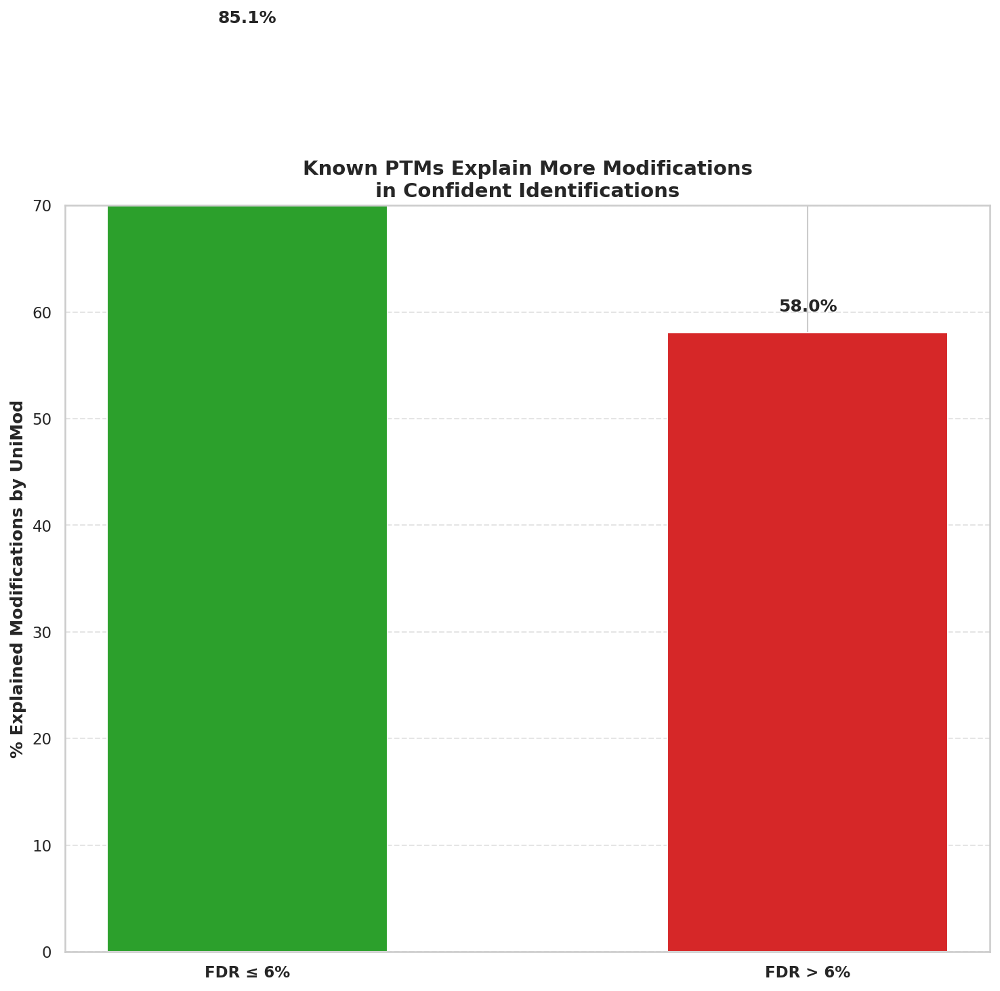

In [43]:
import matplotlib.pyplot as plt

# Data
labels = ["FDR ≤ 5%", "FDR > 5%"]
explained_percentages = [85.1, 58.05]
colors = ["#2ca02c", "#d62728"]

# Plot
plt.figure(figsize=(10, 10), dpi=150)
bars = plt.bar(labels, explained_percentages, color=colors, width=0.5)

# Annotate bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, yval + 2, f"{yval:.1f}%", ha='center', fontsize=12, fontweight='bold')

# Styling
plt.ylim(0, 70)
plt.ylabel("% Explained Modifications by UniMod", fontsize=12, fontweight='bold')
plt.title("Known PTMs Explain More Modifications\nin Confident Identifications", fontsize=14, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()



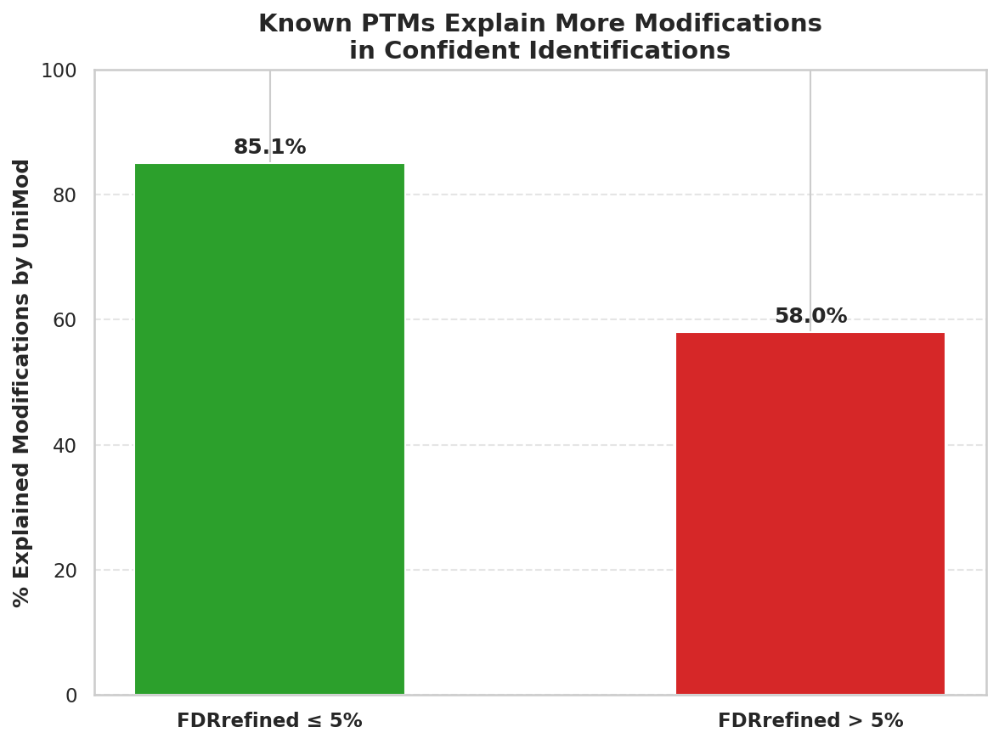

In [47]:
import matplotlib.pyplot as plt

# Data
labels = ["FDRrefined ≤ 5%", "FDRrefined > 5%"]
explained_percentages = [85.1, 58.05]
colors = ["#2ca02c", "#d62728"]

# Plot
plt.figure(figsize=(8, 6), dpi=150)
bars = plt.bar(labels, explained_percentages, color=colors, width=0.5)

# Annotate bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, yval + 1.5, f"{yval:.1f}%", ha='center', fontsize=12, fontweight='bold')

# Styling
plt.ylim(0, 100)  # Increased ylim to cover 100%
plt.ylabel("% Explained Modifications by UniMod", fontsize=12, fontweight='bold')
plt.title("Known PTMs Explain More Modifications\nin Confident Identifications", fontsize=14, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


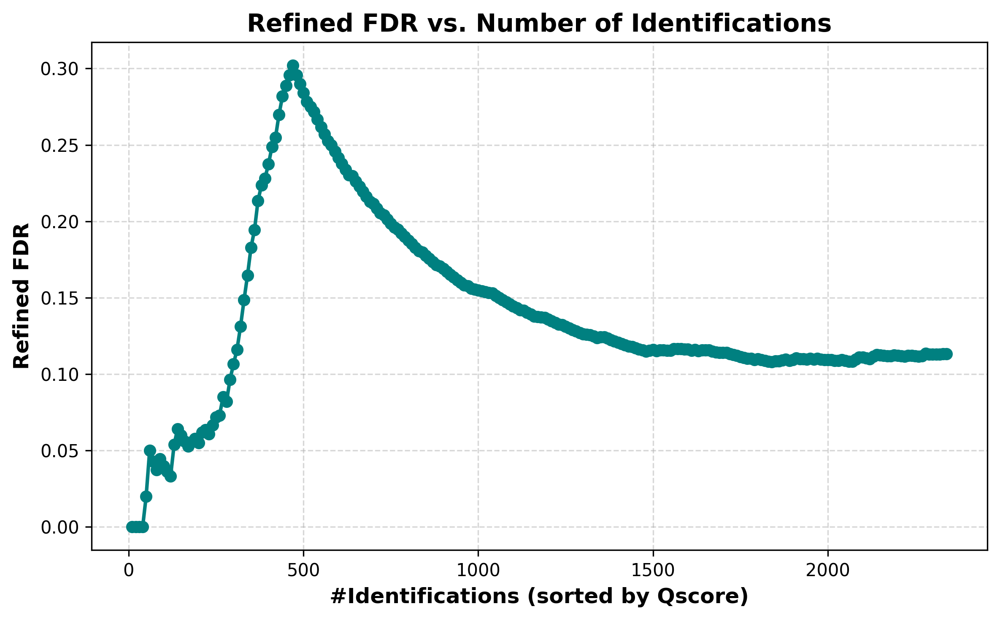

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load precursor Qscore info ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # ScanNum_ms2, PrecursorQscore, TargetDecoyType
toppic_file = "/content/spectra_ms2_toppic_proteoform0.1_0.1.tsv"  # Replace with your TopPIC result file
toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)

# === Merge TopPIC and precursor data ===
df = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# === Sort by Qscore descending ===
df_sorted = df.sort_values(by="PrecursorQscore", ascending=False).reset_index(drop=True)

# === Compute cumulative refined FDR ===
total_ids = []
refined_fdrs = []

for i in range(10, len(df_sorted), 10):  # Every 10 IDs
    subset = df_sorted.iloc[:i]
    total = len(subset)
    is_decoy = (subset["Protein accession"].str.contains("DECOY", na=False)) | (subset["TargetDecoyType"] > 0)
    refined_fdr = is_decoy.sum() / total if total > 0 else 0
    total_ids.append(total)
    refined_fdrs.append(refined_fdr)

# === Plotting ===
plt.figure(figsize=(8, 5), dpi=300)
plt.plot(total_ids, refined_fdrs, color="teal", marker='o', linewidth=2)
plt.xlabel("#Identifications (sorted by Qscore)", fontsize=12, fontweight='bold')
plt.ylabel("Refined FDR", fontsize=12, fontweight='bold')
plt.title("Refined FDR vs. Number of Identifications", fontsize=14, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig("refined_fdr_vs_ids.png", dpi=300)
plt.show()


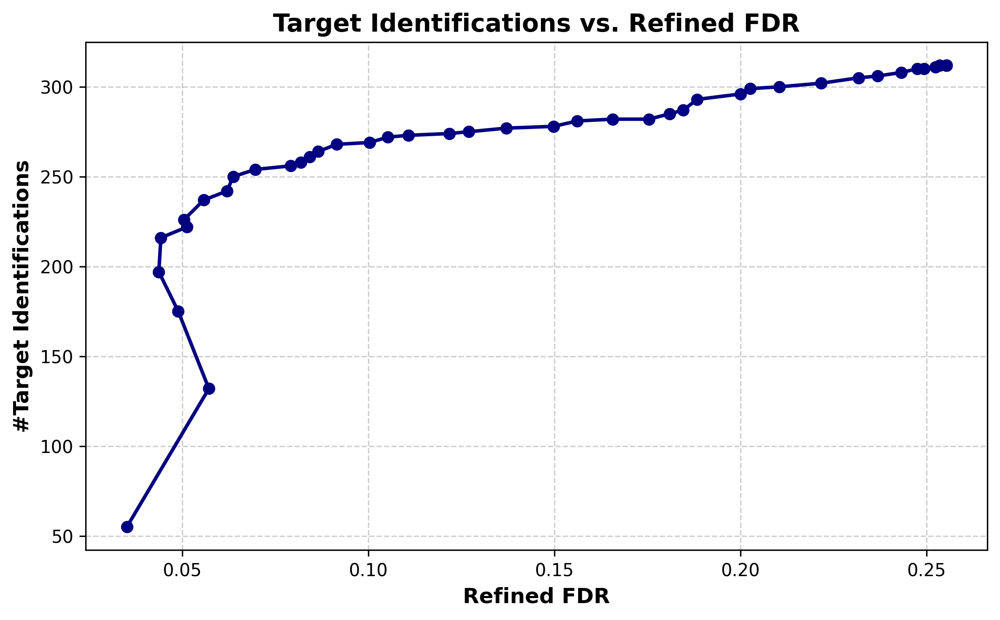

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load data ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Contains PrecursorQscore and TargetDecoyType
toppic_file = "/content/spectra_ms2_toppic_proteoform_single.tsv"  # Replace with your TopPIC file
toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)

# === Merge TopPIC and Qscore info ===
df = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# === Define refined FDR calculation ===
def compute_fdr_vs_targets(df, label):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []
    num_targets = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        if len(filtered) == 0:
            continue
        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        num_decoy = is_decoy.sum()
        num_target = len(filtered) - num_decoy
        refined_fdr = num_decoy / len(filtered)

        refined_fdrs.append(refined_fdr)
        num_targets.append(num_target)

    return refined_fdrs, num_targets

# === Generate data ===
refined_fdrs, num_targets = compute_fdr_vs_targets(df, "TopPIC")

# === Plot ===
plt.figure(figsize=(8, 5), dpi=300)
plt.plot(refined_fdrs, num_targets, marker='o', color='navy', linewidth=2)
plt.xlabel("Refined FDR", fontsize=12, fontweight='bold')
plt.ylabel("#Target Identifications", fontsize=12, fontweight='bold')
plt.title("Target Identifications vs. Refined FDR", fontsize=14, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("targets_vs_refined_fdr.png", dpi=300)
plt.show()


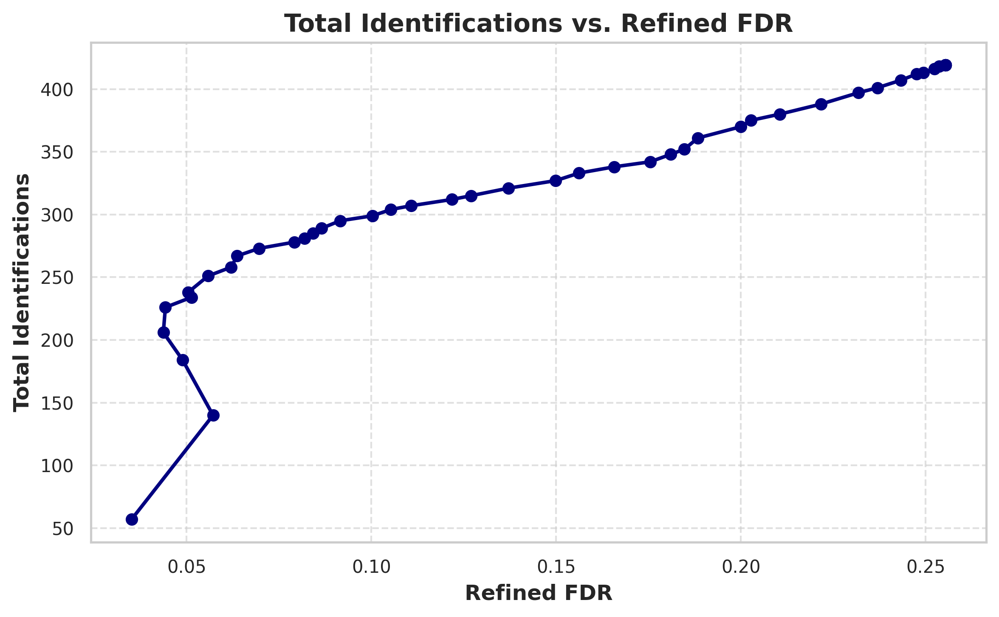

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === Load data ===
precursor_info = pd.read_csv("FileAQ.tsv", sep="\t")  # Contains PrecursorQscore and TargetDecoyType
toppic_file = "/content/spectra_ms2_toppic_proteoform_single.tsv"  # Replace with your TopPIC file
toppic_df = pd.read_csv(toppic_file, sep="\t", skiprows=26)
toppic_df.rename(columns={"Scan(s)": "ScanNum"}, inplace=True)

# === Merge TopPIC and Qscore info ===
df = toppic_df.merge(precursor_info, left_on="ScanNum", right_on="ScanNum_ms2", how="left")

# === Define refined FDR calculation ===
def compute_fdr_vs_total(df, label):
    thresholds = np.linspace(0, 1, 50)
    refined_fdrs = []
    total_ids = []

    for t in thresholds:
        filtered = df[df["PrecursorQscore"] >= t]
        if len(filtered) == 0:
            continue
        is_decoy = (filtered["Protein accession"].str.contains("DECOY", na=False)) | (filtered["TargetDecoyType"] > 0)
        num_decoy = is_decoy.sum()
        refined_fdr = num_decoy / len(filtered)

        refined_fdrs.append(refined_fdr)
        total_ids.append(len(filtered))  # total = target + decoy

    return refined_fdrs, total_ids

# === Generate data ===
refined_fdrs, total_ids = compute_fdr_vs_total(df, "TopPIC")

# === Plot ===
plt.figure(figsize=(8, 5), dpi=300)
plt.plot(refined_fdrs, total_ids, marker='o', color='navy', linewidth=2)
plt.xlabel("Refined FDR", fontsize=12, fontweight='bold')
plt.ylabel("Total Identifications", fontsize=12, fontweight='bold')
plt.title("Total Identifications vs. Refined FDR", fontsize=14, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("total_ids_vs_refined_fdr.png", dpi=300)
plt.show()
